# Import all necessary Libraries

In [37]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import cm
import matplotlib as mpl
from matplotlib.ticker import PercentFormatter
import chartify
from matplotlib import ticker
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
import tensorflow as tf

from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures, MinMaxScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import r2_score, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import mean_squared_error
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, sum, avg, count, desc, when, year, rank, lag, max as spark_max, lit, create_map, when, expr
from pyspark.sql.types import DoubleType, IntegerType
from pyspark.sql.window import Window
from pyspark.sql import SparkSession
from pyspark.sql.types import IntegerType, StringType
import pyspark.sql.functions as F
from itertools import chain

%matplotlib inline



import math
import warnings
warnings.filterwarnings('ignore')


# Loading the dataset

In [2]:


part1 = pd.read_csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part1.csv")
part2 = pd.read_csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part2.csv")
part3 = pd.read_csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part3.csv")
part4 = pd.read_csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part4.csv")
part5 = pd.read_csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part5.csv")
part6 = pd.read_csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part6.csv")
all_parts=pd.concat([part1,part2, part3, part4,part5, part6], ignore_index = True)

print(f"Total rows: {all_parts.shape[0]}")
print(all_parts)
country_codes = pd.read_csv("/Users/sujangauchan/Desktop/Mortality data/country_codes.csv")
print(country_codes)

Total rows: 5143931
         Country  Admin1 SubDiv  Year List Cause  Sex  Frmat  IM_Frmat  \
0           1400     NaN    NaN  2001  101  1000    1      7         8   
1           1400     NaN    NaN  2001  101  1000    2      7         8   
2           1400     NaN    NaN  2001  101  1001    1      7         8   
3           1400     NaN    NaN  2001  101  1001    2      7         8   
4           1400     NaN    NaN  2001  101  1002    1      7         8   
...          ...     ...    ...   ...  ...   ...  ...    ...       ...   
5143926     5020     NaN    NaN  2023  104   Y86    2      0         1   
5143927     5020     NaN    NaN  2023  104  Y881    1      0         1   
5143928     5020     NaN    NaN  2023  104  Y883    1      0         1   
5143929     5020     NaN    NaN  2023  104  Y883    2      0         1   
5143930     5020     NaN    NaN  2023  104  Y890    1      0         1   

         Deaths1  ...  Deaths21  Deaths22  Deaths23  Deaths24  Deaths25  \
0            332

# Preprocessing

In [3]:
#joining country data to get country name
all_parts_with_country = pd.merge(
    all_parts,
    country_codes,
    left_on='Country',
    right_on='country',
    how='left'  # inner join
)

#Loading population data
population = pd.read_csv("/Users/sujangauchan/Desktop/Mortality data/pop.csv")
print(population.head())
print(population.shape)

   Country  Admin1 SubDiv  Year  Sex  Frmat       Pop1      Pop2      Pop3  \
0     1030     NaN    NaN  2021    1      4  1175948.0   26106.0   87398.0   
1     1030     NaN    NaN  2021    2      4  1217451.0   25831.0   86477.0   
2     1060     NaN    NaN  1980    1      7   137100.0    3400.0   15800.0   
3     1060     NaN    NaN  1980    2      7   159000.0    4000.0   18400.0   
4     1125     NaN    NaN  1955    1      2  5051500.0  150300.0  543400.0   

   Pop4  ...     Pop18    Pop19    Pop20    Pop21    Pop22    Pop23  Pop24  \
0   NaN  ...   27217.0  21181.0  13953.0  17519.0      NaN      NaN    NaN   
1   NaN  ...   34925.0  27390.0  17744.0  25801.0      NaN      NaN    NaN   
2   NaN  ...       NaN   5300.0      NaN   2900.0      NaN      NaN    NaN   
3   NaN  ...       NaN   6200.0      NaN   3400.0      NaN      NaN    NaN   
4   NaN  ...  110200.0  51100.0  41600.0  14300.0  11800.0  25300.0    NaN   

   Pop25   Pop26        Lb  
0    NaN     0.0   25765.0  
1   

In [4]:
print(population.columns)
print(all_parts_with_country.columns)

Index(['Country', 'Admin1', 'SubDiv', 'Year', 'Sex', 'Frmat', 'Pop1', 'Pop2',
       'Pop3', 'Pop4', 'Pop5', 'Pop6', 'Pop7', 'Pop8', 'Pop9', 'Pop10',
       'Pop11', 'Pop12', 'Pop13', 'Pop14', 'Pop15', 'Pop16', 'Pop17', 'Pop18',
       'Pop19', 'Pop20', 'Pop21', 'Pop22', 'Pop23', 'Pop24', 'Pop25', 'Pop26',
       'Lb'],
      dtype='object')
Index(['Country', 'Admin1', 'SubDiv', 'Year', 'List', 'Cause', 'Sex', 'Frmat',
       'IM_Frmat', 'Deaths1', 'Deaths2', 'Deaths3', 'Deaths4', 'Deaths5',
       'Deaths6', 'Deaths7', 'Deaths8', 'Deaths9', 'Deaths10', 'Deaths11',
       'Deaths12', 'Deaths13', 'Deaths14', 'Deaths15', 'Deaths16', 'Deaths17',
       'Deaths18', 'Deaths19', 'Deaths20', 'Deaths21', 'Deaths22', 'Deaths23',
       'Deaths24', 'Deaths25', 'Deaths26', 'IM_Deaths1', 'IM_Deaths2',
       'IM_Deaths3', 'IM_Deaths4', 'country', 'name'],
      dtype='object')


In [5]:
# Define common columns to join on
join_keys = ['Country', 'Admin1', 'SubDiv', 'Year', 'Sex', 'Frmat']

# Merge the dataframes on the common keys
all_parts_with_country = pd.merge(all_parts_with_country, population, on=join_keys, how='left')

# View the merged columns and shape
print(all_parts_with_country.columns)
print(all_parts_with_country.shape)
print(all_parts_with_country.head())


Index(['Country', 'Admin1', 'SubDiv', 'Year', 'List', 'Cause', 'Sex', 'Frmat',
       'IM_Frmat', 'Deaths1', 'Deaths2', 'Deaths3', 'Deaths4', 'Deaths5',
       'Deaths6', 'Deaths7', 'Deaths8', 'Deaths9', 'Deaths10', 'Deaths11',
       'Deaths12', 'Deaths13', 'Deaths14', 'Deaths15', 'Deaths16', 'Deaths17',
       'Deaths18', 'Deaths19', 'Deaths20', 'Deaths21', 'Deaths22', 'Deaths23',
       'Deaths24', 'Deaths25', 'Deaths26', 'IM_Deaths1', 'IM_Deaths2',
       'IM_Deaths3', 'IM_Deaths4', 'country', 'name', 'Pop1', 'Pop2', 'Pop3',
       'Pop4', 'Pop5', 'Pop6', 'Pop7', 'Pop8', 'Pop9', 'Pop10', 'Pop11',
       'Pop12', 'Pop13', 'Pop14', 'Pop15', 'Pop16', 'Pop17', 'Pop18', 'Pop19',
       'Pop20', 'Pop21', 'Pop22', 'Pop23', 'Pop24', 'Pop25', 'Pop26', 'Lb'],
      dtype='object')
(5143931, 68)
   Country  Admin1 SubDiv  Year List Cause  Sex  Frmat  IM_Frmat  Deaths1  \
0     1400     NaN    NaN  2001  101  1000    1      7         8      332   
1     1400     NaN    NaN  2001  101  1000    

In [6]:
# causes = all_parts_with_country['Country']

print(all_parts_with_country.columns)

Index(['Country', 'Admin1', 'SubDiv', 'Year', 'List', 'Cause', 'Sex', 'Frmat',
       'IM_Frmat', 'Deaths1', 'Deaths2', 'Deaths3', 'Deaths4', 'Deaths5',
       'Deaths6', 'Deaths7', 'Deaths8', 'Deaths9', 'Deaths10', 'Deaths11',
       'Deaths12', 'Deaths13', 'Deaths14', 'Deaths15', 'Deaths16', 'Deaths17',
       'Deaths18', 'Deaths19', 'Deaths20', 'Deaths21', 'Deaths22', 'Deaths23',
       'Deaths24', 'Deaths25', 'Deaths26', 'IM_Deaths1', 'IM_Deaths2',
       'IM_Deaths3', 'IM_Deaths4', 'country', 'name', 'Pop1', 'Pop2', 'Pop3',
       'Pop4', 'Pop5', 'Pop6', 'Pop7', 'Pop8', 'Pop9', 'Pop10', 'Pop11',
       'Pop12', 'Pop13', 'Pop14', 'Pop15', 'Pop16', 'Pop17', 'Pop18', 'Pop19',
       'Pop20', 'Pop21', 'Pop22', 'Pop23', 'Pop24', 'Pop25', 'Pop26', 'Lb'],
      dtype='object')


In [7]:
# Update the country-to-continent mapping
country_to_continent = {
    'Algeria': 'Africa', 'Angola': 'Africa', 'Benin': 'Africa', 'Botswana': 'Africa', 
    'Burkina Faso': 'Africa', 'Burundi': 'Africa', 'Cameroon': 'Africa', 'Cape Verde': 'Africa', 
    'Central African Republic': 'Africa', 'Chad': 'Africa', 'Comoros': 'Africa', 'Congo': 'Africa', 
    "Cote d'Ivoire": 'Africa', 'Djibouti': 'Africa', 'Egypt': 'Africa', 'Equatorial Guinea': 'Africa', 
    'Eritrea': 'Africa', 'Ethiopia': 'Africa', 'Gabon': 'Africa', 'Gambia': 'Africa', 
    'Ghana': 'Africa', 'Guinea': 'Africa', 'Guinea-Bissau': 'Africa', 'Kenya': 'Africa', 
    'Lesotho': 'Africa', 'Liberia': 'Africa', 'Libyan Arab Jamahiriya': 'Africa', 
    'Madagascar': 'Africa', 'Malawi': 'Africa', 'Mali': 'Africa', 'Mauritania': 'Africa', 
    'Mauritius': 'Africa', 'Mayotte': 'Africa', 'Morocco': 'Africa', 'Mozambique': 'Africa', 
    'Namibia': 'Africa', 'Niger': 'Africa', 'Nigeria': 'Africa', 'Reunion': 'Africa', 
    'Rodrigues': 'Africa', 'Rwanda': 'Africa', 'Sao Tome and Principe': 'Africa', 
    'Senegal': 'Africa', 'Seychelles': 'Africa', 'Sierra Leone': 'Africa', 'Somalia': 'Africa', 
    'South Africa': 'Africa', 'South Sudan': 'Africa', 'Sudan': 'Africa', 'Sudan, Former': 'Africa', 
    'Swaziland': 'Africa', 'Togo': 'Africa', 'Tunisia': 'Africa', 'Uganda': 'Africa', 
    'United Republic of Tanzania': 'Africa', 'Democratic Republic of the Congo': 'Africa', 
    'Zambia': 'Africa', 'Zimbabwe': 'Africa',
    'Anguilla': 'North America', 'Antigua and Barbuda': 'North America', 'Aruba': 'North America', 
    'Bahamas': 'North America', 'Barbados': 'North America', 'Belize': 'North America', 
    'Bermuda': 'North America', 'British Virgin Islands': 'North America', 
    'Canada': 'North America', 'Cayman Islands': 'North America', 'Costa Rica': 'North America', 
    'Cuba': 'North America', 'Dominica': 'North America', 'Dominican Republic': 'North America', 
    'El Salvador': 'North America', 'Grenada': 'North America', 'Guadeloupe': 'North America', 
    'Guatemala': 'North America', 'Haiti': 'North America', 'Honduras': 'North America', 
    'Jamaica': 'North America', 'Martinique': 'North America', 'Mexico': 'North America', 
    'Montserrat': 'North America', 'Netherlands Antilles': 'North America', 
    'Nicaragua': 'North America', 'Panama': 'North America', 'Puerto Rico': 'North America', 
    'Saint Kitts and Nevis': 'North America', 'Saint Lucia': 'North America', 
    'Saint Pierre and Miquelon': 'North America', 'Saint Vincent and Grenadines': 'North America', 
    'Trinidad and Tobago': 'North America', 'Turks and Caicos Islands': 'North America', 
    'United States of America': 'North America', 'Virgin Islands (USA)': 'North America',
    'Argentina': 'South America', 'Bolivia': 'South America', 'Brazil': 'South America', 
    'Chile': 'South America', 'Colombia': 'South America', 'Ecuador': 'South America', 
    'Falkland Islands (Malvinas)': 'South America', 'French Guiana': 'South America', 
    'Guyana': 'South America', 'Paraguay': 'South America', 'Peru': 'South America', 
    'Suriname': 'South America', 'Uruguay': 'South America', 'Venezuela': 'South America',
    'Afghanistan': 'Asia', 'Bahrain': 'Asia', 'Bangladesh': 'Asia', 'Bhutan': 'Asia', 
    'Brunei Darussalam': 'Asia', 'Cambodia': 'Asia', 'China': 'Asia', 
    'China: Province of Taiwan only': 'Asia', 'Cyprus': 'Asia', 
    "Democratic Peoples's Republic of Korea": 'Asia', 'Hong Kong SAR': 'Asia', 
    'India': 'Asia', 'Indonesia': 'Asia', 'Iran (Islamic Republic of)': 'Asia', 
    'Iraq': 'Asia', 'Israel': 'Asia', 'Japan': 'Asia', 'Jordan': 'Asia', 'Kuwait': 'Asia', 
    "Lao People's Democratic Republic": 'Asia', 'Lebanon': 'Asia', 'Macau': 'Asia', 
    'Malaysia': 'Asia', 'Maldives': 'Asia', 'Mongolia': 'Asia', 'Myanmar': 'Asia', 
    'Nepal': 'Asia', 'Oman': 'Asia', 'Occupied Palestinian Territory': 'Asia', 
    'Pakistan': 'Asia', 'Philippines': 'Asia', 'Qatar': 'Asia', 'Republic of Korea': 'Asia', 
    'Ryu Kyu Islands': 'Asia', 'Saudi Arabia': 'Asia', 'Singapore': 'Asia', 
    'Sri Lanka': 'Asia', 'Syrian Arab Republic': 'Asia', 'Thailand': 'Asia', 
    'Turkey': 'Asia', 'United Arab Emirates': 'Asia', 'Viet Nam': 'Asia', 'Yemen': 'Asia',
    'Albania': 'Europe', 'Armenia': 'Europe', 'Andorra': 'Europe', 'Austria': 'Europe', 
    'Azerbaijan': 'Europe', 'Belarus': 'Europe', 'Belgium': 'Europe', 
    'Bosnia and Herzegovina': 'Europe', 'Bulgaria': 'Europe', 'Croatia': 'Europe', 
    'Czechoslovakia, Former': 'Europe', 'Czech Republic': 'Europe', 'Denmark': 'Europe', 
    'Estonia': 'Europe', 'Finland': 'Europe', 'France': 'Europe', 'Georgia': 'Europe', 
    'Germany': 'Europe', 'Germany, Former Democratic Republic': 'Europe', 
    'Germany, Former Federal Republic': 'Europe', 'Germany, West Berlin': 'Europe', 
    'Greece': 'Europe', 'Hungary': 'Europe', 'Iceland': 'Europe', 'Ireland': 'Europe', 
    'Italy': 'Europe', 'Kazakhstan': 'Europe', 'Kyrgyzstan': 'Europe', 'Latvia': 'Europe', 
    'Lithuania': 'Europe', 'Luxembourg': 'Europe', 'North Macedonia': 'Europe',  # Updated
    'Malta': 'Europe', 'Monaco': 'Europe', 'Montenegro': 'Europe', 'Netherlands': 'Europe', 
    'Norway': 'Europe', 'Poland': 'Europe', 'Portugal': 'Europe', 'Republic of Moldova': 'Europe', 
    'Romania': 'Europe', 'Russian Federation': 'Europe', 'Serbia': 'Europe', 
    'Slovakia': 'Europe', 'San Marino': 'Europe', 'Slovenia': 'Europe', 'Spain': 'Europe', 
    'Sweden': 'Europe', 'Switzerland': 'Europe', 'Tajikistan': 'Europe', 
    'Turkmenistan': 'Europe', 'Ukraine': 'Europe', 'USSR, Former': 'Europe', 
    'United Kingdom': 'Europe', 'United Kingdom, England and Wales': 'Europe', 
    'United Kingdom, Northern Ireland': 'Europe', 'United Kingdom, Scotland': 'Europe', 
    'Uzbekistan': 'Europe', 'Yugoslavia, Former': 'Europe', 'Serbia and Montenegro, Former': 'Europe',
    'Australia': 'Oceania', 'Cook Islands': 'Oceania', 'Fiji': 'Oceania', 'Kiribati': 'Oceania', 
    'Marshall Islands': 'Oceania', 'Micronesia (Federated States of)': 'Oceania', 
    'Nauru': 'Oceania', 'New Zealand': 'Oceania', 'Niue': 'Oceania', 'Palau': 'Oceania', 
    'Papua New Guinea': 'Oceania', 'Samoa': 'Oceania', 'Solomon Islands': 'Oceania', 
    'Tonga': 'Oceania', 'Tuvalu': 'Oceania', 'Vanuatu': 'Oceania'
}

# Add the continent column by mapping the country names
all_parts_with_country['continent'] = all_parts_with_country['name'].map(country_to_continent)

# Get unique country names and their continents for verification
unique_countries = all_parts_with_country[['continent', 'name']].drop_duplicates()
print(unique_countries)

        continent                              name
0          Africa                        Seychelles
398          Asia                 Brunei Darussalam
1783         Asia                            Cyprus
2181         Asia                         Sri Lanka
3375         Asia              Syrian Arab Republic
...           ...                               ...
3966383   Oceania                  Papua New Guinea
4593035   Oceania  Micronesia (Federated States of)
4593651   Oceania                   Solomon Islands
4636582      Asia                           Lebanon
4946497    Africa                          Botswana

[146 rows x 2 columns]


In [8]:
# Define descriptive names for Death columns
death_column_rename = {
    'Deaths1': 'Deaths_All_Ages',
    'Deaths2': 'Deaths_Age_0',
    'Deaths3': 'Deaths_Age_1',
    'Deaths4': 'Deaths_Age_2',
    'Deaths5': 'Deaths_Age_3',
    'Deaths6': 'Deaths_Age_4',
    'Deaths7': 'Deaths_Age_5_9',
    'Deaths8': 'Deaths_Age_10_14',
    'Deaths9': 'Deaths_Age_15_19',
    'Deaths10': 'Deaths_Age_20_24',
    'Deaths11': 'Deaths_Age_25_29',
    'Deaths12': 'Deaths_Age_30_34',
    'Deaths13': 'Deaths_Age_35_39',
    'Deaths14': 'Deaths_Age_40_44',
    'Deaths15': 'Deaths_Age_45_49',
    'Deaths16': 'Deaths_Age_50_54',
    'Deaths17': 'Deaths_Age_55_59',
    'Deaths18': 'Deaths_Age_60_64',
    'Deaths19': 'Deaths_Age_65_69',
    'Deaths20': 'Deaths_Age_70_74',
    'Deaths21': 'Deaths_Age_75_79',
    'Deaths22': 'Deaths_Age_80_84',
    'Deaths23': 'Deaths_Age_85_89',
    'Deaths24': 'Deaths_Age_90_94',
    'Deaths25': 'Deaths_Age_95_plus',
    'Deaths26': 'Deaths_Age_Unspecified',
    'IM_Deaths1': 'Infant_Deaths_0_day',
    'IM_Deaths2': 'Infant_Deaths_1_6_days',
    'IM_Deaths3': 'Infant_Deaths_7_27_days',
    'IM_Deaths4': 'Infant_Deaths_28_364_days'
}

# Define descriptive names for Population columns
population_column_rename = {
    'Pop1': 'Pop_All_Ages',
    'Pop2': 'Pop_Age_0',
    'Pop3': 'Pop_Age_1',
    'Pop4': 'Pop_Age_2',
    'Pop5': 'Pop_Age_3',
    'Pop6': 'Pop_Age_4',
    'Pop7': 'Pop_Age_5_9',
    'Pop8': 'Pop_Age_10_14',
    'Pop9': 'Pop_Age_15_19',
    'Pop10': 'Pop_Age_20_24',
    'Pop11': 'Pop_Age_25_29',
    'Pop12': 'Pop_Age_30_34',
    'Pop13': 'Pop_Age_35_39',
    'Pop14': 'Pop_Age_40_44',
    'Pop15': 'Pop_Age_45_49',
    'Pop16': 'Pop_Age_50_54',
    'Pop17': 'Pop_Age_55_59',
    'Pop18': 'Pop_Age_60_64',
    'Pop19': 'Pop_Age_65_69',
    'Pop20': 'Pop_Age_70_74',
    'Pop21': 'Pop_Age_75_79',
    'Pop22': 'Pop_Age_80_84',
    'Pop23': 'Pop_Age_85_89',
    'Pop24': 'Pop_Age_90_94',
    'Pop25': 'Pop_Age_95_plus',
    'Pop26': 'Pop_Age_Unspecified'
}

# Combine both mappings
combined_rename_mapping = {**death_column_rename, **population_column_rename}

# Apply renaming
all_parts_with_country.rename(columns=combined_rename_mapping, inplace=True)

# Optional: View updated columns
print(all_parts_with_country.columns)

Index(['Country', 'Admin1', 'SubDiv', 'Year', 'List', 'Cause', 'Sex', 'Frmat',
       'IM_Frmat', 'Deaths_All_Ages', 'Deaths_Age_0', 'Deaths_Age_1',
       'Deaths_Age_2', 'Deaths_Age_3', 'Deaths_Age_4', 'Deaths_Age_5_9',
       'Deaths_Age_10_14', 'Deaths_Age_15_19', 'Deaths_Age_20_24',
       'Deaths_Age_25_29', 'Deaths_Age_30_34', 'Deaths_Age_35_39',
       'Deaths_Age_40_44', 'Deaths_Age_45_49', 'Deaths_Age_50_54',
       'Deaths_Age_55_59', 'Deaths_Age_60_64', 'Deaths_Age_65_69',
       'Deaths_Age_70_74', 'Deaths_Age_75_79', 'Deaths_Age_80_84',
       'Deaths_Age_85_89', 'Deaths_Age_90_94', 'Deaths_Age_95_plus',
       'Deaths_Age_Unspecified', 'Infant_Deaths_0_day',
       'Infant_Deaths_1_6_days', 'Infant_Deaths_7_27_days',
       'Infant_Deaths_28_364_days', 'country', 'name', 'Pop_All_Ages',
       'Pop_Age_0', 'Pop_Age_1', 'Pop_Age_2', 'Pop_Age_3', 'Pop_Age_4',
       'Pop_Age_5_9', 'Pop_Age_10_14', 'Pop_Age_15_19', 'Pop_Age_20_24',
       'Pop_Age_25_29', 'Pop_Age_30_34', '

In [9]:
admin1_region_map = {
    (2070, 901): "North and North-East",
    (2070, 902): "South, South-East and Central West",
    (2350, 901): "Former Canal Zone",
    (3150, 901): "Jewish Population"
}

all_parts_with_country['Region'] = all_parts_with_country.apply(
    lambda row: admin1_region_map.get((row['Country'], row['Admin1'])), axis=1
)

print(all_parts_with_country)

         Country  Admin1 SubDiv  Year List Cause  Sex  Frmat  IM_Frmat  \
0           1400     NaN    NaN  2001  101  1000    1      7         8   
1           1400     NaN    NaN  2001  101  1000    2      7         8   
2           1400     NaN    NaN  2001  101  1001    1      7         8   
3           1400     NaN    NaN  2001  101  1001    2      7         8   
4           1400     NaN    NaN  2001  101  1002    1      7         8   
...          ...     ...    ...   ...  ...   ...  ...    ...       ...   
5143926     5020     NaN    NaN  2023  104   Y86    2      0         1   
5143927     5020     NaN    NaN  2023  104  Y881    1      0         1   
5143928     5020     NaN    NaN  2023  104  Y883    1      0         1   
5143929     5020     NaN    NaN  2023  104  Y883    2      0         1   
5143930     5020     NaN    NaN  2023  104  Y890    1      0         1   

         Deaths_All_Ages  ...  Pop_Age_70_74  Pop_Age_75_79  Pop_Age_80_84  \
0                    332  ...    

# Data Visualizations

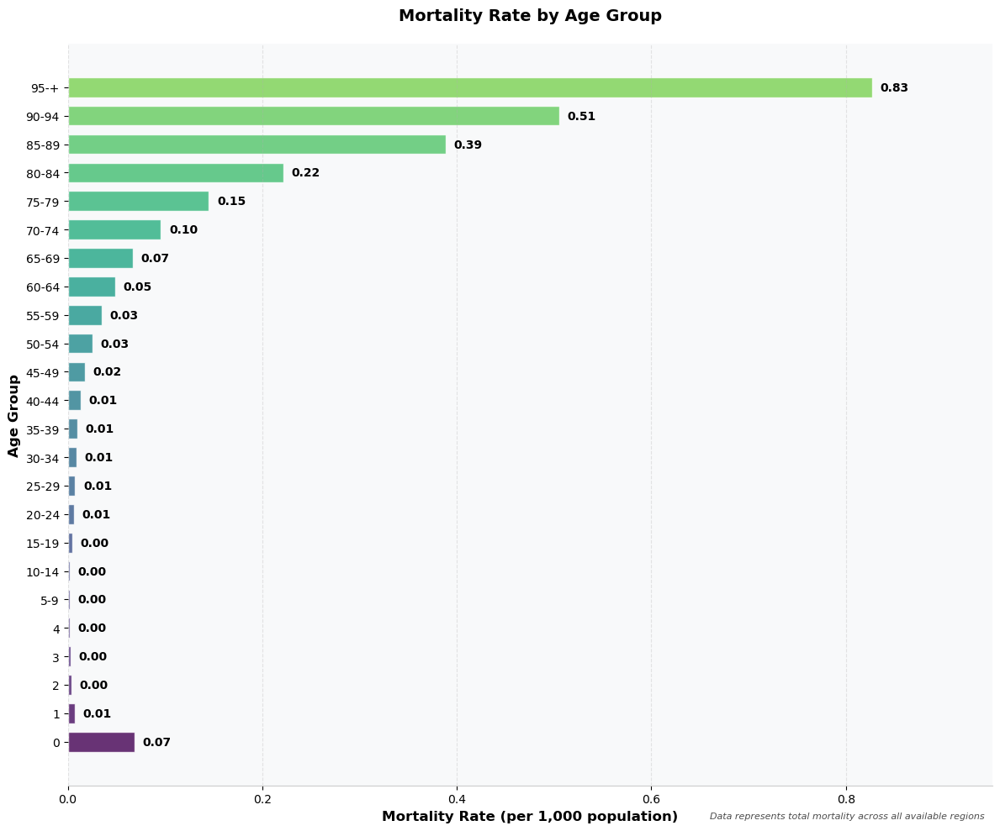

In [10]:
# Define consistent age group labels used in both population and death columns
age_groups = {
    'Age_0': ('Pop_Age_0', 'Deaths_Age_0'),
    'Age_1': ('Pop_Age_1', 'Deaths_Age_1'),
    'Age_2': ('Pop_Age_2', 'Deaths_Age_2'),
    'Age_3': ('Pop_Age_3', 'Deaths_Age_3'),
    'Age_4': ('Pop_Age_4', 'Deaths_Age_4'),
    'Age_5_9': ('Pop_Age_5_9', 'Deaths_Age_5_9'),
    'Age_10_14': ('Pop_Age_10_14', 'Deaths_Age_10_14'),
    'Age_15_19': ('Pop_Age_15_19', 'Deaths_Age_15_19'),
    'Age_20_24': ('Pop_Age_20_24', 'Deaths_Age_20_24'),
    'Age_25_29': ('Pop_Age_25_29', 'Deaths_Age_25_29'),
    'Age_30_34': ('Pop_Age_30_34', 'Deaths_Age_30_34'),
    'Age_35_39': ('Pop_Age_35_39', 'Deaths_Age_35_39'),
    'Age_40_44': ('Pop_Age_40_44', 'Deaths_Age_40_44'),
    'Age_45_49': ('Pop_Age_45_49', 'Deaths_Age_45_49'),
    'Age_50_54': ('Pop_Age_50_54', 'Deaths_Age_50_54'),
    'Age_55_59': ('Pop_Age_55_59', 'Deaths_Age_55_59'),
    'Age_60_64': ('Pop_Age_60_64', 'Deaths_Age_60_64'),
    'Age_65_69': ('Pop_Age_65_69', 'Deaths_Age_65_69'),
    'Age_70_74': ('Pop_Age_70_74', 'Deaths_Age_70_74'),
    'Age_75_79': ('Pop_Age_75_79', 'Deaths_Age_75_79'),
    'Age_80_84': ('Pop_Age_80_84', 'Deaths_Age_80_84'),
    'Age_85_89': ('Pop_Age_85_89', 'Deaths_Age_85_89'),
    'Age_90_94': ('Pop_Age_90_94', 'Deaths_Age_90_94'),
    'Age_95_plus': ('Pop_Age_95_plus', 'Deaths_Age_95_plus')
}

# Initialize lists to store aggregated results
age_labels = []
population_totals = []
death_totals = []
mortality_rates = []

# Aggregate values and calculate mortality rate per age group
for age_label, (pop_col, death_col) in age_groups.items():
    if pop_col in all_parts_with_country.columns and death_col in all_parts_with_country.columns:
        total_pop = all_parts_with_country[pop_col].sum()
        total_deaths = all_parts_with_country[death_col].sum()
        mortality_rate = (total_deaths / total_pop * 1000) if total_pop > 0 else 0
        
        # Format age labels for better readability
        readable_label = age_label.replace('Age_', '').replace('_', '-')
        if readable_label.endswith('plus'):
            readable_label = readable_label.replace('plus', '+')
            
        age_labels.append(readable_label)
        population_totals.append(total_pop)
        death_totals.append(total_deaths)
        mortality_rates.append(mortality_rate)

# Create DataFrame for plotting
mortality_df = pd.DataFrame({
    'Age_Group': age_labels,
    'Population': population_totals,
    'Deaths': death_totals,
    'Mortality_Rate_per_1000': mortality_rates
})

# Define a function to convert age ranges to sortable values
def age_to_sortable(age_range):
    if '-' in age_range:
        return int(age_range.split('-')[0])
    elif '+' in age_range:
        return int(age_range.replace('+', ''))
    else:
        return int(age_range)

# Sort by age numerically
mortality_df['Sort_Key'] = mortality_df['Age_Group'].apply(age_to_sortable)
mortality_df.sort_values(by="Sort_Key", inplace=True)

# Create a more visually appealing horizontal bar chart
plt.figure(figsize=(12, 10))

# Set a nice color palette
colors = plt.cm.viridis(np.linspace(0, 0.8, len(mortality_df)))

# Create horizontal bars
bars = plt.barh(
    mortality_df['Age_Group'], 
    mortality_df['Mortality_Rate_per_1000'],
    color=colors,
    height=0.7,  # Slightly thinner bars
    edgecolor='white',  # White edges for contrast
    alpha=0.8  # Slight transparency
)

# Calculate the maximum value for axis scaling
max_rate = mortality_df['Mortality_Rate_per_1000'].max()
plt.xlim(0, max_rate * 1.15)  # Add 15% space for labels

# Add labels just outside the bars
for bar, rate in zip(bars, mortality_df['Mortality_Rate_per_1000']):
    plt.text(
        bar.get_width() + (max_rate * 0.01),  # Position just outside
        bar.get_y() + bar.get_height()/2,     # Vertical center alignment
        f'{rate:.2f}',                        # Two decimal places
        va='center',                          # Vertical alignment
        ha='left',                            # Horizontal alignment
        fontweight='bold',                    # Make text bold
        fontsize=10                           # Slightly larger font
    )

# Customize the plot
plt.xlabel('Mortality Rate (per 1,000 population)', fontsize=12, fontweight='bold')
plt.ylabel('Age Group', fontsize=12, fontweight='bold')
plt.title('Mortality Rate by Age Group', fontsize=14, fontweight='bold', pad=20)

# Add gridlines only on the x-axis with reduced opacity
plt.grid(axis='x', linestyle='--', alpha=0.3)

# Style the spine
for spine in plt.gca().spines.values():
    spine.set_visible(False)
    
# Only show the bottom spine
plt.gca().spines['bottom'].set_visible(True)
plt.gca().spines['bottom'].set_color('#CCCCCC')

# Remove ticks on y-axis
plt.yticks(fontsize=10)
plt.xticks(fontsize=10)

# Add a thin light gray background to the plot for better contrast
plt.gca().set_facecolor('#f8f9fa')
plt.gcf().set_facecolor('white')

# Add a subtle annotation
plt.figtext(
    0.98, 0.02, 
    'Data represents total mortality across all available regions', 
    ha='right', fontsize=8, style='italic', alpha=0.7
)

# Ensure everything fits nicely
plt.tight_layout()

# Save the figure to Desktop
plt.savefig("/Users/sujangauchan/Desktop/mortality_by_age.png", dpi=300)

# Show the plot
plt.show()

In [11]:
name_counts = all_parts_with_country['name'].value_counts()
print(name_counts)
unique_name_count = all_parts_with_country['name'].nunique()
print(f"Total unique names: {unique_name_count}")

name
Brazil                       307521
United States of America     160718
Mexico                       155631
Japan                        139281
Germany                      135943
                              ...  
Tajikistan                      650
Cape Verde                      628
Kiribati                        469
Solomon Islands                 463
Saint Pierre and Miquelon       209
Name: count, Length: 146, dtype: int64
Total unique names: 146


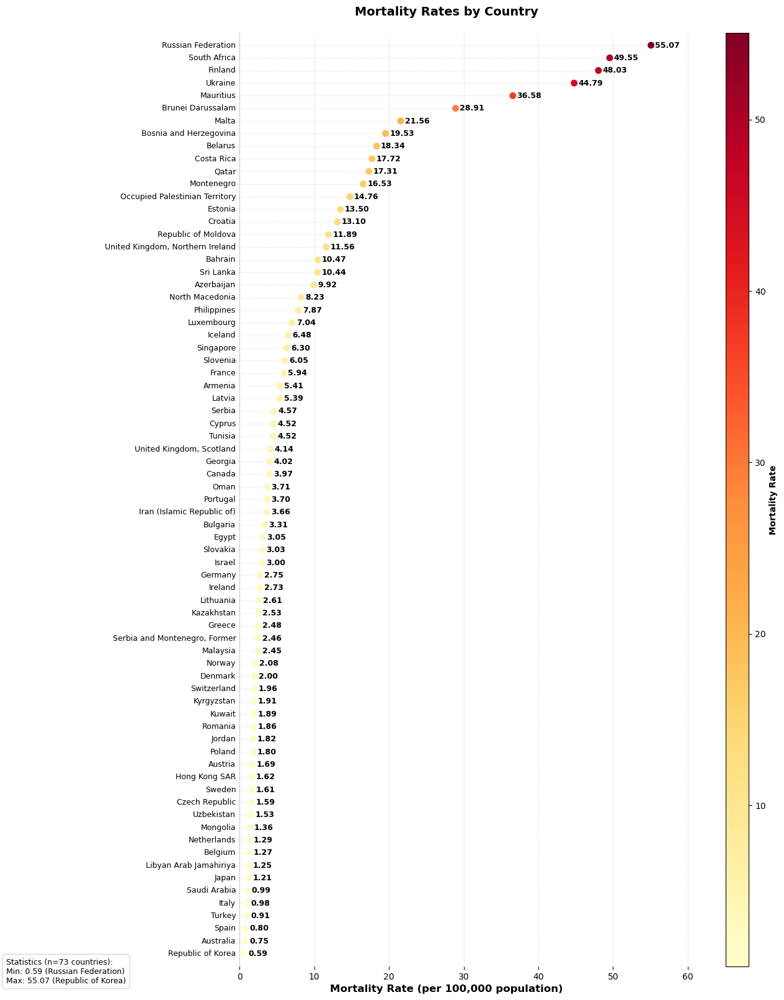

In [12]:
# Calculate mortality rates by country
country_mortality = {}

# Group data by country
country_groups = all_parts_with_country.groupby('name')

# Calculate average mortality rate for each country (across all age groups)
for country_name, country_data in country_groups:
    total_deaths = 0
    total_population = 0
    
    for age_label, (pop_col, death_col) in age_groups.items():
        if pop_col in country_data.columns and death_col in country_data.columns:
            total_deaths += country_data[death_col].sum()
            total_population += country_data[pop_col].sum()
    
    if total_population > 0:
        mortality_rate = (total_deaths / total_population) * 100000  # Per 100,000
        country_mortality[country_name] = mortality_rate

# Convert to DataFrame
country_df = pd.DataFrame({
    'Country': list(country_mortality.keys()),
    'Mortality_Rate': list(country_mortality.values())
})

# Sort by mortality rate
country_df = country_df.sort_values('Mortality_Rate', ascending=True)

# Plot
num_countries = len(country_df)
plt.figure(figsize=(14, max(16, num_countries / 4.5)))

cmap = plt.cm.YlOrRd
norm = plt.Normalize(country_df['Mortality_Rate'].min(), country_df['Mortality_Rate'].max())

max_country_len = max(len(country) for country in country_df['Country'])
country_text_space = max_country_len * 0.25

max_rate = country_df['Mortality_Rate'].max()
x_margin = max_rate * 0.15

scatter = plt.scatter(
    country_df['Mortality_Rate'],
    range(len(country_df)),
    c=country_df['Mortality_Rate'],
    cmap=cmap,
    norm=norm,
    s=80,
    zorder=3,
    edgecolor='white',
    linewidth=1
)

plt.ylim(-1, len(country_df))
plt.xlim(-country_text_space, max_rate + x_margin)

# Country names on the left
for i, (_, row) in enumerate(country_df.iterrows()):
    plt.text(
        -0.5,
        i,
        row['Country'],
        ha='right',
        va='center',
        fontsize=9,
        fontweight='normal',
        color='black'
    )

# Mortality rate values on the right
for i, (_, row) in enumerate(country_df.iterrows()):
    plt.text(
        row['Mortality_Rate'] + (max_rate * 0.01),
        i,
        f"{row['Mortality_Rate']:.2f}",
        ha='left',
        va='center',
        fontsize=9,
        fontweight='bold',
        color='black'
    )

# Grid and style
plt.grid(axis='x', linestyle='--', alpha=0.3)
plt.grid(axis='y', linestyle='-', alpha=0.1)
plt.yticks([])
plt.xlabel('Mortality Rate (per 100,000 population)', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10)
plt.title('Mortality Rates by Country', fontsize=14, fontweight='bold', pad=20)
plt.axvline(x=0, color='gray', linewidth=0.5, alpha=0.5)

# Colorbar
cbar = plt.colorbar(scatter, orientation='vertical', pad=0.02, aspect=40)
cbar.set_label('Mortality Rate', fontsize=10, fontweight='bold')

# Remove spines
for spine in plt.gca().spines.values():
    spine.set_visible(False)

# Connector lines
for i, rate in enumerate(country_df['Mortality_Rate']):
    plt.plot(
        [-0.2, rate],
        [i, i],
        color='gray',
        linestyle=':',
        linewidth=0.5,
        alpha=0.5,
        zorder=1
    )

# Summary stats on the left side
stats_text = (
    f"Statistics (n={len(country_df)} countries):\n"
    f"Min: {country_df['Mortality_Rate'].min():.2f} ({country_df.iloc[-1]['Country']})\n"
    f"Max: {country_df['Mortality_Rate'].max():.2f} ({country_df.iloc[0]['Country']})"
)

plt.figtext(
    0.05, 0.02,
    stats_text,
    ha='left',
    fontsize=9,
    bbox=dict(boxstyle="round,pad=0.5", facecolor='white', alpha=0.8, edgecolor='#CCCCCC')
)

# Save the figure to Desktop
plt.savefig("/Users/sujangauchan/Desktop/mortality_by_country.png", dpi=300)

plt.tight_layout()
plt.subplots_adjust(left=0.25)
plt.show()


In [13]:
print(all_parts_with_country.columns)

Index(['Country', 'Admin1', 'SubDiv', 'Year', 'List', 'Cause', 'Sex', 'Frmat',
       'IM_Frmat', 'Deaths_All_Ages', 'Deaths_Age_0', 'Deaths_Age_1',
       'Deaths_Age_2', 'Deaths_Age_3', 'Deaths_Age_4', 'Deaths_Age_5_9',
       'Deaths_Age_10_14', 'Deaths_Age_15_19', 'Deaths_Age_20_24',
       'Deaths_Age_25_29', 'Deaths_Age_30_34', 'Deaths_Age_35_39',
       'Deaths_Age_40_44', 'Deaths_Age_45_49', 'Deaths_Age_50_54',
       'Deaths_Age_55_59', 'Deaths_Age_60_64', 'Deaths_Age_65_69',
       'Deaths_Age_70_74', 'Deaths_Age_75_79', 'Deaths_Age_80_84',
       'Deaths_Age_85_89', 'Deaths_Age_90_94', 'Deaths_Age_95_plus',
       'Deaths_Age_Unspecified', 'Infant_Deaths_0_day',
       'Infant_Deaths_1_6_days', 'Infant_Deaths_7_27_days',
       'Infant_Deaths_28_364_days', 'country', 'name', 'Pop_All_Ages',
       'Pop_Age_0', 'Pop_Age_1', 'Pop_Age_2', 'Pop_Age_3', 'Pop_Age_4',
       'Pop_Age_5_9', 'Pop_Age_10_14', 'Pop_Age_15_19', 'Pop_Age_20_24',
       'Pop_Age_25_29', 'Pop_Age_30_34', '

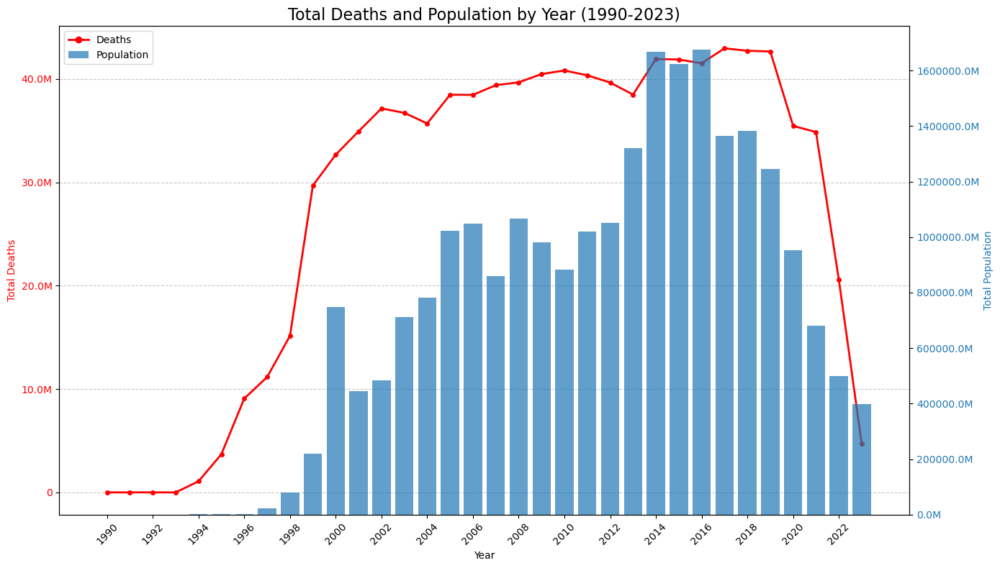

Year-wise Deaths and Population Data:
 Year  Deaths_All_Ages  Pop_All_Ages
 1990             1856  0.000000e+00
 1991             1774  0.000000e+00
 1992             2028  0.000000e+00
 1993             2086  0.000000e+00
 1994          1072770  3.041023e+09
 1995          3694724  2.973048e+09
 1996          9080620  3.140966e+09
 1997         11159389  2.379339e+10
 1998         15153499  7.969930e+10
 1999         29690923  2.196964e+11
 2000         32675565  7.470745e+11
 2001         34935159  4.445951e+11
 2002         37150621  4.835230e+11
 2003         36725473  7.126808e+11
 2004         35697548  7.827414e+11
 2005         38477656  1.023568e+12
 2006         38464867  1.048985e+12
 2007         39399411  8.595278e+11
 2008         39674063  1.067759e+12
 2009         40476617  9.807876e+11
 2010         40821707  8.827033e+11
 2011         40355322  1.021125e+12
 2012         39655184  1.051364e+12
 2013         38491985  1.320223e+12
 2014         41931011  1.667909e+12


In [14]:
# Group by Year and aggregate the deaths and population data
yearly_data = all_parts_with_country.groupby('Year').agg({
    'Deaths_All_Ages': 'sum',
    'Pop_All_Ages': 'sum'
}).reset_index()

# Sort by year to ensure chronological order
yearly_data = yearly_data.sort_values('Year')

# Filter data for years from 1990 to 2023
yearly_data = yearly_data[(yearly_data['Year'] >= 1990) & (yearly_data['Year'] <= 2023)]

# Create a figure with two y-axes
fig, ax1 = plt.subplots(figsize=(14, 8))

# Line chart for deaths on the primary y-axis (red)
color = 'red'
ax1.set_xlabel('Year')
ax1.set_ylabel('Total Deaths', color=color)
ax1.plot(yearly_data['Year'], yearly_data['Deaths_All_Ages'], color=color, linewidth=2, marker='o', markersize=4)
ax1.tick_params(axis='y', labelcolor=color)

# Format x-axis to show years with appropriate intervals
plt.xticks(yearly_data['Year'][::2], rotation=45)  # Show every other year, rotated 45 degrees

# Create a second y-axis for population (rich blue)
color = '#1f77b4'
ax2 = ax1.twinx()
ax2.set_ylabel('Total Population', color=color)
ax2.bar(yearly_data['Year'], yearly_data['Pop_All_Ages'], color=color, alpha=0.7)
ax2.tick_params(axis='y', labelcolor=color)

# Format y-axis labels to be more readable (in millions/thousands as appropriate)
def format_y_axis(ax, is_population=False):
    """Format y-axis labels to be more readable"""
    if is_population:
        from matplotlib.ticker import FuncFormatter
        def millions(x, pos):
            return f'{x/1000000:.1f}M'
        ax.yaxis.set_major_formatter(FuncFormatter(millions))
    else:
        from matplotlib.ticker import FuncFormatter
        def thousands(x, pos):
            if x >= 1000000:
                return f'{x/1000000:.1f}M'
            elif x >= 1000:
                return f'{x/1000:.0f}K'
            else:
                return f'{x:.0f}'
        ax.yaxis.set_major_formatter(FuncFormatter(thousands))

format_y_axis(ax1)
format_y_axis(ax2, is_population=True)

# Add title and improve layout
plt.title('Total Deaths and Population by Year (1990-2023)', fontsize=16)
fig.tight_layout()

# Add a legend with updated color
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
legend_elements = [
    Line2D([0], [0], color='red', linewidth=2, marker='o', label='Deaths'),
    Patch(facecolor='#1f77b4', alpha=0.7, label='Population')
]
ax1.legend(handles=legend_elements, loc='upper left')

# Add grid lines for better readability
ax1.grid(axis='y', linestyle='--', alpha=0.7)

# Save the figure to Desktop
plt.savefig("/Users/sujangauchan/Desktop/death and population per year.png", dpi=300)

# Show the plot
plt.show()

# Print the processed data for reference
print("Year-wise Deaths and Population Data:")
print(yearly_data.to_string(index=False))

# Additional analysis: Calculate year-over-year changes
yearly_data['Deaths_YoY_Change'] = yearly_data['Deaths_All_Ages'].pct_change() * 100
yearly_data['Population_YoY_Change'] = yearly_data['Pop_All_Ages'].pct_change() * 100

print("\nYear-over-Year Percentage Changes:")
print(yearly_data[['Year', 'Deaths_YoY_Change', 'Population_YoY_Change']].round(2).to_string(index=False))

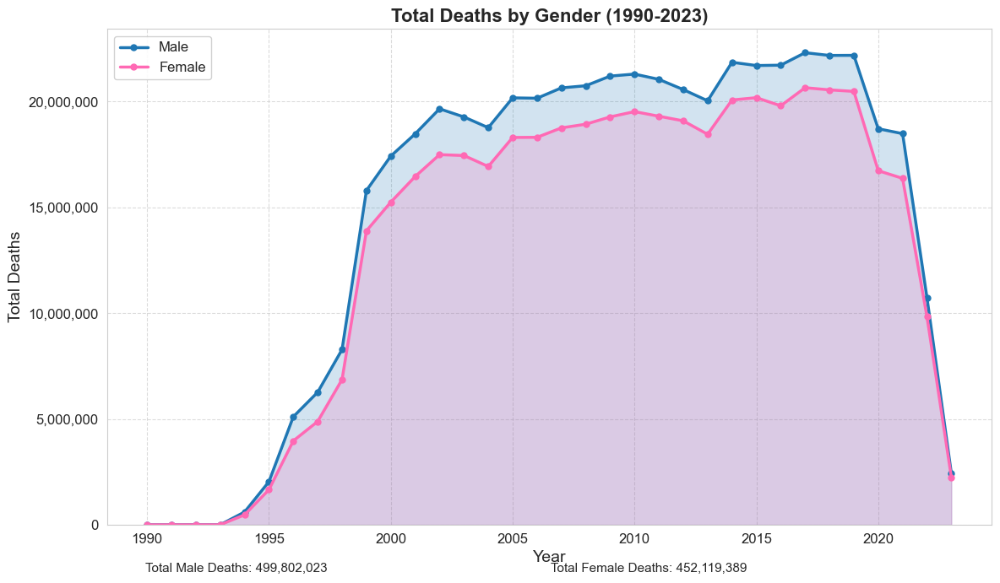

Deaths by Gender Summary:
Average yearly male deaths: 14,700,060
Average yearly female deaths: 13,297,629
Total male deaths (1990-2023): 499,802,023
Total female deaths (1990-2023): 452,119,389


In [15]:

# Set a visually appealing style
sns.set_style('whitegrid')
plt.rcParams.update({'font.size': 12})

# Group by Year and Sex to get deaths for each gender by year
gender_deaths_by_year = all_parts_with_country.groupby(['Year', 'Sex'])['Deaths_All_Ages'].sum().reset_index()

# Filter for Sex values 1 (male) and 2 (female) and years between 1990-2023
gender_deaths_by_year = gender_deaths_by_year[
    (gender_deaths_by_year['Sex'].isin([1, 2])) & 
    (gender_deaths_by_year['Year'] >= 1990) & 
    (gender_deaths_by_year['Year'] <= 2023)
]

# Create a pivot table for easier plotting
pivot_data = gender_deaths_by_year.pivot(index='Year', columns='Sex', values='Deaths_All_Ages').reset_index()
pivot_data.columns = ['Year', 'Male', 'Female']  # Rename columns for clarity

# Create the plot
plt.figure(figsize=(12, 7))

# Plot male deaths with blue line
plt.plot(pivot_data['Year'], pivot_data['Male'], 
         color='#1f77b4', linewidth=2.5, marker='o', markersize=5, 
         label='Male')

# Plot female deaths with pink line
plt.plot(pivot_data['Year'], pivot_data['Female'], 
         color='#ff69b4', linewidth=2.5, marker='o', markersize=5, 
         label='Female')

# Add shading under the lines for visual appeal
plt.fill_between(pivot_data['Year'], pivot_data['Male'], alpha=0.2, color='#1f77b4')
plt.fill_between(pivot_data['Year'], pivot_data['Female'], alpha=0.2, color='#ff69b4')

# Add labels and title
plt.xlabel('Year', fontsize=14)
plt.ylabel('Total Deaths', fontsize=14)
plt.title('Total Deaths by Gender (1990-2023)', fontsize=16, fontweight='bold')

# Format x-axis to show fewer years for clarity
plt.xticks(range(1990, 2024, 5))

# Ensure y-axis starts at 0
plt.ylim(bottom=0)

# Add a subtle grid
plt.grid(True, linestyle='--', alpha=0.7)

# Add legend with nice styling
plt.legend(loc='upper left', frameon=True, framealpha=0.9, fontsize=12)

# Add total death counts for the entire period
total_male = pivot_data['Male'].sum()
total_female = pivot_data['Female'].sum()
plt.figtext(0.15, 0.02, f"Total Male Deaths: {total_male:,.0f}", fontsize=11)
plt.figtext(0.55, 0.02, f"Total Female Deaths: {total_female:,.0f}", fontsize=11)

# Format y-axis with comma separator
plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, p: f'{x:,.0f}'))

# Improve layout
plt.tight_layout()
plt.subplots_adjust(bottom=0.1)  # Make room for the total death text

# Save and show the plot
plt.savefig("/Users/sujangauchan/Desktop/deathspergender.png", dpi=300)
plt.show()

# Print key statistics
print("Deaths by Gender Summary:")
print(f"Average yearly male deaths: {pivot_data['Male'].mean():,.0f}")
print(f"Average yearly female deaths: {pivot_data['Female'].mean():,.0f}")
print(f"Total male deaths (1990-2023): {total_male:,.0f}")
print(f"Total female deaths (1990-2023): {total_female:,.0f}")

   Year      continent  Deaths_All_Ages
0  1988  North America             1942
1  1989  North America             1928
2  1990  North America             1856
3  1991  North America             1774
4  1992  North America             2028


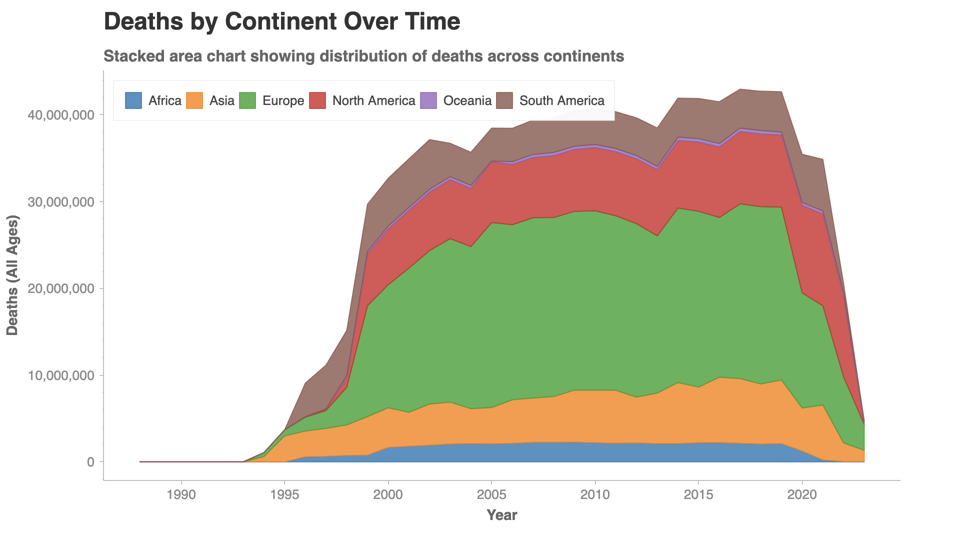

Saved to /Users/sujangauchan/Desktop/deaths_by_continent.png



chartify.Chart(blank_labels=True,
layout='slide_100%',
x_axis_type='datetime',
y_axis_type='linear')

In [16]:
# Group by year and continent, summing deaths
total_deaths_by_year_and_continent = (
    all_parts_with_country.groupby(['Year', 'continent'])['Deaths_All_Ages']
    .sum()
    .reset_index()
    .sort_values('Year')
)

# Display the first few rows to verify the data structure
print(total_deaths_by_year_and_continent.head())

# Create a chartify chart object
ch = chartify.Chart(blank_labels=True, x_axis_type='datetime')
ch.set_title("Deaths by Continent Over Time")
ch.set_subtitle("Stacked area chart showing distribution of deaths across continents")

# Convert Year to datetime if it's not already
if not pd.api.types.is_datetime64_any_dtype(total_deaths_by_year_and_continent['Year']):
    total_deaths_by_year_and_continent['Year'] = pd.to_datetime(total_deaths_by_year_and_continent['Year'], format='%Y')

# Plot the stacked area chart
ch.plot.area(
    data_frame=total_deaths_by_year_and_continent,
    x_column='Year',
    y_column='Deaths_All_Ages',
    color_column='continent',
    stacked=True,
)

# Customize the axes
ch.axes.set_xaxis_label('Year')
ch.axes.set_yaxis_label('Deaths (All Ages)')

# Set a color palette if desired
# ch.set_color_palette('categorical', palette='bright')

# Show the chart
ch.show('png')

# Save the Chartify chart
ch.save("/Users/sujangauchan/Desktop/deaths_by_continent.png", format="png")

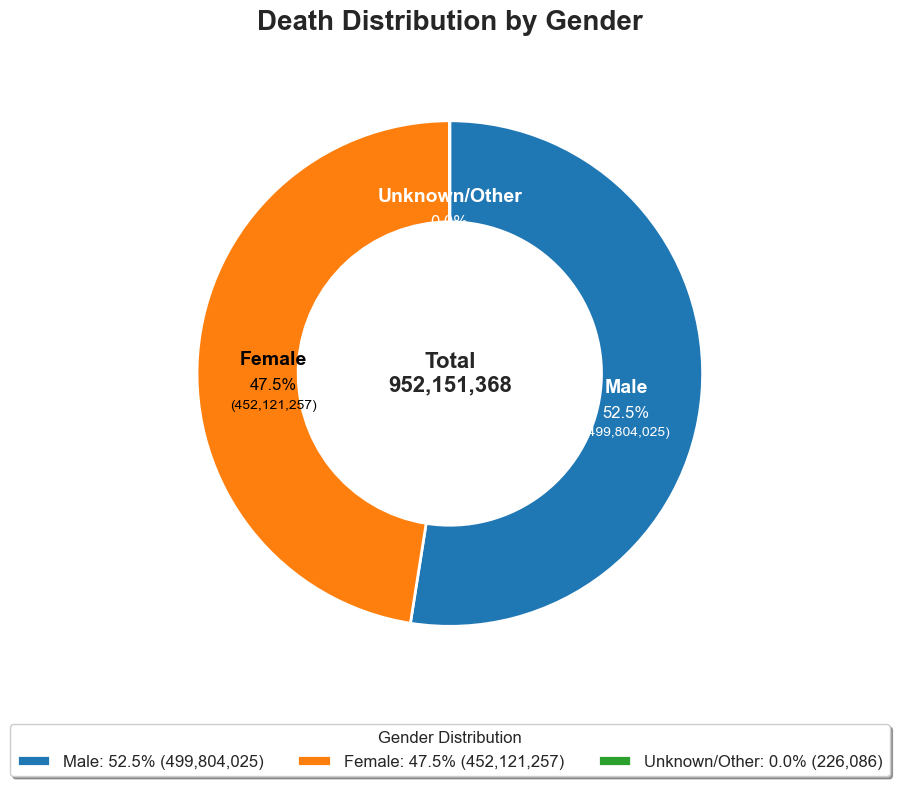

Deaths by Gender:
          Sex  Deaths_All_Ages  Percentage
         Male        499804025        52.5
       Female        452121257        47.5
Unknown/Other           226086         0.0


In [17]:
# Setting a visually appealing style
plt.style.use('seaborn-v0_8-whitegrid')

# Group data by Sex and calculate total deaths
gender_deaths = all_parts_with_country.groupby('Sex')['Deaths_All_Ages'].sum().reset_index()

# Calculate percentages
total_deaths = gender_deaths['Deaths_All_Ages'].sum()
gender_deaths['Percentage'] = (gender_deaths['Deaths_All_Ages'] / total_deaths * 100).round(1)

# Clean up gender labels for 1 and 2 values
def clean_gender(sex):
    sex = str(sex).strip().lower()
    if sex in ['1']:
        return 'Male'
    elif sex in ['2']:
        return 'Female'
    else:
        return 'Unknown/Other'

gender_deaths['Sex'] = gender_deaths['Sex'].apply(clean_gender)

# Reaggregate in case there were multiple categories that map to the same cleaned gender
gender_deaths = gender_deaths.groupby('Sex')['Deaths_All_Ages'].sum().reset_index()
gender_deaths['Percentage'] = (gender_deaths['Deaths_All_Ages'] / total_deaths * 100).round(1)

# Format values for display
gender_deaths['Deaths_Formatted'] = gender_deaths['Deaths_All_Ages'].apply(lambda x: f"{x:,.0f}")

# Sort by count descending for consistent color assignment
gender_deaths = gender_deaths.sort_values('Deaths_All_Ages', ascending=False)

# Set up a professional color palette
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']  # Professional blue, orange, green

# Create figure with clean white background
fig, ax = plt.subplots(figsize=(12, 8), facecolor='white')

# Create donut chart
wedges, texts = plt.pie(
    gender_deaths['Deaths_All_Ages'],
    labels=None,
    colors=colors[:len(gender_deaths)],
    wedgeprops=dict(width=0.4, edgecolor='white', linewidth=2),
    startangle=90,
    counterclock=False,
    shadow=False
)

# Add a white circle at the center
centre_circle = plt.Circle((0, 0), 0.33, fc='white', edgecolor='white')
fig.gca().add_artist(centre_circle)

# Add center text with total number
plt.text(0, 0, f'Total\n{total_deaths:,.0f}', 
         ha='center', va='center', fontsize=16, fontweight='bold')

# Equal aspect ratio ensures that pie is drawn as a circle
ax.set_aspect('equal')

# Remove spines and ticks for clean look
ax.set_frame_on(False)
ax.set_xticks([])
ax.set_yticks([])

# Add title with better spacing
plt.title('Death Distribution by Gender', fontsize=20, pad=20, fontweight='bold')

# Add better positioned labels directly on the donut
for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1) / 2. + p.theta1
    
    # Convert angle to radians for math functions
    ang_rad = np.deg2rad(ang)
    
    # Place the text directly on the wedge, slightly away from center
    # Adjust the distance based on the percentage for better positioning
    text_distance = 0.7  # Distance from center of chart (0-1 scale, where 1 is edge)
    
    x = text_distance * np.cos(ang_rad)
    y = text_distance * np.sin(ang_rad)
    
    # Get the current gender data
    gender = gender_deaths.iloc[i]
    
    # Create separate labels for better positioning
    gender_label = gender['Sex']
    pct_label = f"{gender['Percentage']}%"
    count_label = f"({gender['Deaths_Formatted']})"
    
    # Set text properties for contrast against the wedge color
    text_color = 'white' if i != 1 else 'black'  # Different color for orange wedge
    
    # Place the text with a slight offset and rotation for better readability
    ax.text(x, y, gender_label, 
            ha='center', va='center', fontsize=14, fontweight='bold',
            color=text_color)
    
    # Place percentage below the gender label
    ax.text(x, y-0.1, pct_label, 
            ha='center', va='center', fontsize=12, 
            color=text_color)
    
    # Place count below the percentage
    ax.text(x, y-0.18, count_label, 
            ha='center', va='center', fontsize=10, 
            color=text_color)

# Add a legend for better clarity
legend_labels = [f"{row['Sex']}: {row['Percentage']}% ({row['Deaths_Formatted']})" 
                for _, row in gender_deaths.iterrows()]
plt.legend(wedges, legend_labels, 
           title="Gender Distribution", 
           loc="lower center", 
           bbox_to_anchor=(0.5, -0.15),
           frameon=True, 
           fancybox=True, 
           shadow=True, 
           ncol=len(gender_deaths))

# Final touches
plt.tight_layout()

# Save the figure to Desktop
plt.savefig("/Users/sujangauchan/Desktop/genderdivision.png", dpi=300)

# Show the plot
plt.show()

# Print the data for reference
print("Deaths by Gender:")
print(gender_deaths[['Sex', 'Deaths_All_Ages', 'Percentage']].to_string(index=False))

In [18]:
import os  # Added for saving chart png


# Group data by country (in column 'name') and sum deaths and population
mortality_data = all_parts_with_country.groupby('name').agg({
    'Deaths_All_Ages': 'sum',
    'Pop_All_Ages': 'sum' 
}).reset_index()

# Calculate mortality rate (deaths per 1000 people)
mortality_data['Mortality_Rate'] = (mortality_data['Deaths_All_Ages'] / mortality_data['Pop_All_Ages']) * 1000

#  Handle potential outliers or invalid values
mortality_data = mortality_data[mortality_data['Mortality_Rate'].notna()]  # Remove NaN values
mortality_data = mortality_data[mortality_data['Mortality_Rate'] > 0]  # Remove zero or negative rates

# Print summary statistics to understand the data distribution
print("Mortality Rate Statistics:")
print(mortality_data['Mortality_Rate'].describe())

# Create the figure
fig = go.Figure()

# Define color scale - using a visually appealing gradient from blue to red
colorscale = [
    [0, 'rgb(220, 242, 255)'],      # Lightest blue for lowest rates
    [0.2, 'rgb(146, 198, 255)'],    # Light blue
    [0.4, 'rgb(67, 147, 195)'],     # Medium blue
    [0.6, 'rgb(33, 102, 172)'],     # Dark blue
    [0.8, 'rgb(178, 24, 43)'],      # Dark red
    [1.0, 'rgb(103, 0, 13)']        # Darkest red for highest rates
]

# Add the choropleth map
fig.add_trace(
    go.Choropleth(
        locations=mortality_data['name'],
        locationmode='country names',
        z=mortality_data['Mortality_Rate'],
        text=mortality_data.apply(
            lambda row: f"<b>{row['name']}</b><br>" +
                       f"Deaths: {int(row['Deaths_All_Ages']):,}<br>" +
                       f"Population: {int(row['Pop_All_Ages']):,}<br>" +
                       f"<b>Mortality Rate: {row['Mortality_Rate']:.2f} per 1000</b>",
            axis=1
        ),
        colorscale=colorscale,
        autocolorscale=False,
        colorbar_title={
            'text': 'Deaths<br>per 1000<br>people',
            'font': {'size': 16}
        },
        colorbar=dict(
            thickness=20,
            len=0.6,
            tickfont={'size': 14}
        ),
        marker_line_color='darkgray',
        marker_line_width=0.5,
        zmin=0,
        zmax=mortality_data['Mortality_Rate'].quantile(0.95),  # Cap at 95th percentile to handle outliers
        hoverinfo='text'
    )
)

# Update layout for a more polished appearance
fig.update_layout(
    title={
        'text': 'Global Mortality Rates (Deaths per 1000 People)',
        'font': {'size': 28, 'family': 'Arial, sans-serif', 'color': '#333'},
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    paper_bgcolor='#f8f9fa',
    geo=dict(
        showframe=False,
        showcoastlines=True,
        coastlinecolor='rgba(0,0,0,0.5)',
        projection_type='natural earth',
        bgcolor='rgba(0,0,0,0)',
        landcolor='rgba(230, 230, 230, 1)',
        showland=True,
        showcountries=True,
        countrycolor='rgba(0,0,0,0.2)',
        showocean=True,
        oceancolor='rgba(210, 230, 250, 1)',
        showlakes=True,
        lakecolor='rgba(210, 230, 250, 1)',
    ),
    height=800,
    margin={"r": 0, "t": 80, "l": 0, "b": 0},
    annotations=[
        dict(
            x=0.5,
            y=0.02,
            xref='paper',
            yref='paper',
            text='Source: Based on Deaths_All_Ages and Pop_All_Ages data',
            showarrow=False,
            font=dict(size=14)
        ),
        dict(
            x=0.01,
            y=0.98,
            xref='paper',
            yref='paper',
            text="<b>Higher color intensity indicates higher mortality rates</b>",
            showarrow=False,
            font=dict(size=16),
            align='left',
            bordercolor='black',
            borderwidth=1,
            borderpad=6,
            bgcolor='white',
            opacity=0.8
        )
    ]
)

# Show the figure
fig.show()

# Save the figure to an HTML file for interactive viewing
fig.write_html("global_mortality_map.html")

# Save the figure as a PNG file in the specified directory
import os
save_path = "/Users/sujangauchan/Desktop/"
# Create directory if it doesn't exist
os.makedirs(save_path, exist_ok=True)

fig.write_image(os.path.join(save_path, "global_mortality_map.png"), width=1920, height=1080, scale=2)

Mortality Rate Statistics:
count    146.000000
mean            inf
std             NaN
min        0.005941
25%        0.038241
50%             NaN
75%             NaN
max             inf
Name: Mortality_Rate, dtype: float64


In [19]:
# Group data by country for only infants
mortality_data = all_parts_with_country.groupby('name').agg({
    'Deaths_Age_0': 'sum',       # infants deaths (age 0)
    'Pop_Age_0': 'sum'           # infants population (age 0)
}).reset_index()

# Calculate TRUE infant mortality rate (per 1000 live births)
mortality_data['Mortality_Rate'] = (mortality_data['Deaths_Age_0'] / mortality_data['Pop_Age_0']) * 1000

# Clean data
mortality_data = mortality_data[
    (mortality_data['Mortality_Rate'].notna()) & 
    (mortality_data['Mortality_Rate'] > 0)
]

print("Infant Mortality Rate Statistics:")
print(mortality_data['Mortality_Rate'].describe())

# Create figure with INFANT-SPECIFIC styling
fig = go.Figure()

colorscale = [
    [0, 'rgb(255, 240, 240)'],    # Light pink (for infants)
    [0.2, 'rgb(255, 200, 200)'],  
    [0.4, 'rgb(255, 150, 150)'],  
    [0.6, 'rgb(255, 100, 100)'],  
    [0.8, 'rgb(220, 50, 50)'],    
    [1.0, 'rgb(180, 0, 0)']       # Dark red
]

fig.add_trace(go.Choropleth(
    locations=mortality_data['name'],
    locationmode='country names',
    z=mortality_data['Mortality_Rate'],
    text=mortality_data.apply(
        lambda row: f"<b>{row['name']}</b><br>"
                    f"Infant Deaths: {int(row['Deaths_Age_0']):,}<br>"
                    f"Infant Population: {int(row['Pop_Age_0']):,}<br>"
                    f"<b>Mortality Rate: {row['Mortality_Rate']:.1f} per 1000</b>",
        axis=1
    ),
    colorscale=colorscale,
    colorbar_title='Infant Deaths<br>per 1000<br>Live Births',
    marker_line_color='darkgray',
    zmin=0,
    zmax=mortality_data['Mortality_Rate'].quantile(0.95)
))

# Updated INFANT-SPECIFIC layout
fig.update_layout(
    title={
        'text': '<b>Global Infant Mortality Rates</b><br>(Deaths per 1000 Live Births)',
        'font': {'size': 28},
        'y': 0.95
    },
    geo=dict(
        showframe=False,
        projection_type='natural earth',
        landcolor='rgb(240, 240, 240)'
    ),
    height=800,
    annotations=[
        dict(
            x=0.5,
            y=0.02,
            text='Source: Infant deaths (Age 0) and population data',
            showarrow=False
        )
    ]
)

# Save outputs with INFANT-SPECIFIC filenames
output_dir = "/Users/sujangauchan/Desktop/"
os.makedirs(output_dir, exist_ok=True)

fig.write_html(os.path.join(output_dir, "global_infant_mortality.html"))
fig.write_image(
    os.path.join(output_dir, "global_infant_mortality.png"),
    width=1600,
    height=900,
    scale=2
)

print(f"Saved to: {output_dir}global_infant_mortality.[html/png]")
fig.show()

Infant Mortality Rate Statistics:
count    138.000000
mean            inf
std             NaN
min        0.002958
25%        0.027459
50%        0.548105
75%             NaN
max             inf
Name: Mortality_Rate, dtype: float64
Saved to: /Users/sujangauchan/Desktop/global_infant_mortality.[html/png]


In [20]:
# Data Preparation
age_columns = [
    'Infant_Deaths_0_day',
    'Infant_Deaths_1_6_days', 
    'Infant_Deaths_7_27_days',
    'Infant_Deaths_28_364_days'
]

age_labels = [
    '0 days (Day of birth)',
    '1-6 days (First week)',
    '7-27 days (Neonatal)',
    '28-364 days (Post-neonatal)'
]

yearly_deaths = all_parts_with_country.groupby('Year')[age_columns].sum().reset_index()

# Create Figure
fig1 = go.Figure()

# Color palette
colors = ['#FF5F5D', '#3777FF', '#42E2B8', '#FFBD71']

# Add traces for each age group
for i, column in enumerate(age_columns):
    fig1.add_trace(go.Scatter(
        x=yearly_deaths['Year'],
        y=yearly_deaths[column],
        mode='lines',
        stackgroup='one',
        name=age_labels[i],
        line=dict(width=0.5, color=colors[i]),
        fillcolor=colors[i],
        hovertemplate='%{y:,} deaths<extra></extra>'
    ))

# Layout customization
fig1.update_layout(
    title={
        'text': '<b>Infant Mortality Trends by Age Group</b>',
        'font': {'size': 24},
        'x': 0.5,
        'xanchor': 'center'
    },
    xaxis_title='Year',
    yaxis_title='Number of Deaths',
    hovermode='x unified',
    legend=dict(
        orientation='h',
        yanchor='bottom',
        y=-0.3,
        xanchor='center',
        x=0.5
    ),
    height=600,
    width=800,
    plot_bgcolor='rgba(240,240,240,0.1)'
)

fig1.show()

# Save outputs
output_dir = "/Users/sujangauchan/Desktop/infant_mortality_analysis"
os.makedirs(output_dir, exist_ok=True)
fig1.write_html(os.path.join(output_dir, "infant_mortality_trends.html"))
fig1.write_image(os.path.join(output_dir, "infant_mortality_trends.png"), scale=2)

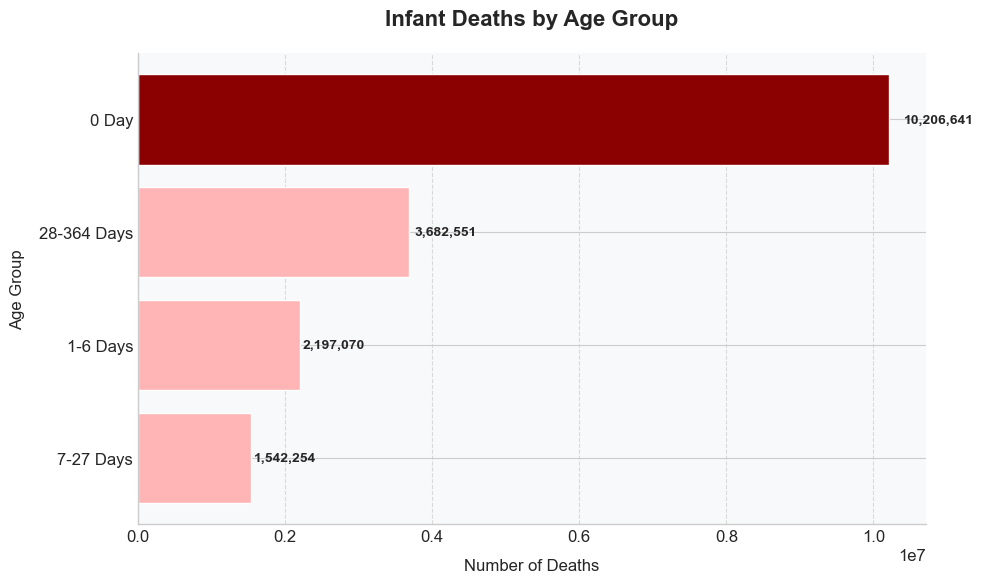

In [21]:
# Calculate total deaths in each time frame
total_deaths = {
    '0 Day': all_parts_with_country['Infant_Deaths_0_day'].sum(),
    '1-6 Days': all_parts_with_country['Infant_Deaths_1_6_days'].sum(),
    '7-27 Days': all_parts_with_country['Infant_Deaths_7_27_days'].sum(),
    '28-364 Days': all_parts_with_country['Infant_Deaths_28_364_days'].sum()
}

# Convert to dataframe for easy plotting
deaths_df = pd.DataFrame.from_dict(total_deaths, orient='index', columns=['Deaths'])
deaths_df = deaths_df.sort_values('Deaths')  # Sort by number of deaths

# Create a horizontal bar chart with a modern style
plt.style.use('seaborn-v0_8-whitegrid')  # Use a clean, modern style
fig, ax = plt.subplots(figsize=(10, 6))

# Create horizontal bar chart with red color palette (darker red for 0-day)
colors = ['#FFB5B5',  # Dark red for 0-day
          '#FFB5B5',  # Light red 1
          '#FFB5B5',  # Light red 2
          '#8B0000']  # Lightest red

# Apply colors in order of sorted values (smallest to largest)
bars = ax.barh(deaths_df.index, deaths_df['Deaths'], color=colors)

# Customize the plot
ax.set_title('Infant Deaths by Age Group', fontsize=16, fontweight='bold', pad=20)
ax.set_xlabel('Number of Deaths', fontsize=12, labelpad=10)
ax.set_ylabel('Age Group', fontsize=12, labelpad=10)

# Add the values at the end of each bar
for i, bar in enumerate(bars):
    width = bar.get_width()
    ax.text(width + width*0.02, bar.get_y() + bar.get_height()/2, 
            f'{int(width):,}', 
            va='center', ha='left', fontsize=10, fontweight='bold')

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Add a subtle grid to the x-axis only
ax.grid(axis='x', linestyle='--', alpha=0.7)

# Add a light background color to the chart area
ax.set_facecolor('#f8f9fa')
fig.set_facecolor('white')

# Add a subtle shadow effect to bars
for bar in bars:
    bar.set_edgecolor('white')
    bar.set_linewidth(1)

# Adjust layout and save
plt.tight_layout()
plt.savefig("/Users/sujangauchan/Desktop/Total infant deaths by age group.png", dpi=300)
plt.show()

In [22]:
all_parts_with_country.columns

Index(['Country', 'Admin1', 'SubDiv', 'Year', 'List', 'Cause', 'Sex', 'Frmat',
       'IM_Frmat', 'Deaths_All_Ages', 'Deaths_Age_0', 'Deaths_Age_1',
       'Deaths_Age_2', 'Deaths_Age_3', 'Deaths_Age_4', 'Deaths_Age_5_9',
       'Deaths_Age_10_14', 'Deaths_Age_15_19', 'Deaths_Age_20_24',
       'Deaths_Age_25_29', 'Deaths_Age_30_34', 'Deaths_Age_35_39',
       'Deaths_Age_40_44', 'Deaths_Age_45_49', 'Deaths_Age_50_54',
       'Deaths_Age_55_59', 'Deaths_Age_60_64', 'Deaths_Age_65_69',
       'Deaths_Age_70_74', 'Deaths_Age_75_79', 'Deaths_Age_80_84',
       'Deaths_Age_85_89', 'Deaths_Age_90_94', 'Deaths_Age_95_plus',
       'Deaths_Age_Unspecified', 'Infant_Deaths_0_day',
       'Infant_Deaths_1_6_days', 'Infant_Deaths_7_27_days',
       'Infant_Deaths_28_364_days', 'country', 'name', 'Pop_All_Ages',
       'Pop_Age_0', 'Pop_Age_1', 'Pop_Age_2', 'Pop_Age_3', 'Pop_Age_4',
       'Pop_Age_5_9', 'Pop_Age_10_14', 'Pop_Age_15_19', 'Pop_Age_20_24',
       'Pop_Age_25_29', 'Pop_Age_30_34', '

# Predictive Models

In [23]:
#check for non numeric columns
def detect_non_numeric(df):
    """Identify columns containing any non-numeric values"""
    non_numeric = []
    for col in df.columns:
        # Check if column dtype is non-numeric
        if not pd.api.types.is_numeric_dtype(df[col]):
            non_numeric.append(col)
        # Check for numeric columns containing non-numeric values
        elif df[col].apply(lambda x: isinstance(x, str)).any():
            non_numeric.append(col)
    return non_numeric

non_numeric_columns = detect_non_numeric(all_parts_with_country)
print("Columns with non-numerical values or mixed types:")
print(non_numeric_columns)

Columns with non-numerical values or mixed types:
['SubDiv', 'List', 'Cause', 'name', 'continent', 'Region']


## Polynomial regression to predict age and mortality rate

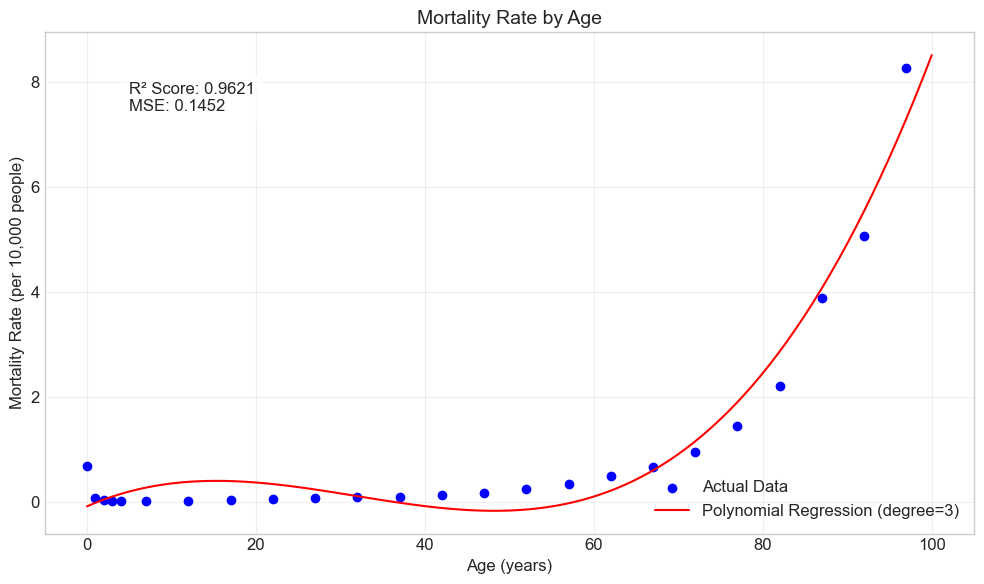

R² Score: 0.9621
MSE: 0.1452


In [24]:
# Define the age groups and their midpoints
age_groups = [
    ('Deaths_Age_0', 'Pop_Age_0', 0),
    ('Deaths_Age_1', 'Pop_Age_1', 1),
    ('Deaths_Age_2', 'Pop_Age_2', 2),
    ('Deaths_Age_3', 'Pop_Age_3', 3),
    ('Deaths_Age_4', 'Pop_Age_4', 4),
    ('Deaths_Age_5_9', 'Pop_Age_5_9', 7),
    ('Deaths_Age_10_14', 'Pop_Age_10_14', 12),
    ('Deaths_Age_15_19', 'Pop_Age_15_19', 17),
    ('Deaths_Age_20_24', 'Pop_Age_20_24', 22),
    ('Deaths_Age_25_29', 'Pop_Age_25_29', 27),
    ('Deaths_Age_30_34', 'Pop_Age_30_34', 32),
    ('Deaths_Age_35_39', 'Pop_Age_35_39', 37),
    ('Deaths_Age_40_44', 'Pop_Age_40_44', 42),
    ('Deaths_Age_45_49', 'Pop_Age_45_49', 47),
    ('Deaths_Age_50_54', 'Pop_Age_50_54', 52),
    ('Deaths_Age_55_59', 'Pop_Age_55_59', 57),
    ('Deaths_Age_60_64', 'Pop_Age_60_64', 62),
    ('Deaths_Age_65_69', 'Pop_Age_65_69', 67),
    ('Deaths_Age_70_74', 'Pop_Age_70_74', 72),
    ('Deaths_Age_75_79', 'Pop_Age_75_79', 77),
    ('Deaths_Age_80_84', 'Pop_Age_80_84', 82),
    ('Deaths_Age_85_89', 'Pop_Age_85_89', 87),
    ('Deaths_Age_90_94', 'Pop_Age_90_94', 92),
    ('Deaths_Age_95_plus', 'Pop_Age_95_plus', 97)
]

# Calculate mortality rates from actual data
mortality_data = []

# Sum deaths and population across all records for each age group
for death_col, pop_col, age_midpoint in age_groups:
    # Calculate total deaths and population for this age group
    deaths = all_parts_with_country[death_col].sum()
    population = all_parts_with_country[pop_col].sum()
    
    # Skip if population is zero to avoid division by zero
    if population == 0:
        continue
    
    # Calculate mortality rate per 10,000 people
    mortality_rate = (deaths / population) * 10000
    
    mortality_data.append({
        'age': age_midpoint,
        'mortality_rate': mortality_rate
    })

# Convert to DataFrame
df = pd.DataFrame(mortality_data)

# Fit polynomial regression model
degree = 3
model = make_pipeline(
    PolynomialFeatures(degree=degree),
    LinearRegression()
)

# Store X and y for model
X = df[['age']].values
y = df['mortality_rate'].values

# Fit the model
model.fit(X, y)

# Generate predictions for a smooth curve
X_smooth = np.linspace(0, 100, 100).reshape(-1, 1)
y_pred_smooth = model.predict(X_smooth)

# Calculate R-squared and MSE
y_pred = model.predict(X)
r2 = r2_score(y, y_pred)
mse = mean_squared_error(y, y_pred)

# Create visualization
plt.figure(figsize=(10, 6))

# Plot data points
plt.scatter(df['age'], df['mortality_rate'], color='blue', label='Actual Data')

# Plot regression curve
plt.plot(X_smooth, y_pred_smooth, color='red', label=f'Polynomial Regression (degree={degree})')

# Add labels and title
plt.title('Mortality Rate by Age', fontsize=14)
plt.xlabel('Age (years)', fontsize=12)
plt.ylabel('Mortality Rate (per 10,000 people)', fontsize=12)
plt.grid(True, alpha=0.3)

# Add accuracy information
plt.text(5, max(df['mortality_rate']) * 0.9, 
         f'R² Score: {r2:.4f}\nMSE: {mse:.4f}',
         bbox=dict(facecolor='white', alpha=0.8))

plt.legend()
plt.tight_layout()

# Show the plot
plt.savefig('mortality_regression_actual.png')
plt.show()

print(f"R² Score: {r2:.4f}")
print(f"MSE: {mse:.4f}")

In [25]:
all_parts_with_country.columns

Index(['Country', 'Admin1', 'SubDiv', 'Year', 'List', 'Cause', 'Sex', 'Frmat',
       'IM_Frmat', 'Deaths_All_Ages', 'Deaths_Age_0', 'Deaths_Age_1',
       'Deaths_Age_2', 'Deaths_Age_3', 'Deaths_Age_4', 'Deaths_Age_5_9',
       'Deaths_Age_10_14', 'Deaths_Age_15_19', 'Deaths_Age_20_24',
       'Deaths_Age_25_29', 'Deaths_Age_30_34', 'Deaths_Age_35_39',
       'Deaths_Age_40_44', 'Deaths_Age_45_49', 'Deaths_Age_50_54',
       'Deaths_Age_55_59', 'Deaths_Age_60_64', 'Deaths_Age_65_69',
       'Deaths_Age_70_74', 'Deaths_Age_75_79', 'Deaths_Age_80_84',
       'Deaths_Age_85_89', 'Deaths_Age_90_94', 'Deaths_Age_95_plus',
       'Deaths_Age_Unspecified', 'Infant_Deaths_0_day',
       'Infant_Deaths_1_6_days', 'Infant_Deaths_7_27_days',
       'Infant_Deaths_28_364_days', 'country', 'name', 'Pop_All_Ages',
       'Pop_Age_0', 'Pop_Age_1', 'Pop_Age_2', 'Pop_Age_3', 'Pop_Age_4',
       'Pop_Age_5_9', 'Pop_Age_10_14', 'Pop_Age_15_19', 'Pop_Age_20_24',
       'Pop_Age_25_29', 'Pop_Age_30_34', '

In [26]:
# Assuming all_parts_with_country is a pandas DataFrame
min_year = all_parts_with_country['Year'].min()
max_year = all_parts_with_country['Year'].max()

print(f"Minimum Year: {min_year}")
print(f"Maximum Year: {max_year}")

Minimum Year: 1988
Maximum Year: 2023


# LSTM for Mortality rate forecasting

Calculating mortality rates by grouping data by year...

Sample of calculated mortality rates:
   Year  Mortality_Rate_All_Ages  Mortality_Rate_Age_0  Mortality_Rate_Age_1  \
0  1988                      0.0                   0.0                   0.0   
1  1989                      0.0                   0.0                   0.0   
2  1990                      0.0                   0.0                   0.0   
3  1991                      0.0                   0.0                   0.0   
4  1992                      0.0                   0.0                   0.0   

   Mortality_Rate_Age_2  Mortality_Rate_Age_3  Mortality_Rate_Age_4  \
0                   0.0                   0.0                   0.0   
1                   0.0                   0.0                   0.0   
2                   0.0                   0.0                   0.0   
3                   0.0                   0.0                   0.0   
4                   0.0                   0.0                   0.0  

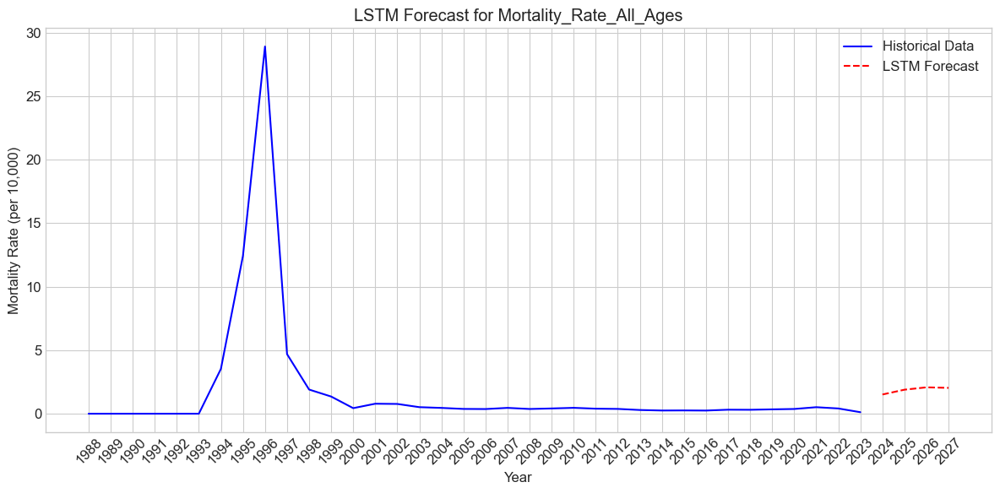

    Year  Mortality_Rate_All_Ages
35  2023                 0.117865
0   2024                 1.511505
1   2025                 1.890268
2   2026                 2.076487
3   2027                 2.032843

Forecasting for Mortality_Rate_Age_0:


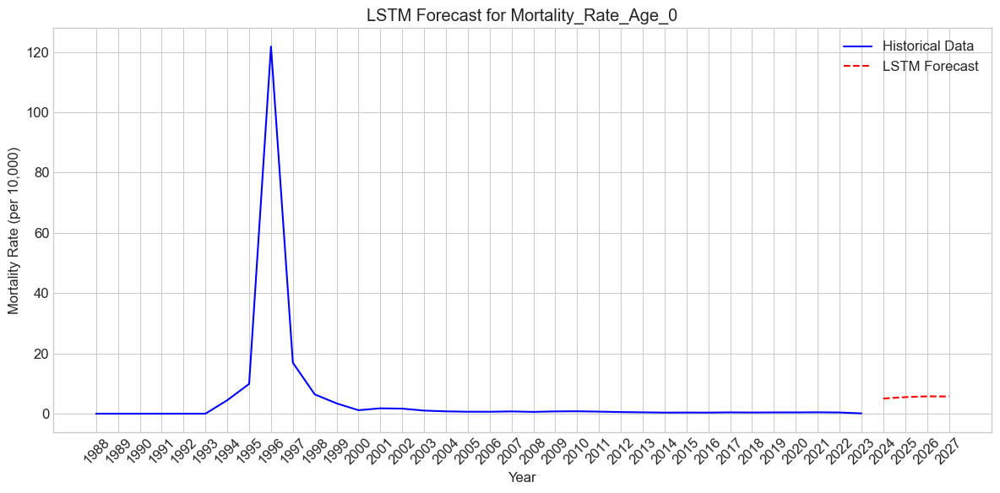

    Year  Mortality_Rate_Age_0
35  2023              0.106600
0   2024              5.027031
1   2025              5.495260
2   2026              5.767442
3   2027              5.711763

Forecasting for Mortality_Rate_Age_1:


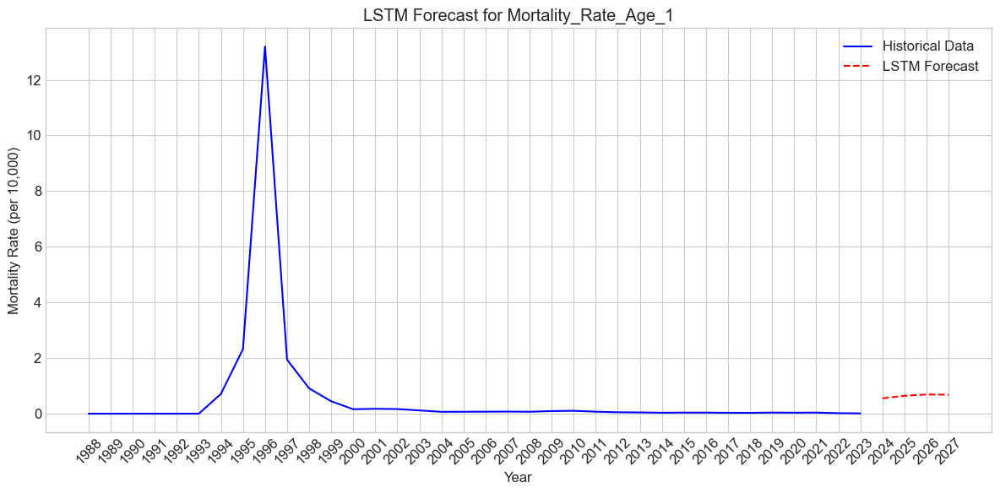

    Year  Mortality_Rate_Age_1
35  2023              0.011315
0   2024              0.553739
1   2025              0.644676
2   2026              0.690090
3   2027              0.683703

Forecasting for Mortality_Rate_Age_2:


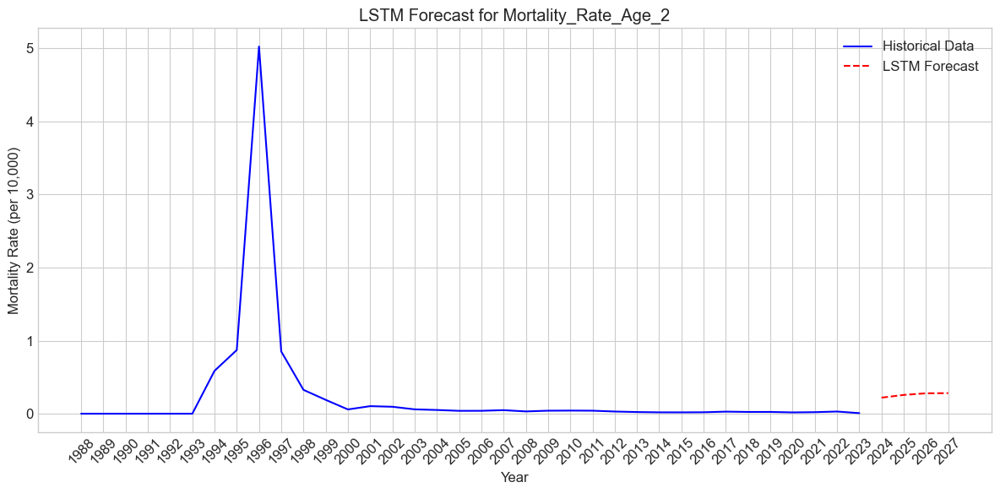

    Year  Mortality_Rate_Age_2
35  2023              0.007937
0   2024              0.219607
1   2025              0.256977
2   2026              0.279250
3   2027              0.281453

Forecasting for Mortality_Rate_Age_3:


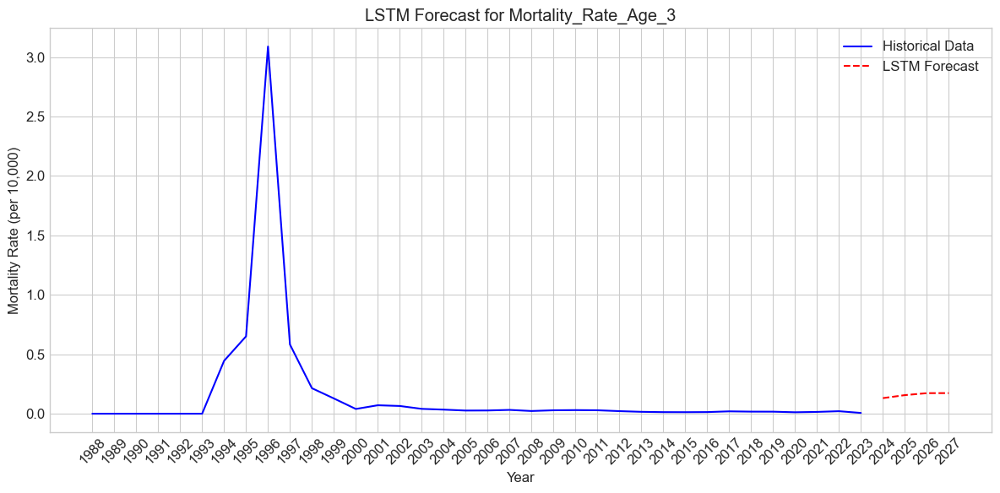

    Year  Mortality_Rate_Age_3
35  2023              0.006573
0   2024              0.130978
1   2025              0.156244
2   2026              0.172754
3   2027              0.173199

Forecasting for Mortality_Rate_Age_4:


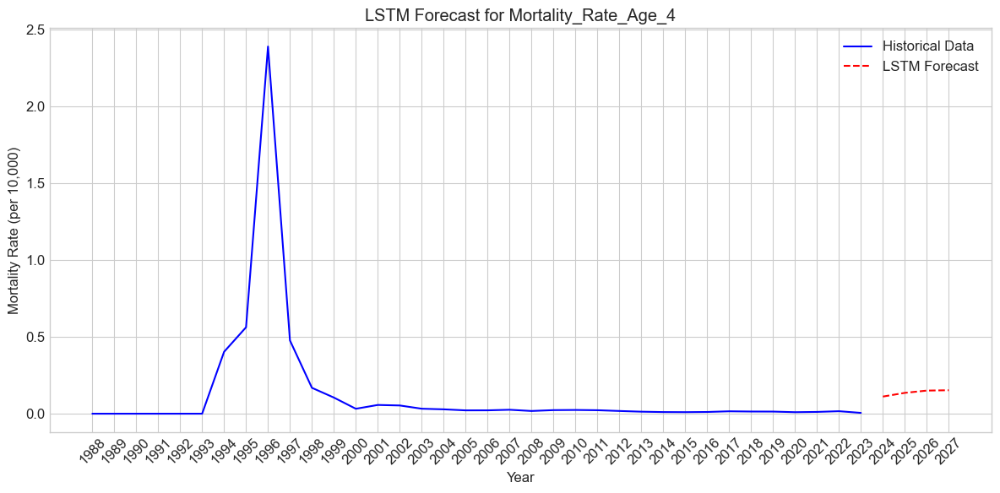

    Year  Mortality_Rate_Age_4
35  2023              0.005415
0   2024              0.111521
1   2025              0.135600
2   2026              0.150356
3   2027              0.152736

Forecasting for Mortality_Rate_Age_5_9:


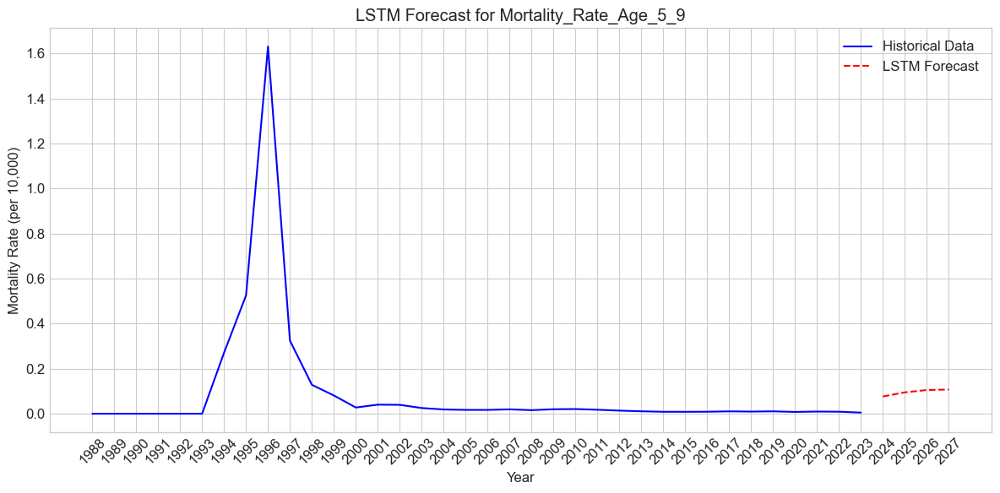

    Year  Mortality_Rate_Age_5_9
35  2023                0.004926
0   2024                0.076544
1   2025                0.094740
2   2026                0.105167
3   2027                0.107386

Forecasting for Mortality_Rate_Age_10_14:


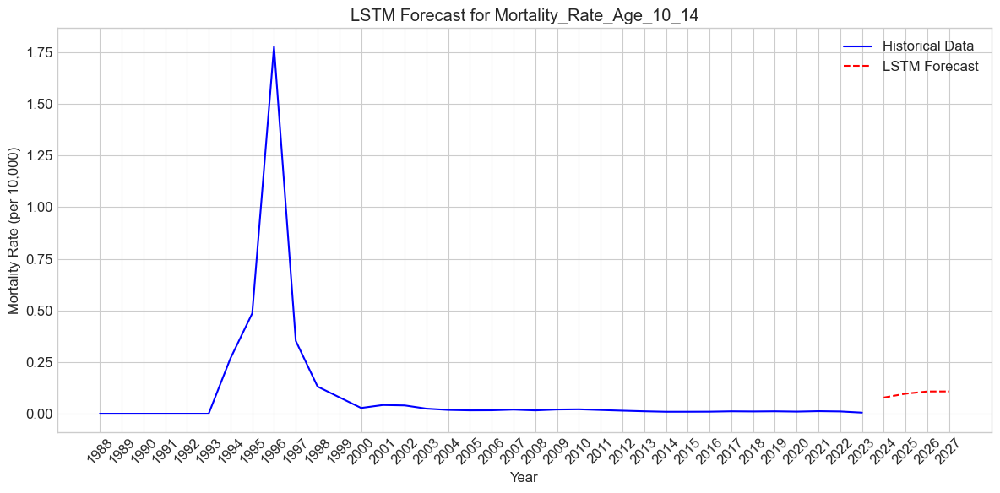

    Year  Mortality_Rate_Age_10_14
35  2023                  0.005336
0   2024                  0.078273
1   2025                  0.096942
2   2026                  0.107708
3   2027                  0.107871

Forecasting for Mortality_Rate_Age_15_19:


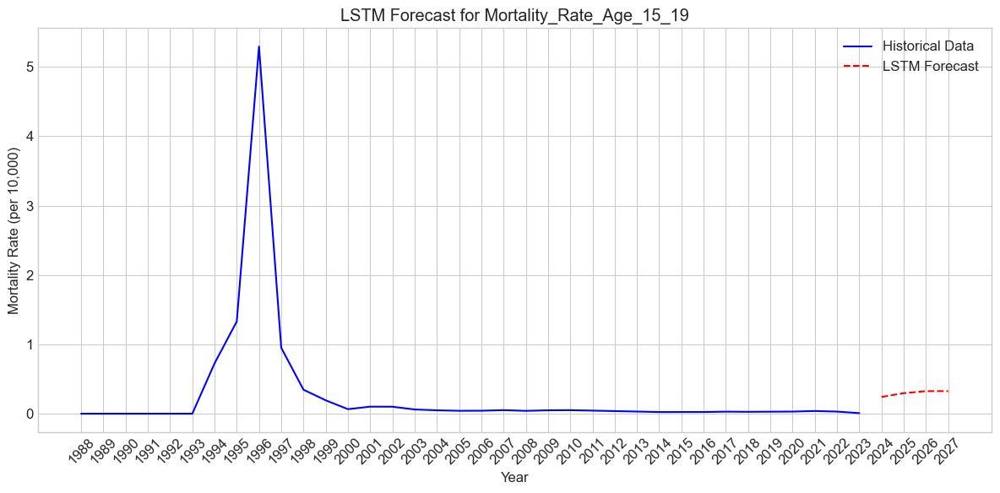

    Year  Mortality_Rate_Age_15_19
35  2023                  0.008317
0   2024                  0.241315
1   2025                  0.296001
2   2026                  0.325001
3   2027                  0.324716

Forecasting for Mortality_Rate_Age_20_24:


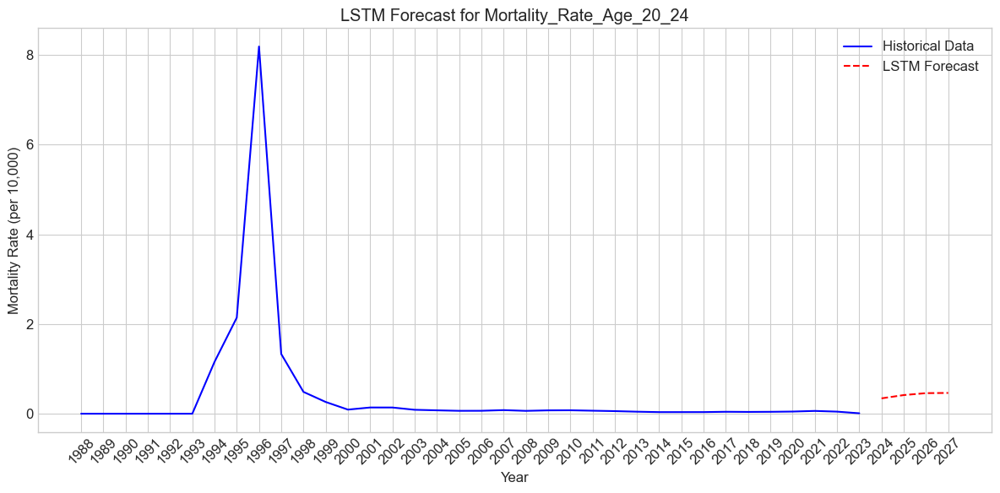

    Year  Mortality_Rate_Age_20_24
35  2023                  0.009471
0   2024                  0.342367
1   2025                  0.415578
2   2026                  0.458472
3   2027                  0.463303

Forecasting for Mortality_Rate_Age_25_29:


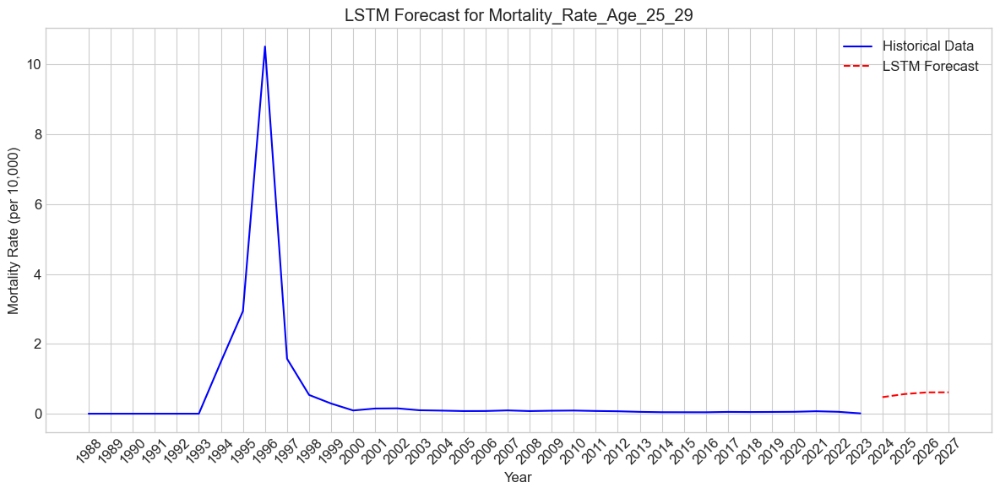

    Year  Mortality_Rate_Age_25_29
35  2023                  0.009821
0   2024                  0.474012
1   2025                  0.561940
2   2026                  0.610412
3   2027                  0.612654

Forecasting for Mortality_Rate_Age_30_34:


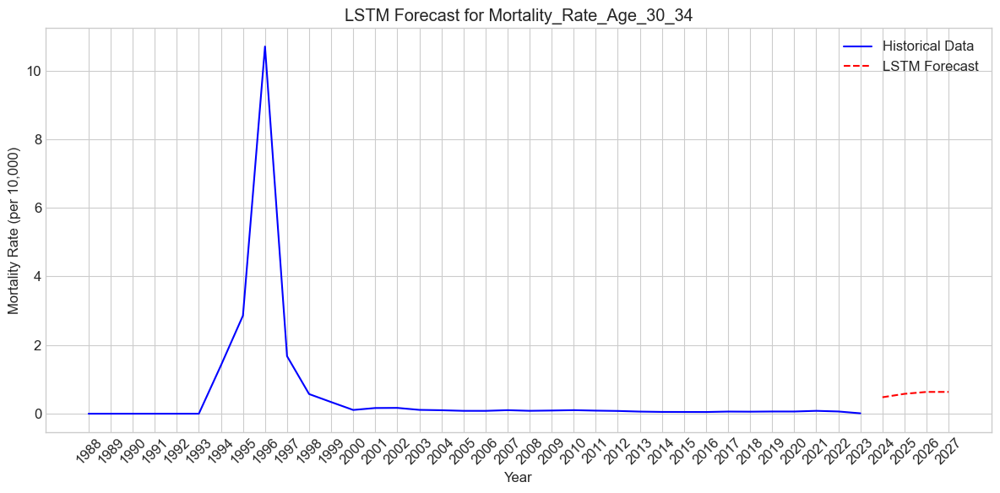

    Year  Mortality_Rate_Age_30_34
35  2023                  0.011524
0   2024                  0.479103
1   2025                  0.578825
2   2026                  0.634773
3   2027                  0.634593

Forecasting for Mortality_Rate_Age_35_39:


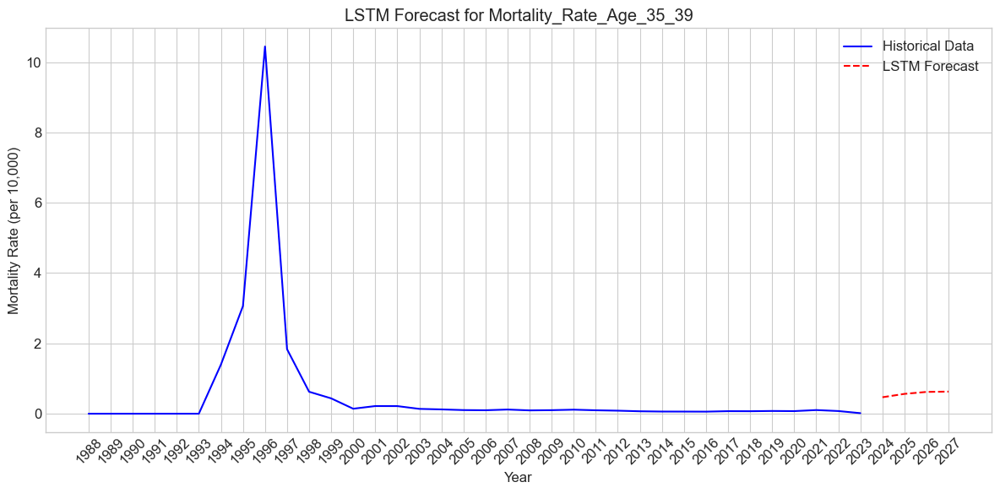

    Year  Mortality_Rate_Age_35_39
35  2023                  0.015470
0   2024                  0.467864
1   2025                  0.563852
2   2026                  0.619751
3   2027                  0.628744

Forecasting for Mortality_Rate_Age_40_44:


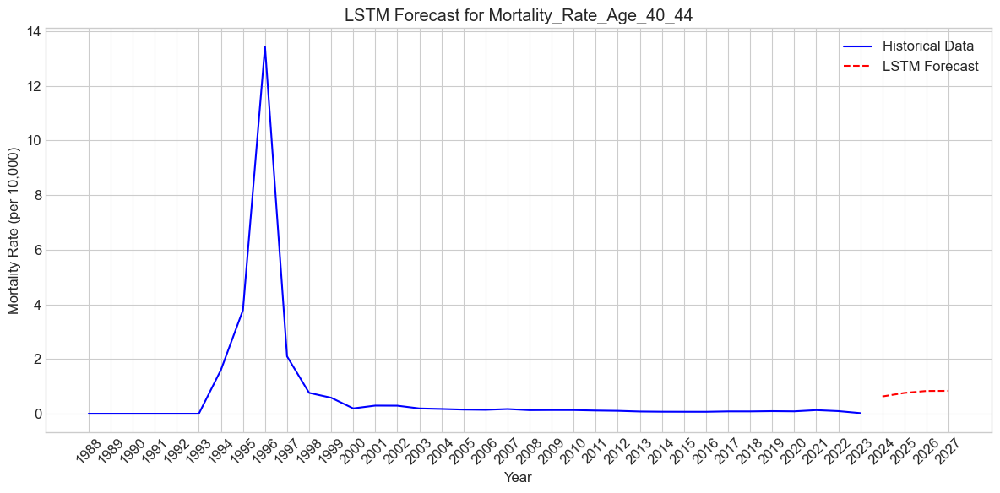

    Year  Mortality_Rate_Age_40_44
35  2023                  0.022644
0   2024                  0.631735
1   2025                  0.761320
2   2026                  0.832671
3   2027                  0.836369

Forecasting for Mortality_Rate_Age_45_49:


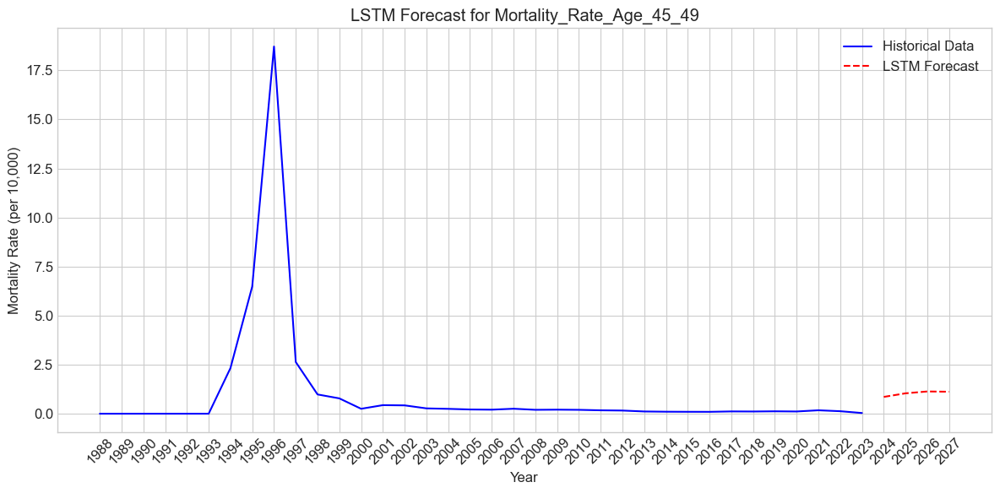

    Year  Mortality_Rate_Age_45_49
35  2023                  0.035193
0   2024                  0.856547
1   2025                  1.038888
2   2026                  1.133651
3   2027                  1.119665

Forecasting for Mortality_Rate_Age_50_54:


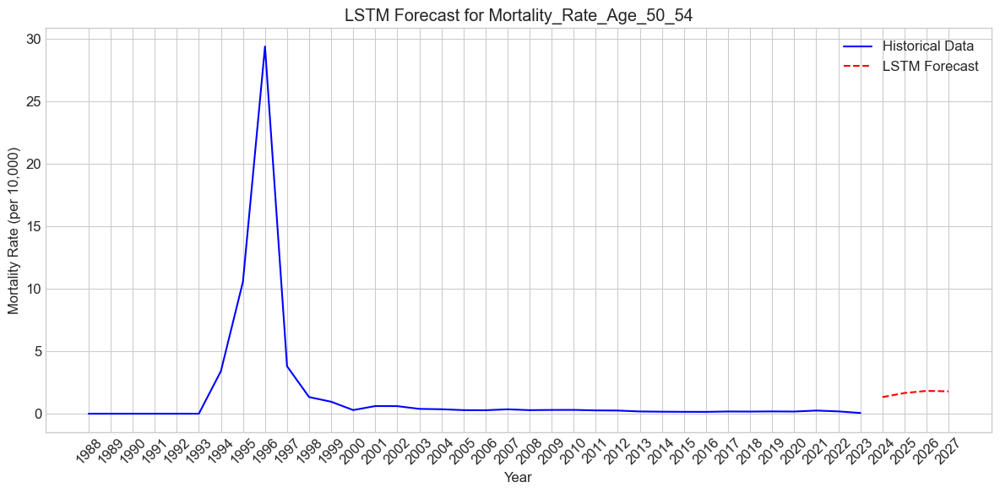

    Year  Mortality_Rate_Age_50_54
35  2023                  0.058225
0   2024                  1.326384
1   2025                  1.656630
2   2026                  1.825541
3   2027                  1.790753

Forecasting for Mortality_Rate_Age_55_59:


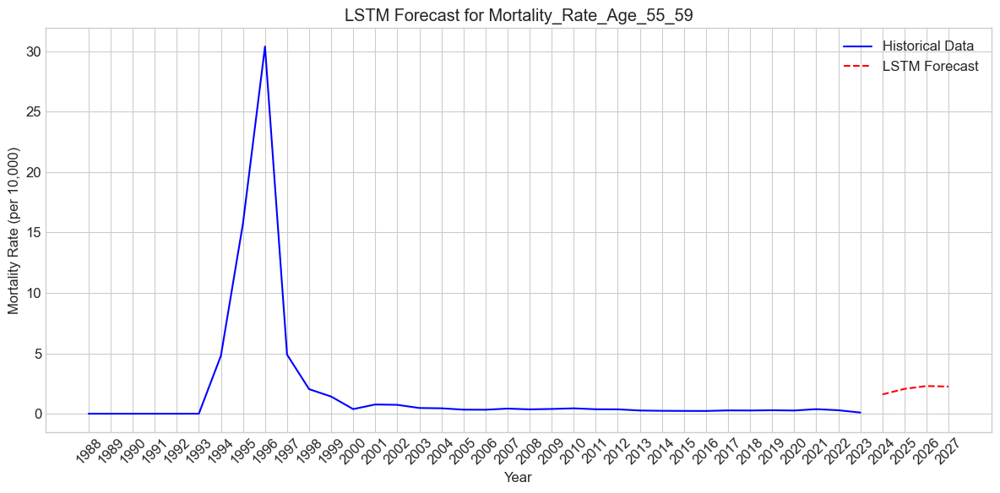

    Year  Mortality_Rate_Age_55_59
35  2023                  0.095043
0   2024                  1.595967
1   2025                  2.053619
2   2026                  2.290049
3   2027                  2.245792

Forecasting for Mortality_Rate_Age_60_64:


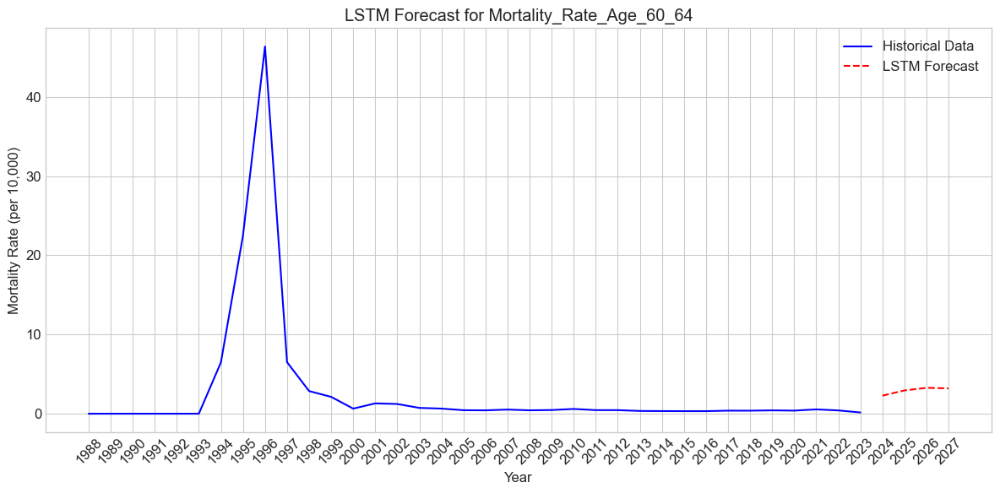

    Year  Mortality_Rate_Age_60_64
35  2023                  0.155852
0   2024                  2.280268
1   2025                  2.939160
2   2026                  3.266559
3   2027                  3.196399

Forecasting for Mortality_Rate_Age_65_69:


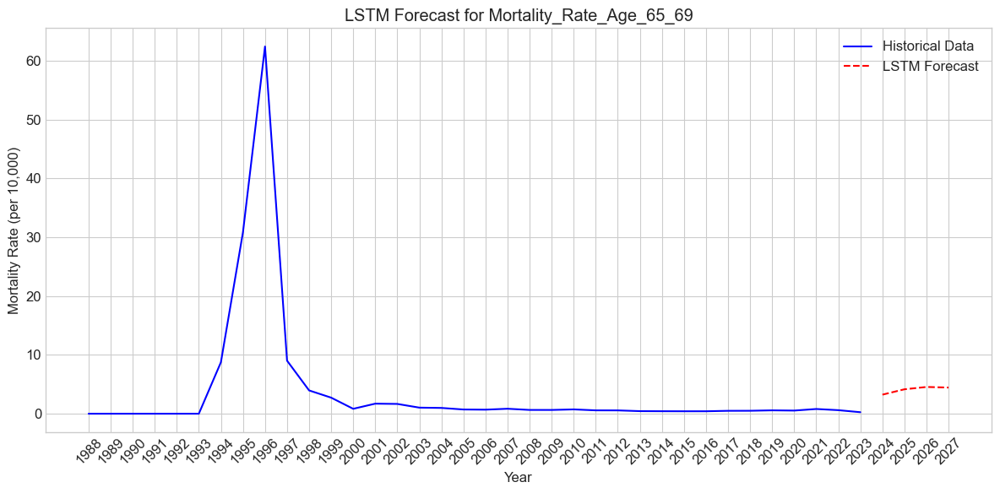

    Year  Mortality_Rate_Age_65_69
35  2023                  0.254787
0   2024                  3.238334
1   2025                  4.152359
2   2026                  4.546561
3   2027                  4.446276

Forecasting for Mortality_Rate_Age_70_74:


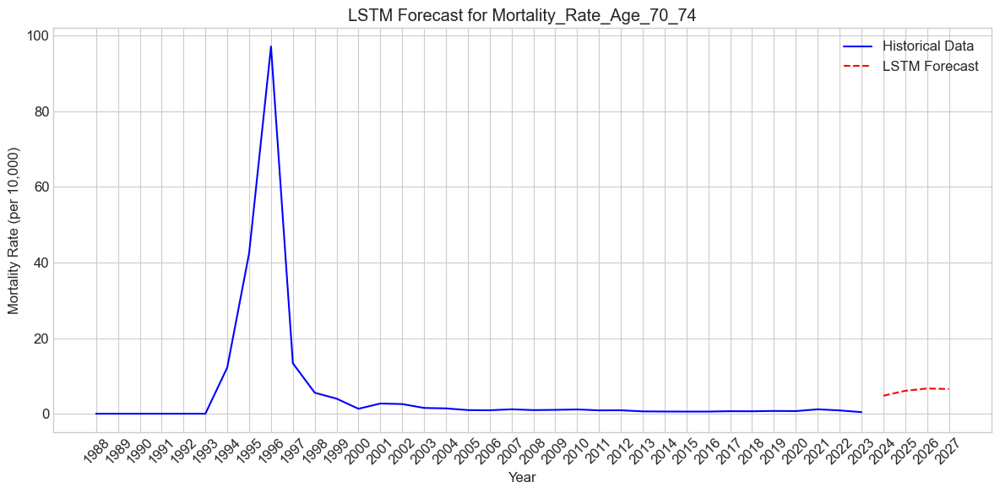

    Year  Mortality_Rate_Age_70_74
35  2023                  0.412803
0   2024                  4.751911
1   2025                  6.057853
2   2026                  6.675985
3   2027                  6.526495

Forecasting for Mortality_Rate_Age_75_79:


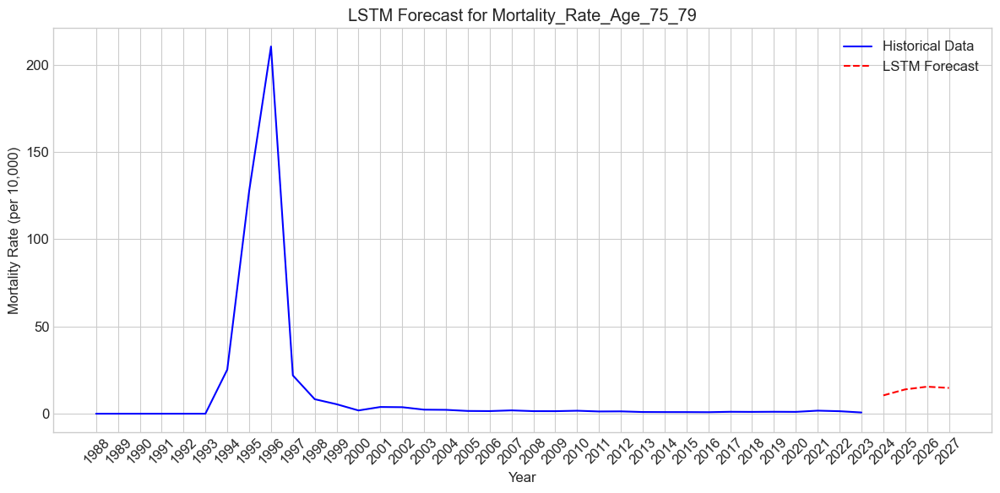

    Year  Mortality_Rate_Age_75_79
35  2023                  0.701599
0   2024                 10.493515
1   2025                 13.933896
2   2026                 15.486104
3   2027                 14.773245

Forecasting for Mortality_Rate_Age_80_84:


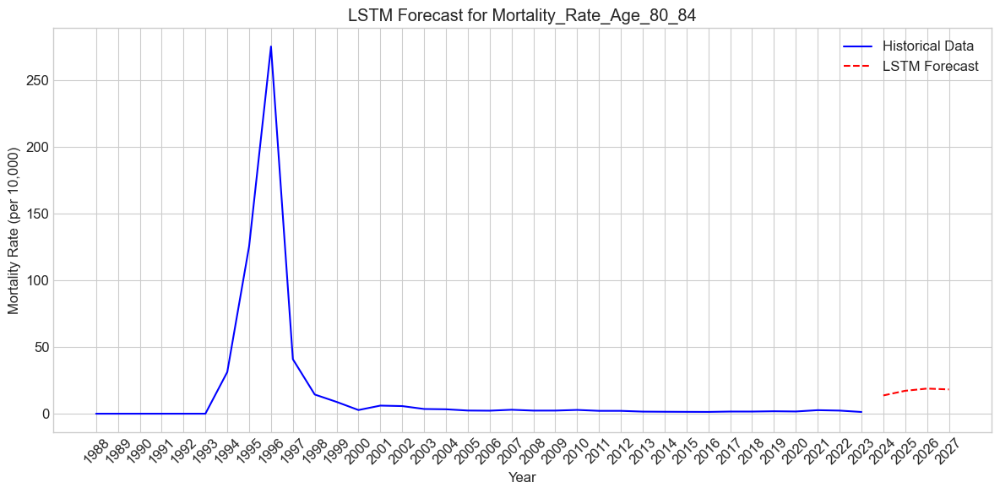

    Year  Mortality_Rate_Age_80_84
35  2023                  1.303298
0   2024                 13.683827
1   2025                 17.176361
2   2026                 18.827642
3   2027                 18.205536

Forecasting for Mortality_Rate_Age_85_89:


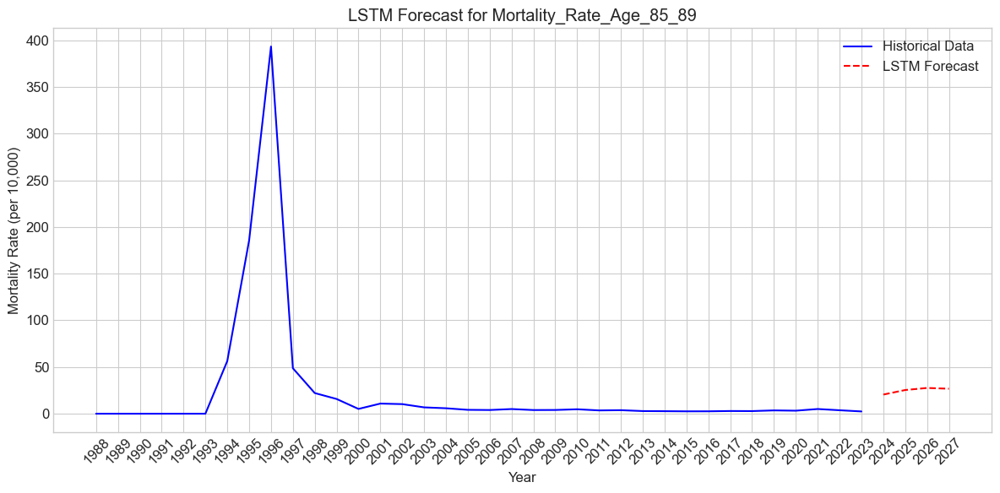

    Year  Mortality_Rate_Age_85_89
35  2023                  2.423103
0   2024                 20.489811
1   2025                 25.350307
2   2026                 27.566698
3   2027                 26.748602

Forecasting for Mortality_Rate_Age_90_94:


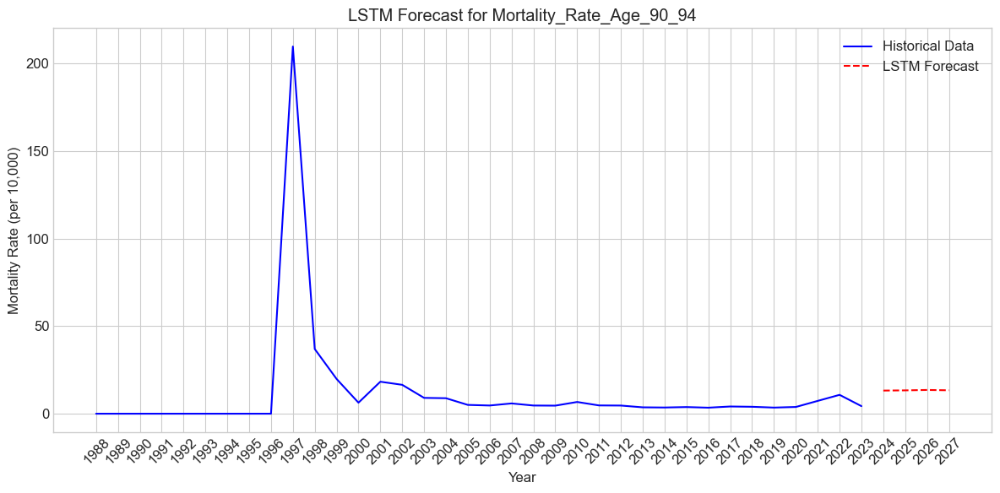

    Year  Mortality_Rate_Age_90_94
35  2023                  4.324919
0   2024                 13.213389
1   2025                 13.333140
2   2026                 13.564136
3   2027                 13.380472

Forecasting for Mortality_Rate_Age_95_plus:


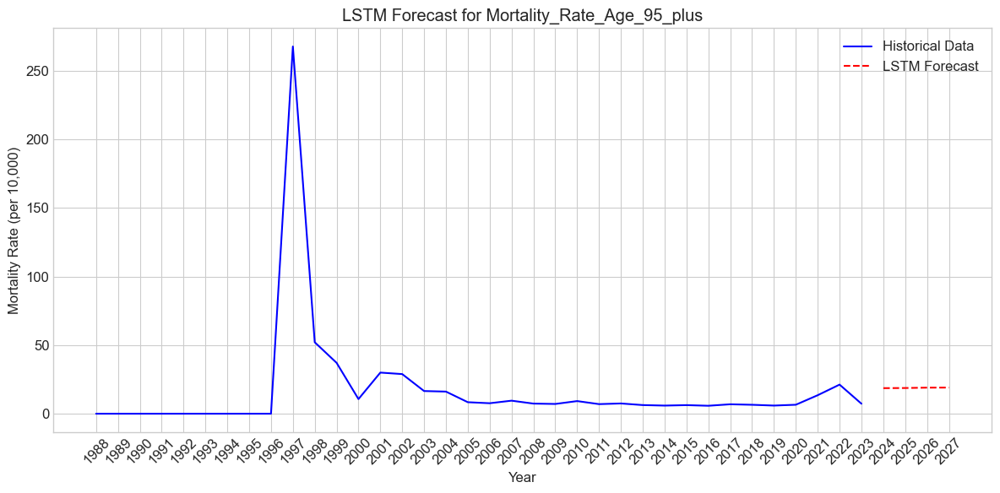

    Year  Mortality_Rate_Age_95_plus
35  2023                    7.290499
0   2024                   18.643200
1   2025                   18.736635
2   2026                   19.005680
3   2027                   19.055555

Forecasting for Mortality_Rate_Age_Unspecified:


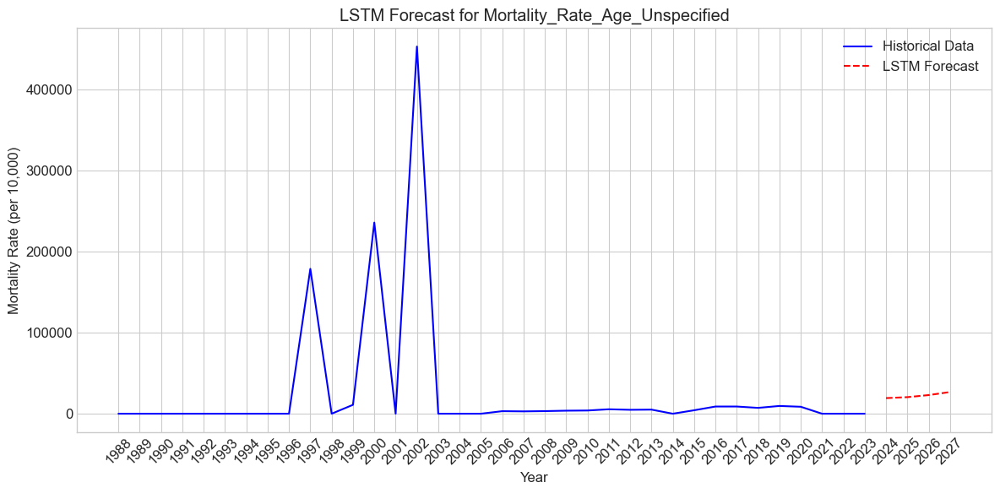

    Year  Mortality_Rate_Age_Unspecified
35  2023                        0.000000
0   2024                    19228.201172
1   2025                    20413.279297
2   2026                    22968.455078
3   2027                    26713.566406

Summary of Mortality Rate Forecasts for Next 4 Years (per 10,000):
   Year  Mortality_Rate_All_Ages  Mortality_Rate_Age_0  Mortality_Rate_Age_1  \
0  2024                 1.511505              5.027031              0.553739   
1  2025                 1.890268              5.495260              0.644676   
2  2026                 2.076487              5.767442              0.690090   
3  2027                 2.032843              5.711763              0.683703   

   Mortality_Rate_Age_2  Mortality_Rate_Age_3  Mortality_Rate_Age_4  \
0              0.219607              0.130978              0.111521   
1              0.256977              0.156244              0.135600   
2              0.279250              0.172754              0.150356   
3

In [27]:
# Create custom dataset for LSTM
def create_dataset(dataset, time_step=1):
    X, Y = [], []
    for i in range(len(dataset)-time_step-1):
        a = dataset[i:(i+time_step), 0]
        X.append(a)
        Y.append(dataset[i + time_step, 0])
    return np.array(X), np.array(Y)

# Function to build LSTM model
def build_lstm_model(X_train):
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(X_train.shape[1], 1)))
    model.add(Dropout(0.2))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

# Function to calculate mortality rate per 10,000 population
def calculate_mortality_rate(df):
    # List of death and population column pairs
    column_pairs = [
        ('Deaths_All_Ages', 'Pop_All_Ages'),
        ('Deaths_Age_0', 'Pop_Age_0'),
        ('Deaths_Age_1', 'Pop_Age_1'),
        ('Deaths_Age_2', 'Pop_Age_2'),
        ('Deaths_Age_3', 'Pop_Age_3'),
        ('Deaths_Age_4', 'Pop_Age_4'),
        ('Deaths_Age_5_9', 'Pop_Age_5_9'),
        ('Deaths_Age_10_14', 'Pop_Age_10_14'),
        ('Deaths_Age_15_19', 'Pop_Age_15_19'),
        ('Deaths_Age_20_24', 'Pop_Age_20_24'),
        ('Deaths_Age_25_29', 'Pop_Age_25_29'),
        ('Deaths_Age_30_34', 'Pop_Age_30_34'),
        ('Deaths_Age_35_39', 'Pop_Age_35_39'),
        ('Deaths_Age_40_44', 'Pop_Age_40_44'),
        ('Deaths_Age_45_49', 'Pop_Age_45_49'),
        ('Deaths_Age_50_54', 'Pop_Age_50_54'),
        ('Deaths_Age_55_59', 'Pop_Age_55_59'),
        ('Deaths_Age_60_64', 'Pop_Age_60_64'),
        ('Deaths_Age_65_69', 'Pop_Age_65_69'),
        ('Deaths_Age_70_74', 'Pop_Age_70_74'),
        ('Deaths_Age_75_79', 'Pop_Age_75_79'),
        ('Deaths_Age_80_84', 'Pop_Age_80_84'),
        ('Deaths_Age_85_89', 'Pop_Age_85_89'),
        ('Deaths_Age_90_94', 'Pop_Age_90_94'),
        ('Deaths_Age_95_plus', 'Pop_Age_95_plus'),
        ('Deaths_Age_Unspecified', 'Pop_Age_Unspecified')
    ]
    
    # First group by year to get total deaths and population for each year
    yearly_data = df.groupby('Year')
    
    # Create a dataframe to hold the yearly mortality rates
    mortality_rates = []
    
    # For each year's data
    for year, year_group in yearly_data:
        year_data = {'Year': year}
        
        # Calculate mortality rate for each age group (per 10,000 population)
        for death_col, pop_col in column_pairs:
            # Sum deaths and population for this year and age group
            total_deaths = year_group[death_col].sum()
            total_pop = year_group[pop_col].sum()
            
            # Create mortality rate column name
            rate_col = death_col.replace('Deaths', 'Mortality_Rate')
            
            # Calculate mortality rate per 10,000 population
            # Handle division by zero
            if total_pop > 0:
                year_data[rate_col] = (total_deaths / total_pop) * 10000
            else:
                year_data[rate_col] = 0
        
        mortality_rates.append(year_data)
    
    # Convert to DataFrame
    df_rates = pd.DataFrame(mortality_rates)
    
    return df_rates

# Function to forecast using LSTM
def forecast_lstm(df, column_name, years_to_forecast=4, plot=True):
    # The data is already grouped by year from the calculate_mortality_rate function
    data = df[['Year', column_name]].copy()
    
    # Feature and target
    dataset = data[column_name].values.reshape(-1, 1)
    
    # Normalize the data
    scaler = MinMaxScaler(feature_range=(0, 1))
    dataset_scaled = scaler.fit_transform(dataset)
    
    # Create the training dataset
    time_step = 3
    X, y = create_dataset(dataset_scaled, time_step)
    
    # If we don't have enough data points, reduce time_step
    if len(X) < 2 and time_step > 1:
        time_step = 1
        X, y = create_dataset(dataset_scaled, time_step)
    
    # Reshape input to be [samples, time steps, features]
    X = X.reshape(X.shape[0], X.shape[1], 1)
    
    # Build and train LSTM model
    model = build_lstm_model(X)
    model.fit(X, y, epochs=100, batch_size=32, verbose=0)
    
    # Get the last 'time_step' values to predict the next value
    last_data = dataset_scaled[-time_step:].reshape(1, time_step, 1)
    
    # Forecast next 'years_to_forecast' values
    forecasted_scaled = []
    current_batch = last_data
    
    for _ in range(years_to_forecast):
        # Predict next value
        next_pred = model.predict(current_batch, verbose=0)[0]
        forecasted_scaled.append(next_pred)
        
        # Update batch for next prediction
        current_batch = np.append(current_batch[:, 1:, :], [[next_pred]], axis=1)
    
    # Convert predictions back to original scale
    forecasted_values = scaler.inverse_transform(np.array(forecasted_scaled).reshape(-1, 1))
    
    # Create years for forecasted values
    last_year = data['Year'].iloc[-1]
    forecast_years = np.arange(last_year + 1, last_year + years_to_forecast + 1)
    
    # Creating a dataframe with actual and forecasted values
    actual_df = data.copy()
    forecast_df = pd.DataFrame({
        'Year': forecast_years, 
        column_name: forecasted_values.flatten()
    })
    
    result_df = pd.concat([actual_df, forecast_df])
    
    if plot:
        plt.figure(figsize=(12, 6))
        plt.plot(data['Year'], data[column_name], 'b-', label='Historical Data')
        plt.plot(forecast_years, forecasted_values, 'r--', label='LSTM Forecast')
        plt.title(f'LSTM Forecast for {column_name}')
        plt.xlabel('Year')
        plt.ylabel('Mortality Rate (per 10,000)')
        plt.legend()
        plt.grid(True)
        plt.xticks(result_df['Year'], rotation=45)
        plt.tight_layout()
        plt.show()
    
    return result_df, model

def main():
    # First, calculate mortality rates per 10,000 population by grouping by year
    print("Calculating mortality rates by grouping data by year...")
    mortality_df = calculate_mortality_rate(all_parts_with_country)
    
    # Display the first few rows of mortality data to verify calculations
    print("\nSample of calculated mortality rates:")
    print(mortality_df.head())
    
    # List of mortality rate columns to forecast
    mortality_columns = [
        'Mortality_Rate_All_Ages', 'Mortality_Rate_Age_0', 'Mortality_Rate_Age_1', 
        'Mortality_Rate_Age_2', 'Mortality_Rate_Age_3', 'Mortality_Rate_Age_4', 
        'Mortality_Rate_Age_5_9', 'Mortality_Rate_Age_10_14', 'Mortality_Rate_Age_15_19', 
        'Mortality_Rate_Age_20_24', 'Mortality_Rate_Age_25_29', 'Mortality_Rate_Age_30_34', 
        'Mortality_Rate_Age_35_39', 'Mortality_Rate_Age_40_44', 'Mortality_Rate_Age_45_49', 
        'Mortality_Rate_Age_50_54', 'Mortality_Rate_Age_55_59', 'Mortality_Rate_Age_60_64', 
        'Mortality_Rate_Age_65_69', 'Mortality_Rate_Age_70_74', 'Mortality_Rate_Age_75_79', 
        'Mortality_Rate_Age_80_84', 'Mortality_Rate_Age_85_89', 'Mortality_Rate_Age_90_94', 
        'Mortality_Rate_Age_95_plus', 'Mortality_Rate_Age_Unspecified'
    ]
    
    # Dictionary to store forecasts
    forecasts = {}
    models = {}
    
    # Forecast for all ages combined
    print("\nForecasting for Mortality_Rate_All_Ages:")
    forecasts['Mortality_Rate_All_Ages'], models['Mortality_Rate_All_Ages'] = forecast_lstm(mortality_df, 'Mortality_Rate_All_Ages')
    print(forecasts['Mortality_Rate_All_Ages'].tail())
    
    # Forecast for each age group
    for rate_col in mortality_columns[1:]:  # Skip Mortality_Rate_All_Ages as we already did it
        print(f"\nForecasting for {rate_col}:")
        forecasts[rate_col], models[rate_col] = forecast_lstm(mortality_df, rate_col)
        print(forecasts[rate_col].tail())
    
    # Create a summary dataframe with forecasts for all age groups
    last_year = mortality_df['Year'].max()
    forecast_years = range(last_year + 1, last_year + 5)  # 4 years forecast
    
    summary = pd.DataFrame({
        'Year': list(forecast_years)
    })
    
    for col in mortality_columns:
        forecast_values = forecasts[col][forecasts[col]['Year'].isin(forecast_years)][col].values
        summary[col] = forecast_values
    
    print("\nSummary of Mortality Rate Forecasts for Next 4 Years (per 10,000):")
    print(summary)
    
    return forecasts, models, summary, mortality_df

# Run the forecasting
if __name__ == "__main__":
    forecasts, models, summary, mortality_df = main()

# Arima for mortality rate forecasting

Calculating mortality rates by grouping data by year...

Forecasting for Mortality_Rate_All_Ages:
Processing Mortality_Rate_All_Ages...
Using ARIMA parameters: (1,1,1)
Fitting ARIMA model...
Forecasting next 4 years...


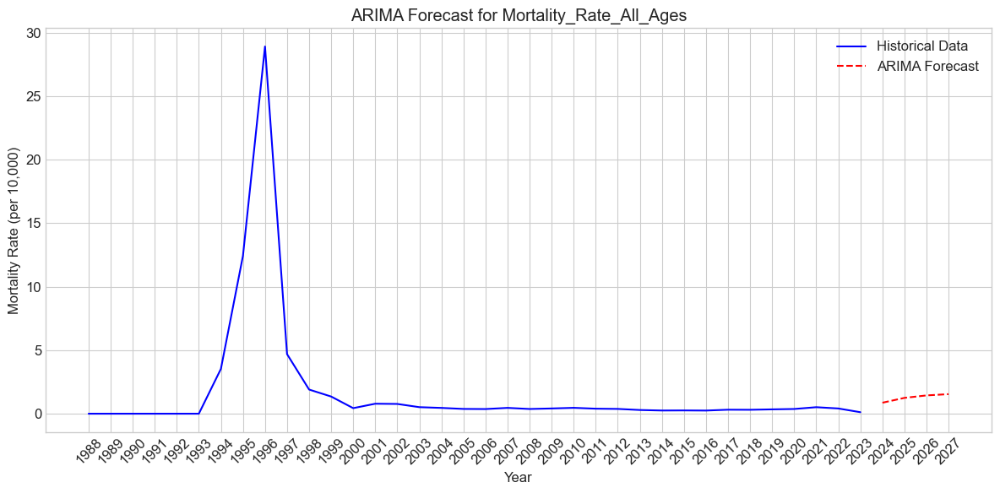

    Year  Mortality_Rate_All_Ages
35  2023                 0.117865
0   2024                 0.865064
1   2025                 1.246045
2   2026                 1.440298
3   2027                 1.539343

Forecasting for Mortality_Rate_Age_0:
Processing Mortality_Rate_Age_0...
Using ARIMA parameters: (1,1,1)
Fitting ARIMA model...
Forecasting next 4 years...


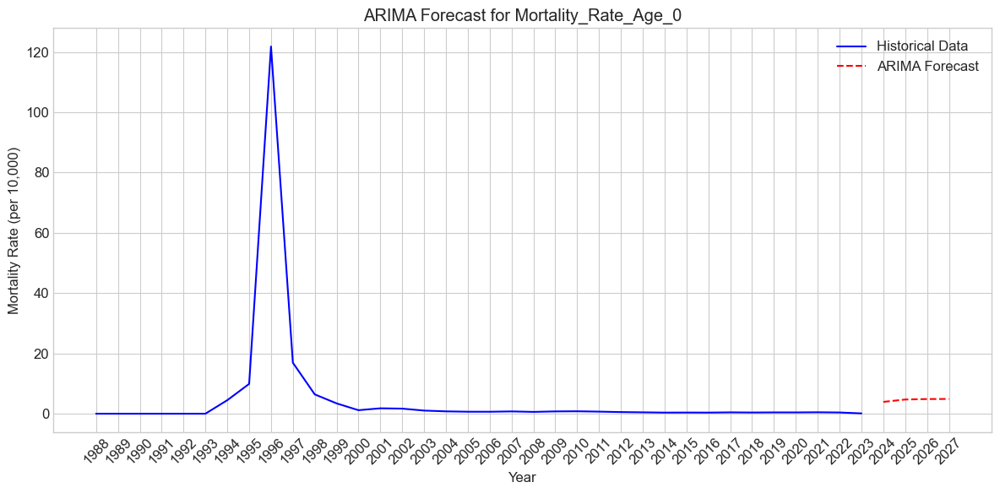

    Year  Mortality_Rate_Age_0
35  2023              0.106600
0   2024              3.923796
1   2025              4.704917
2   2026              4.864759
3   2027              4.897468

Forecasting for Mortality_Rate_Age_1:
Processing Mortality_Rate_Age_1...
Using ARIMA parameters: (1,1,1)
Fitting ARIMA model...
Forecasting next 4 years...


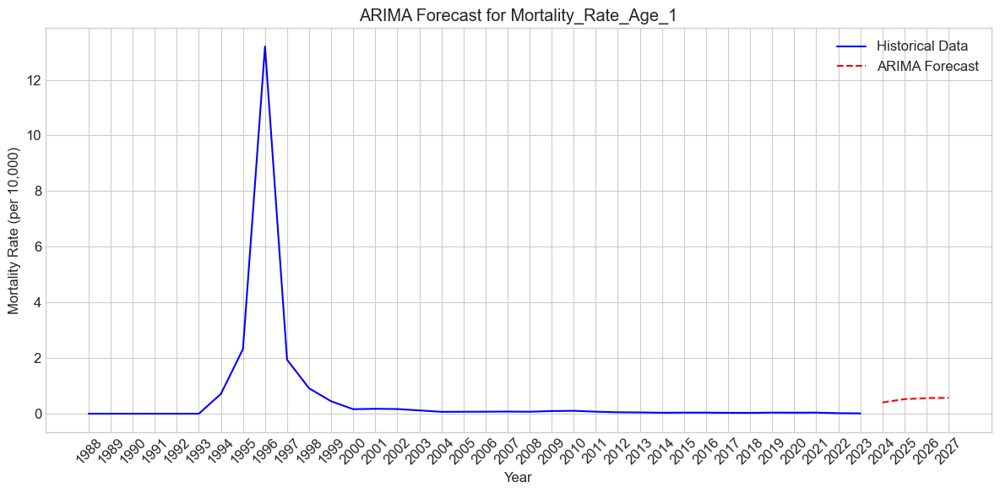

    Year  Mortality_Rate_Age_1
35  2023              0.011315
0   2024              0.403994
1   2025              0.523234
2   2026              0.559442
3   2027              0.570436

Forecasting for Mortality_Rate_Age_2:
Processing Mortality_Rate_Age_2...
Using ARIMA parameters: (1,1,1)
Fitting ARIMA model...
Forecasting next 4 years...


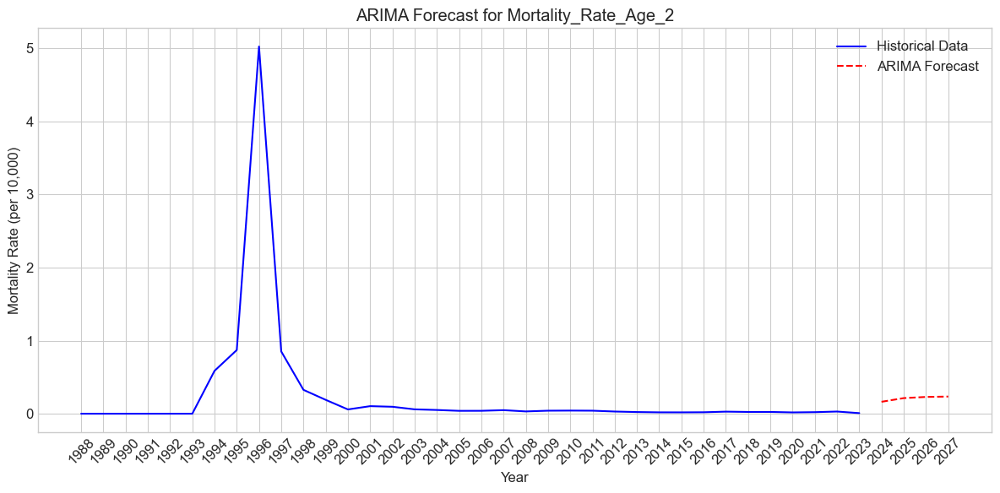

    Year  Mortality_Rate_Age_2
35  2023              0.007937
0   2024              0.163269
1   2025              0.213411
2   2026              0.229598
3   2027              0.234823

Forecasting for Mortality_Rate_Age_3:
Processing Mortality_Rate_Age_3...
Using ARIMA parameters: (1,1,1)
Fitting ARIMA model...
Forecasting next 4 years...


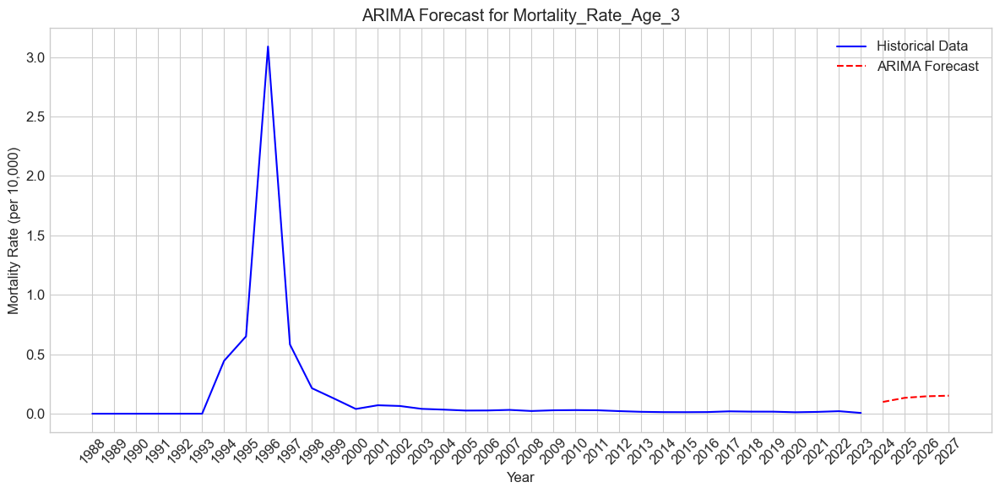

    Year  Mortality_Rate_Age_3
35  2023              0.006573
0   2024              0.099017
1   2025              0.133623
2   2026              0.146577
3   2027              0.151427

Forecasting for Mortality_Rate_Age_4:
Processing Mortality_Rate_Age_4...
Using ARIMA parameters: (1,1,1)
Fitting ARIMA model...
Forecasting next 4 years...


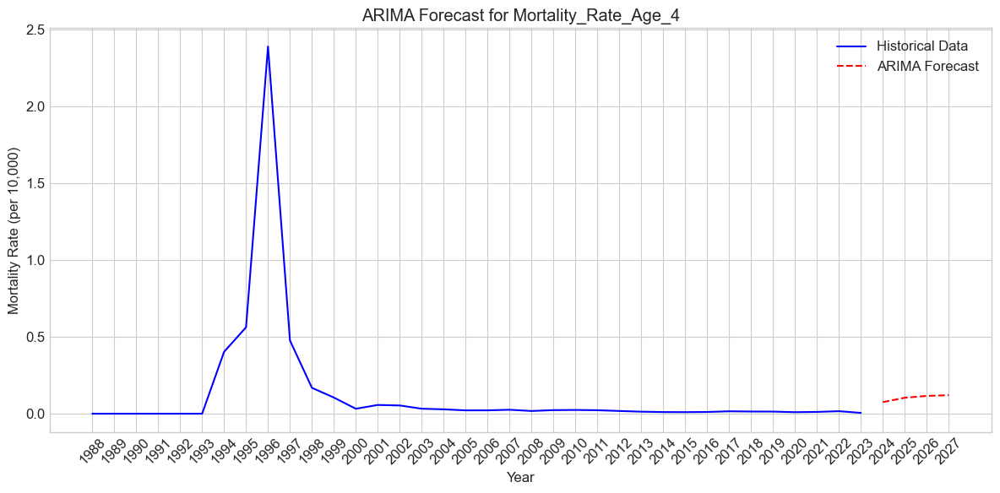

    Year  Mortality_Rate_Age_4
35  2023              0.005415
0   2024              0.075501
1   2025              0.104014
2   2026              0.115615
3   2027              0.120334

Forecasting for Mortality_Rate_Age_5_9:
Processing Mortality_Rate_Age_5_9...
Using ARIMA parameters: (1,1,1)
Fitting ARIMA model...
Forecasting next 4 years...


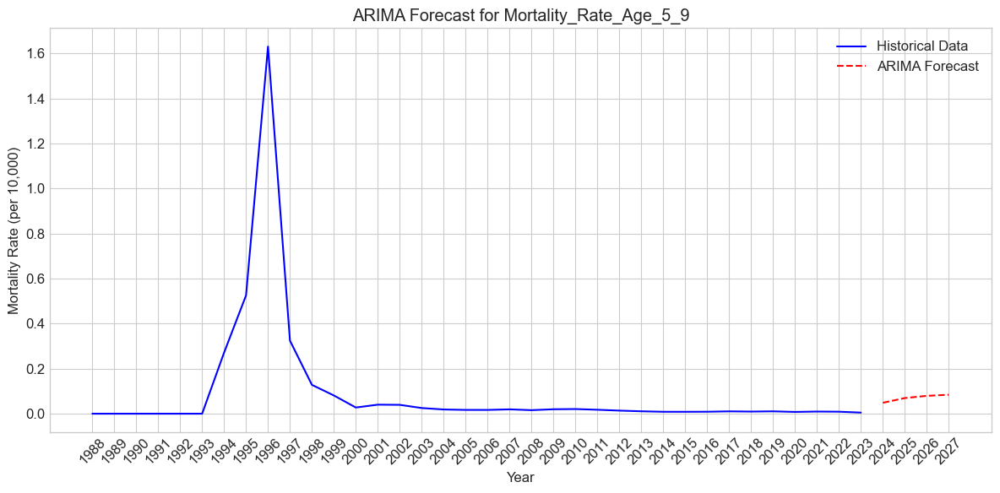

    Year  Mortality_Rate_Age_5_9
35  2023                0.004926
0   2024                0.048582
1   2025                0.069416
2   2026                0.079358
3   2027                0.084102

Forecasting for Mortality_Rate_Age_10_14:
Processing Mortality_Rate_Age_10_14...
Using ARIMA parameters: (1,1,1)
Fitting ARIMA model...
Forecasting next 4 years...


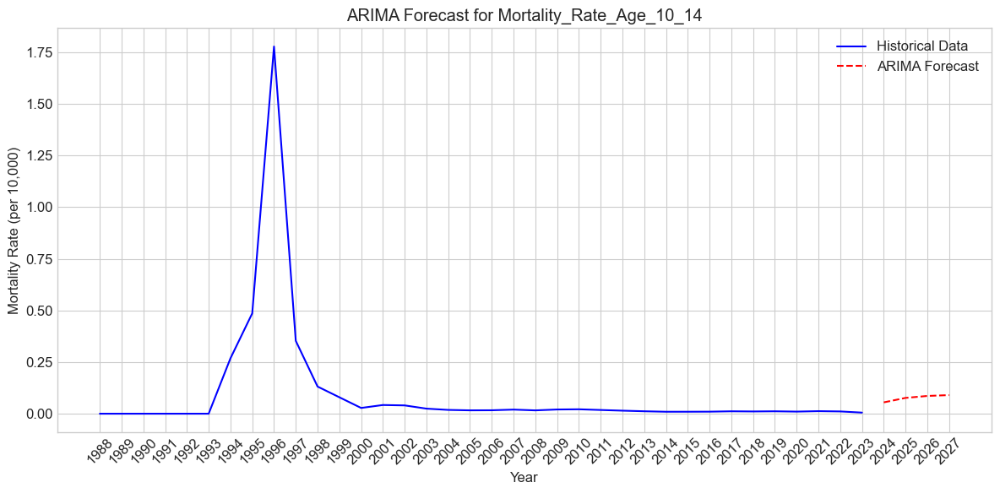

    Year  Mortality_Rate_Age_10_14
35  2023                  0.005336
0   2024                  0.054874
1   2025                  0.076519
2   2026                  0.085977
3   2027                  0.090110

Forecasting for Mortality_Rate_Age_15_19:
Processing Mortality_Rate_Age_15_19...
Using ARIMA parameters: (1,1,1)
Fitting ARIMA model...
Forecasting next 4 years...


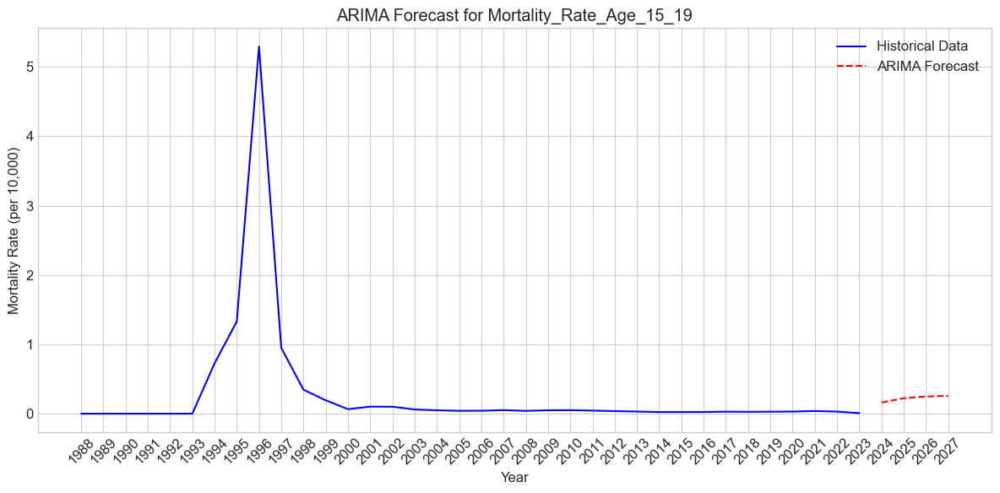

    Year  Mortality_Rate_Age_15_19
35  2023                  0.008317
0   2024                  0.161374
1   2025                  0.222959
2   2026                  0.247739
3   2027                  0.257709

Forecasting for Mortality_Rate_Age_20_24:
Processing Mortality_Rate_Age_20_24...
Using ARIMA parameters: (1,1,1)
Fitting ARIMA model...
Forecasting next 4 years...


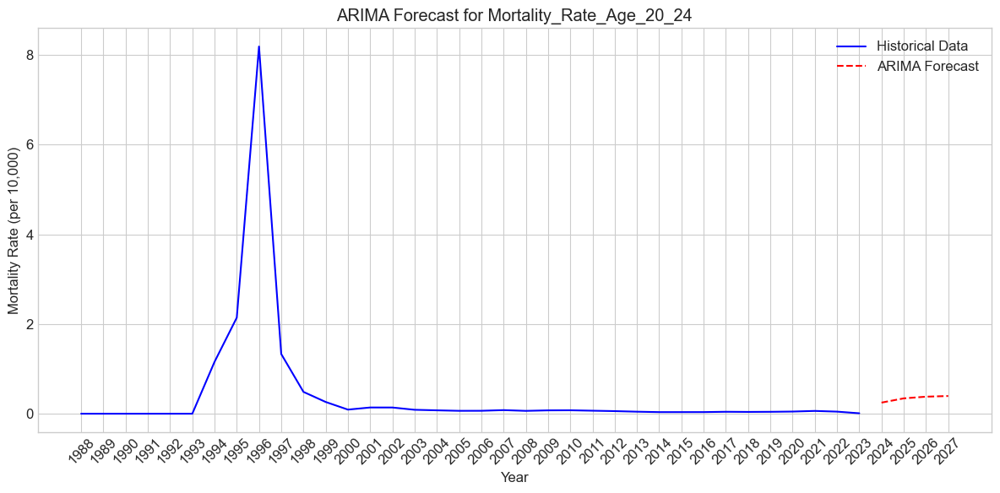

    Year  Mortality_Rate_Age_20_24
35  2023                  0.009471
0   2024                  0.247526
1   2025                  0.342149
2   2026                  0.379760
3   2027                  0.394710

Forecasting for Mortality_Rate_Age_25_29:
Processing Mortality_Rate_Age_25_29...
Using ARIMA parameters: (1,1,1)
Fitting ARIMA model...
Forecasting next 4 years...


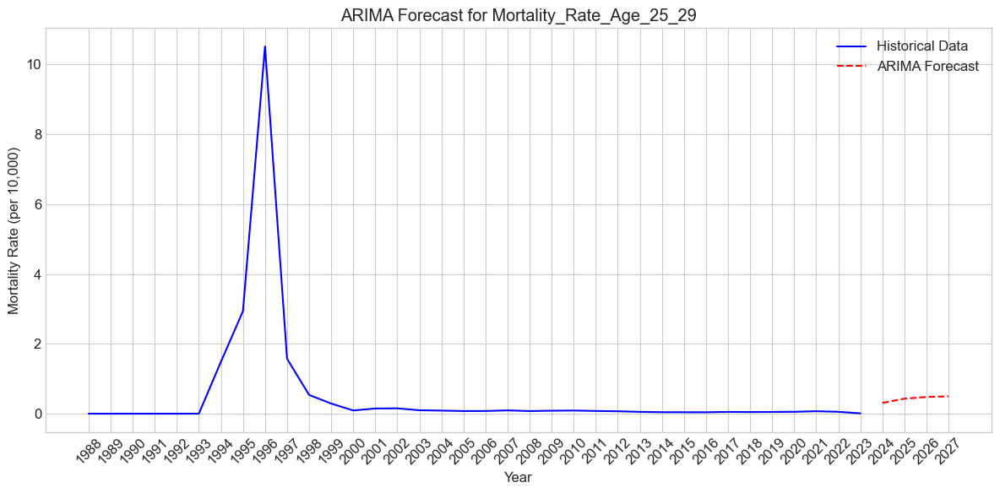

    Year  Mortality_Rate_Age_25_29
35  2023                  0.009821
0   2024                  0.309602
1   2025                  0.430093
2   2026                  0.478523
3   2027                  0.497988

Forecasting for Mortality_Rate_Age_30_34:
Processing Mortality_Rate_Age_30_34...
Using ARIMA parameters: (1,1,1)
Fitting ARIMA model...
Forecasting next 4 years...


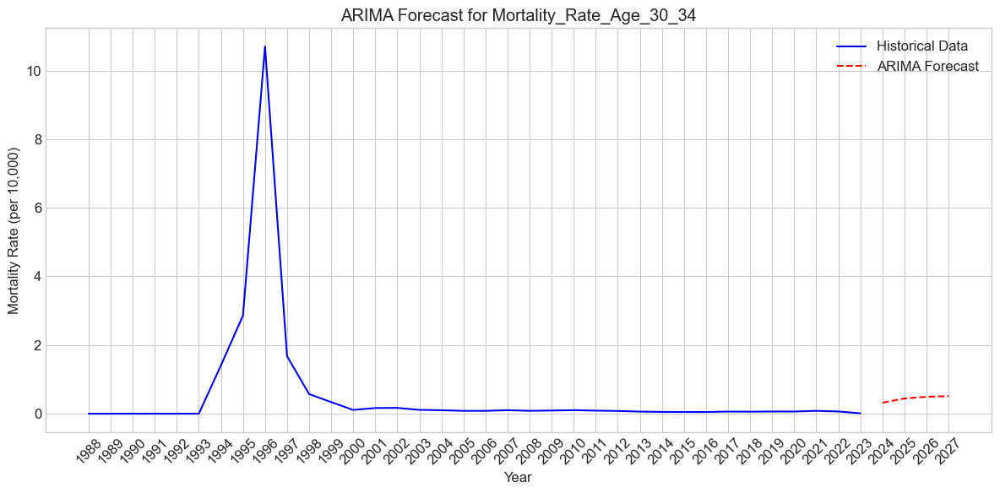

    Year  Mortality_Rate_Age_30_34
35  2023                  0.011524
0   2024                  0.321364
1   2025                  0.443951
2   2026                  0.492452
3   2027                  0.511641

Forecasting for Mortality_Rate_Age_35_39:
Processing Mortality_Rate_Age_35_39...
Using ARIMA parameters: (1,1,1)
Fitting ARIMA model...
Forecasting next 4 years...


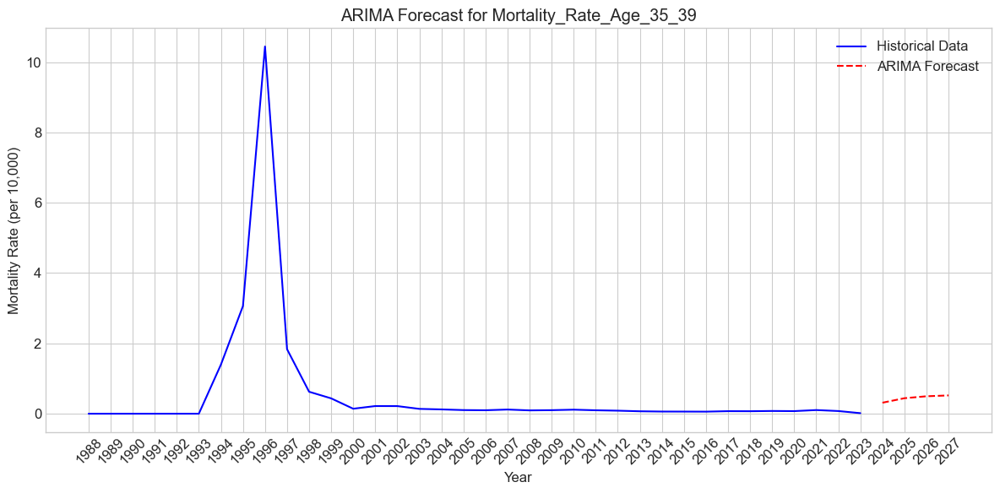

    Year  Mortality_Rate_Age_35_39
35  2023                  0.015470
0   2024                  0.312530
1   2025                  0.440773
2   2026                  0.496136
3   2027                  0.520037

Forecasting for Mortality_Rate_Age_40_44:
Processing Mortality_Rate_Age_40_44...
Using ARIMA parameters: (1,1,1)
Fitting ARIMA model...
Forecasting next 4 years...


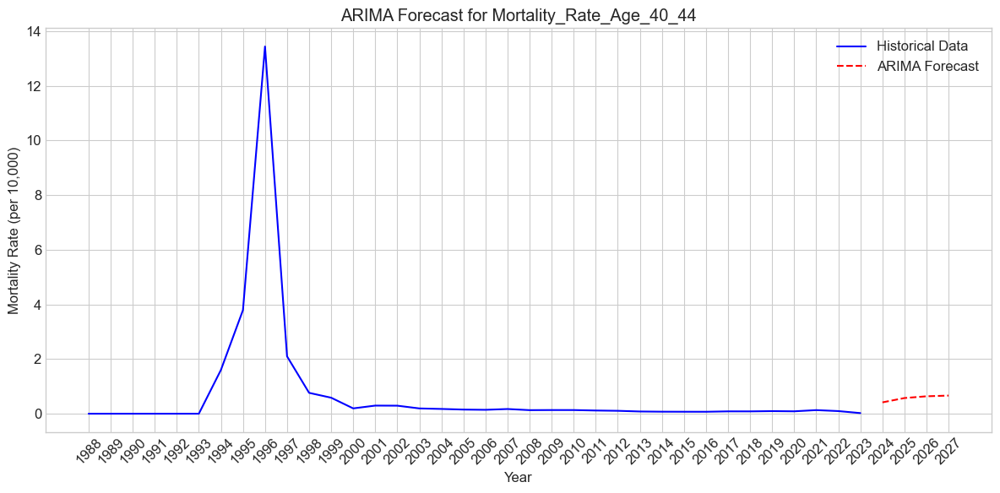

    Year  Mortality_Rate_Age_40_44
35  2023                  0.022644
0   2024                  0.414859
1   2025                  0.573346
2   2026                  0.637387
3   2027                  0.663264

Forecasting for Mortality_Rate_Age_45_49:
Processing Mortality_Rate_Age_45_49...
Using ARIMA parameters: (1,1,1)
Fitting ARIMA model...
Forecasting next 4 years...


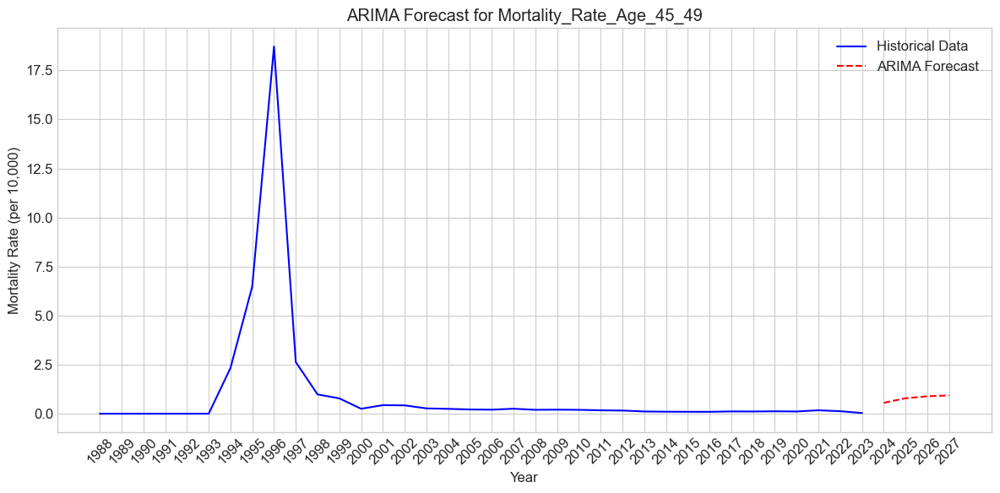

    Year  Mortality_Rate_Age_45_49
35  2023                  0.035193
0   2024                  0.556507
1   2025                  0.786612
2   2026                  0.888178
3   2027                  0.933009

Forecasting for Mortality_Rate_Age_50_54:
Processing Mortality_Rate_Age_50_54...
Using ARIMA parameters: (1,1,1)
Fitting ARIMA model...
Forecasting next 4 years...


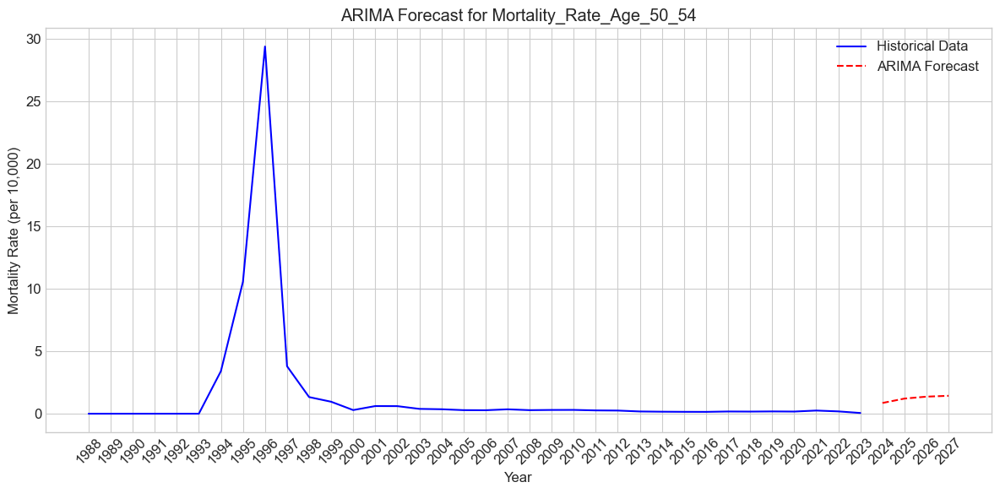

    Year  Mortality_Rate_Age_50_54
35  2023                  0.058225
0   2024                  0.858116
1   2025                  1.210466
2   2026                  1.365676
3   2027                  1.434045

Forecasting for Mortality_Rate_Age_55_59:
Processing Mortality_Rate_Age_55_59...
Using ARIMA parameters: (1,1,1)
Fitting ARIMA model...
Forecasting next 4 years...


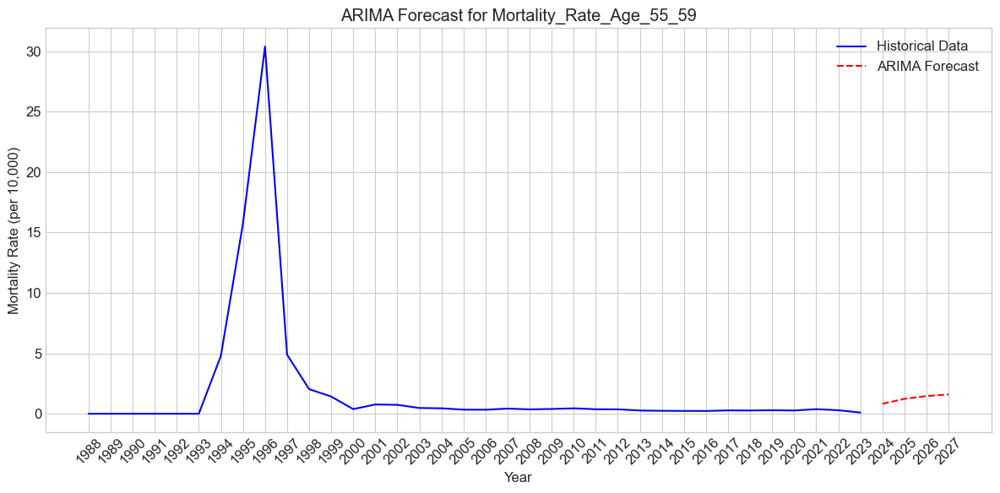

    Year  Mortality_Rate_Age_55_59
35  2023                  0.095043
0   2024                  0.819992
1   2025                  1.229605
2   2026                  1.461046
3   2027                  1.591816

Forecasting for Mortality_Rate_Age_60_64:
Processing Mortality_Rate_Age_60_64...
Using ARIMA parameters: (1,1,1)
Fitting ARIMA model...
Forecasting next 4 years...


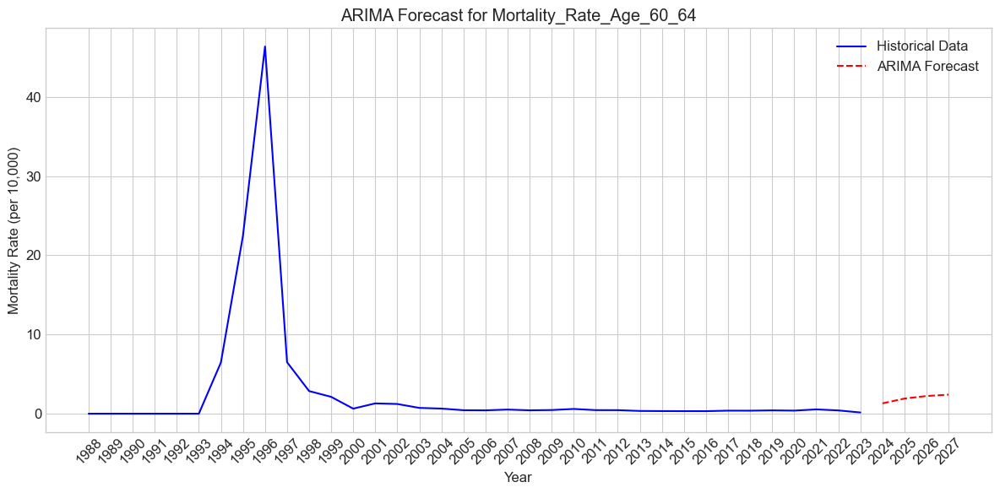

    Year  Mortality_Rate_Age_60_64
35  2023                  0.155852
0   2024                  1.302901
1   2025                  1.910677
2   2026                  2.232714
3   2027                  2.403348

Forecasting for Mortality_Rate_Age_65_69:
Processing Mortality_Rate_Age_65_69...
Using ARIMA parameters: (1,1,1)
Fitting ARIMA model...
Forecasting next 4 years...


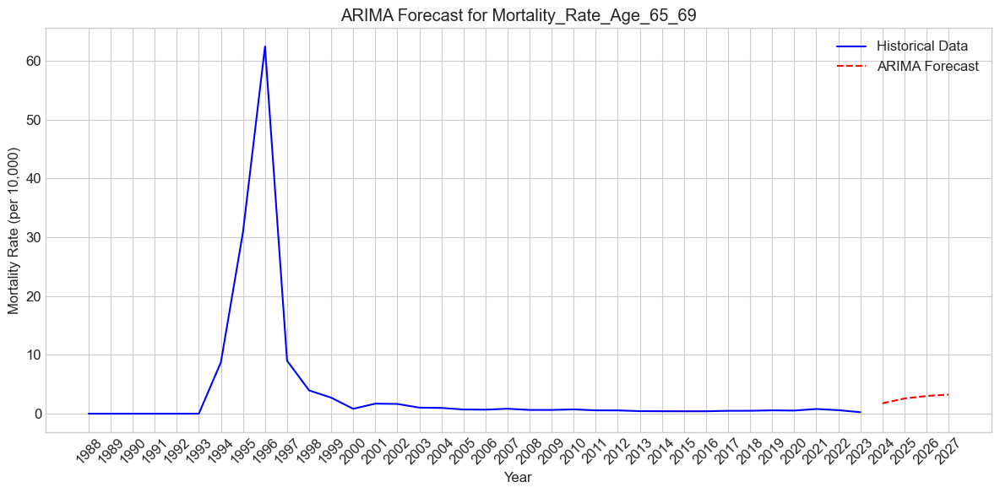

    Year  Mortality_Rate_Age_65_69
35  2023                  0.254787
0   2024                  1.765947
1   2025                  2.578578
2   2026                  3.015573
3   2027                  3.250568

Forecasting for Mortality_Rate_Age_70_74:
Processing Mortality_Rate_Age_70_74...
Using ARIMA parameters: (1,1,1)
Fitting ARIMA model...
Forecasting next 4 years...


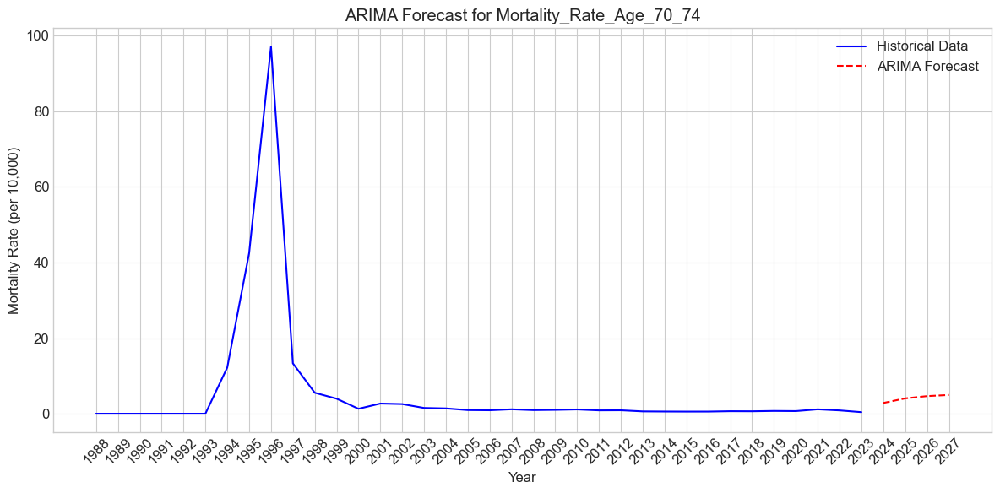

    Year  Mortality_Rate_Age_70_74
35  2023                  0.412803
0   2024                  2.845475
1   2025                  4.058302
2   2026                  4.662966
3   2027                  4.964426

Forecasting for Mortality_Rate_Age_75_79:
Processing Mortality_Rate_Age_75_79...
Using ARIMA parameters: (1,1,1)
Fitting ARIMA model...
Forecasting next 4 years...


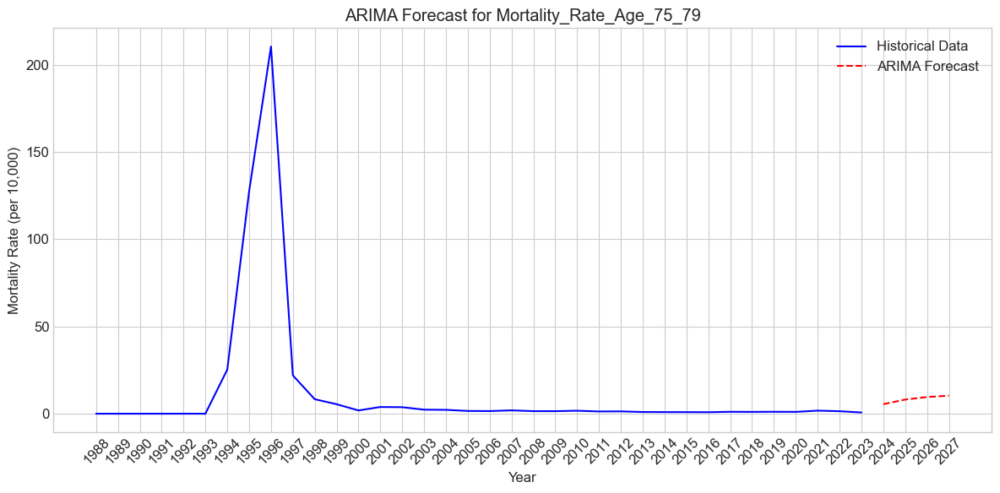

    Year  Mortality_Rate_Age_75_79
35  2023                  0.701599
0   2024                  5.470813
1   2025                  8.105166
2   2026                  9.560295
3   2027                 10.364059

Forecasting for Mortality_Rate_Age_80_84:
Processing Mortality_Rate_Age_80_84...
Using ARIMA parameters: (1,1,1)
Fitting ARIMA model...
Forecasting next 4 years...


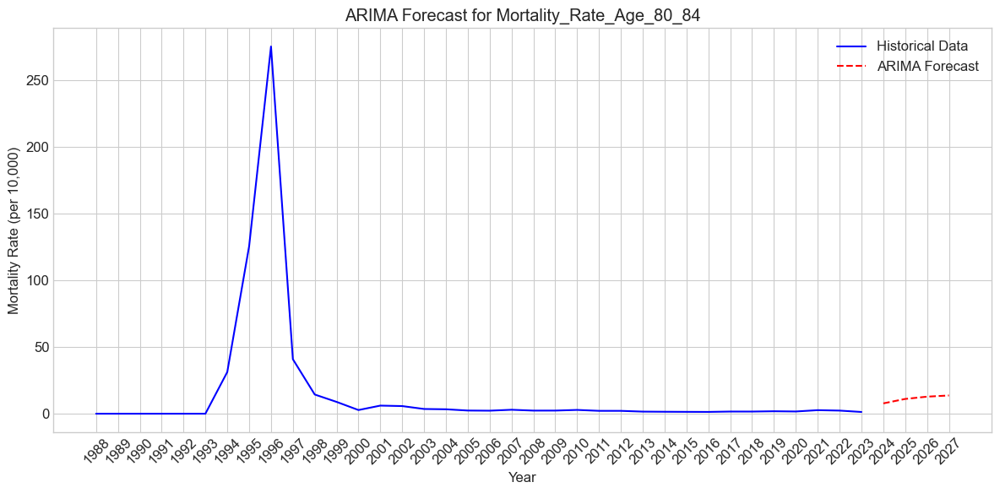

    Year  Mortality_Rate_Age_80_84
35  2023                  1.303298
0   2024                  7.737580
1   2025                 11.058964
2   2026                 12.773466
3   2027                 13.658494

Forecasting for Mortality_Rate_Age_85_89:
Processing Mortality_Rate_Age_85_89...
Using ARIMA parameters: (1,1,1)
Fitting ARIMA model...
Forecasting next 4 years...


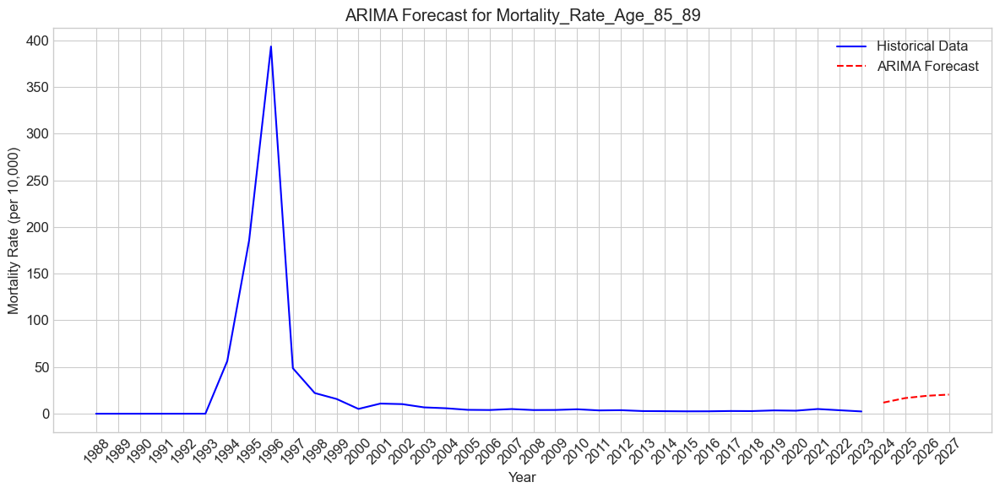

    Year  Mortality_Rate_Age_85_89
35  2023                  2.423103
0   2024                 11.885255
1   2025                 16.724906
2   2026                 19.200264
3   2027                 20.466347

Forecasting for Mortality_Rate_Age_90_94:
Processing Mortality_Rate_Age_90_94...
Using ARIMA parameters: (1,1,1)
Fitting ARIMA model...
Forecasting next 4 years...


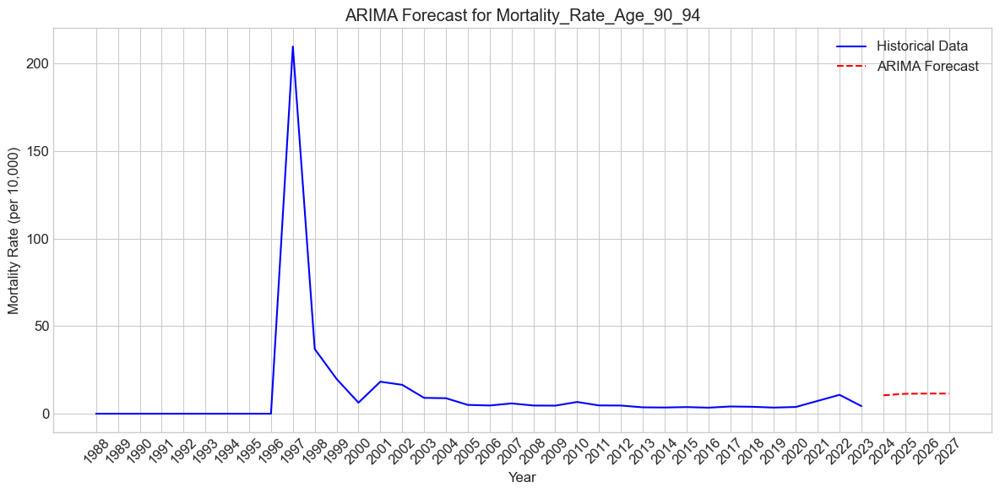

    Year  Mortality_Rate_Age_90_94
35  2023                  4.324919
0   2024                 10.509758
1   2025                 11.388335
2   2026                 11.513139
3   2027                 11.530868

Forecasting for Mortality_Rate_Age_95_plus:
Processing Mortality_Rate_Age_95_plus...
Using ARIMA parameters: (1,1,1)
Fitting ARIMA model...
Forecasting next 4 years...


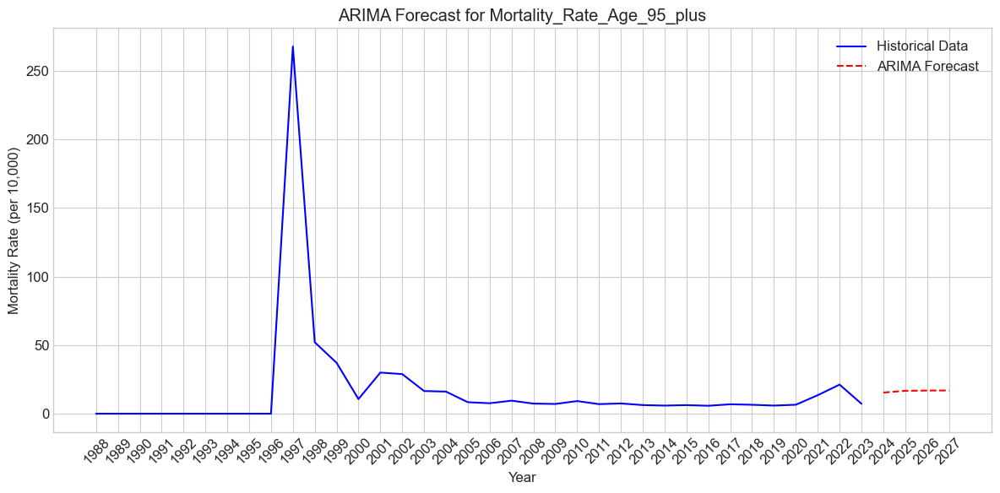

    Year  Mortality_Rate_Age_95_plus
35  2023                    7.290499
0   2024                   15.417283
1   2025                   16.702882
2   2026                   16.906255
3   2027                   16.938427

Forecasting for Mortality_Rate_Age_Unspecified:
Processing Mortality_Rate_Age_Unspecified...
Using ARIMA parameters: (1,1,1)
Fitting ARIMA model...
Forecasting next 4 years...


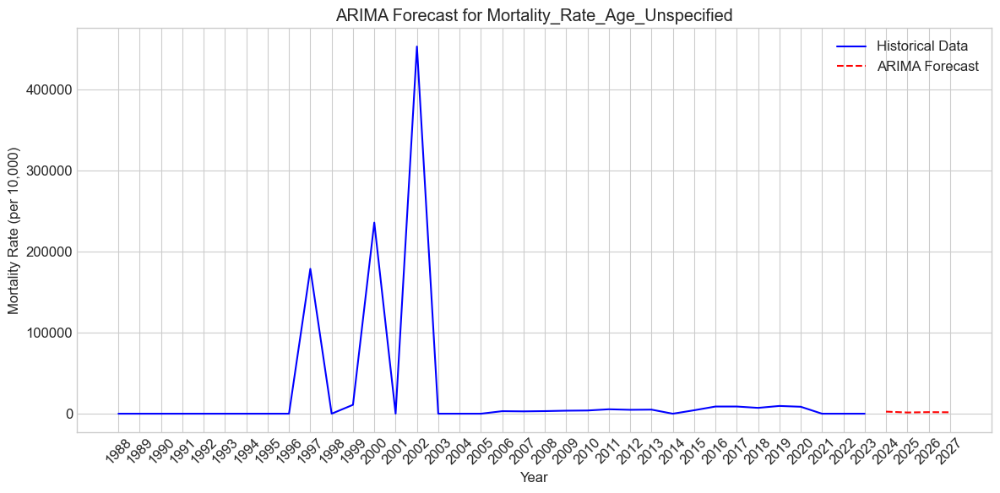

    Year  Mortality_Rate_Age_Unspecified
35  2023                        0.000000
0   2024                     2559.631550
1   2025                     1510.233654
2   2026                     1940.465866
3   2027                     1764.079238

Summary of Mortality Rate Forecasts for Next 4 Years (per 10,000):
   Year  Mortality_Rate_All_Ages  Mortality_Rate_Age_0  Mortality_Rate_Age_1  \
0  2024                 0.865064              3.923796              0.403994   
1  2025                 1.246045              4.704917              0.523234   
2  2026                 1.440298              4.864759              0.559442   
3  2027                 1.539343              4.897468              0.570436   

   Mortality_Rate_Age_2  Mortality_Rate_Age_3  Mortality_Rate_Age_4  \
0              0.163269              0.099017              0.075501   
1              0.213411              0.133623              0.104014   
2              0.229598              0.146577              0.115615   
3

In [28]:
# Function to calculate mortality rate per 10,000 population
def calculate_mortality_rate(df):
    # List of death and population column pairs
    column_pairs = [
        ('Deaths_All_Ages', 'Pop_All_Ages'),
        ('Deaths_Age_0', 'Pop_Age_0'),
        ('Deaths_Age_1', 'Pop_Age_1'),
        ('Deaths_Age_2', 'Pop_Age_2'),
        ('Deaths_Age_3', 'Pop_Age_3'),
        ('Deaths_Age_4', 'Pop_Age_4'),
        ('Deaths_Age_5_9', 'Pop_Age_5_9'),
        ('Deaths_Age_10_14', 'Pop_Age_10_14'),
        ('Deaths_Age_15_19', 'Pop_Age_15_19'),
        ('Deaths_Age_20_24', 'Pop_Age_20_24'),
        ('Deaths_Age_25_29', 'Pop_Age_25_29'),
        ('Deaths_Age_30_34', 'Pop_Age_30_34'),
        ('Deaths_Age_35_39', 'Pop_Age_35_39'),
        ('Deaths_Age_40_44', 'Pop_Age_40_44'),
        ('Deaths_Age_45_49', 'Pop_Age_45_49'),
        ('Deaths_Age_50_54', 'Pop_Age_50_54'),
        ('Deaths_Age_55_59', 'Pop_Age_55_59'),
        ('Deaths_Age_60_64', 'Pop_Age_60_64'),
        ('Deaths_Age_65_69', 'Pop_Age_65_69'),
        ('Deaths_Age_70_74', 'Pop_Age_70_74'),
        ('Deaths_Age_75_79', 'Pop_Age_75_79'),
        ('Deaths_Age_80_84', 'Pop_Age_80_84'),
        ('Deaths_Age_85_89', 'Pop_Age_85_89'),
        ('Deaths_Age_90_94', 'Pop_Age_90_94'),
        ('Deaths_Age_95_plus', 'Pop_Age_95_plus'),
        ('Deaths_Age_Unspecified', 'Pop_Age_Unspecified')
    ]
    
    # Group by year to get total deaths and population for each year
    yearly_data = df.groupby('Year')
    
    # Create a list to hold the yearly mortality rates
    mortality_rates = []
    
    # For each year's data
    for year, year_group in yearly_data:
        year_data = {'Year': year}
        
        # Calculate mortality rate for each age group (per 10,000 population)
        for death_col, pop_col in column_pairs:
            # Sum deaths and population for this year and age group
            total_deaths = year_group[death_col].sum()
            total_pop = year_group[pop_col].sum()
            
            # Create mortality rate column name
            rate_col = death_col.replace('Deaths', 'Mortality_Rate')
            
            # Calculate mortality rate per 10,000 population
            # Handle division by zero
            if total_pop > 0:
                year_data[rate_col] = (total_deaths / total_pop) * 10000
            else:
                year_data[rate_col] = 0
        
        mortality_rates.append(year_data)
    
    # Convert to DataFrame
    df_rates = pd.DataFrame(mortality_rates)
    
    return df_rates

# Function to forecast using ARIMA
def forecast_arima(df, column_name, years_to_forecast=4, plot=True):
    print(f"Processing {column_name}...")
    
    # The data is already grouped by year from the calculate_mortality_rate function
    data = df[['Year', column_name]].copy()
    data = data.set_index('Year')
    
    # Extract time series
    timeseries = data[column_name].values
    
    # Use simple ARIMA parameters
    p, d, q = 1, 1, 1
    print(f"Using ARIMA parameters: ({p},{d},{q})")
    
    # Fit ARIMA model
    print(f"Fitting ARIMA model...")
    model = ARIMA(timeseries, order=(p, d, q))
    results = model.fit()
    
    # Forecast
    print(f"Forecasting next {years_to_forecast} years...")
    forecast_values = results.forecast(steps=years_to_forecast)
    
    # Convert negative forecasts to zero (mortality rates can't be negative)
    forecast_values = np.maximum(forecast_values, 0)
    
    # Create years for forecasted values
    last_year = data.index.max()
    forecast_years = np.arange(last_year + 1, last_year + years_to_forecast + 1)
    
    # Creating a dataframe with actual and forecasted values
    actual_df = data.reset_index()
    forecast_df = pd.DataFrame({
        'Year': forecast_years, 
        column_name: forecast_values
    })
    
    result_df = pd.concat([actual_df, forecast_df])
    
    if plot:
        plt.figure(figsize=(12, 6))
        plt.plot(data.index, data[column_name], 'b-', label='Historical Data')
        plt.plot(forecast_years, forecast_values, 'r--', label='ARIMA Forecast')
        plt.title(f'ARIMA Forecast for {column_name}')
        plt.xlabel('Year')
        plt.ylabel('Mortality Rate (per 10,000)')
        plt.legend()
        plt.grid(True)
        plt.xticks(result_df['Year'], rotation=45)
        plt.tight_layout()
        plt.show()
    
    return result_df, results

def main():
    
    # First, calculate mortality rates per 10,000 population by grouping by year
    print("Calculating mortality rates by grouping data by year...")
    try:
        mortality_df = calculate_mortality_rate(all_parts_with_country)
        
        # List of mortality rate columns to forecast
        mortality_columns = [
            'Mortality_Rate_All_Ages', 'Mortality_Rate_Age_0', 'Mortality_Rate_Age_1', 
            'Mortality_Rate_Age_2', 'Mortality_Rate_Age_3', 'Mortality_Rate_Age_4', 
            'Mortality_Rate_Age_5_9', 'Mortality_Rate_Age_10_14', 'Mortality_Rate_Age_15_19', 
            'Mortality_Rate_Age_20_24', 'Mortality_Rate_Age_25_29', 'Mortality_Rate_Age_30_34', 
            'Mortality_Rate_Age_35_39', 'Mortality_Rate_Age_40_44', 'Mortality_Rate_Age_45_49', 
            'Mortality_Rate_Age_50_54', 'Mortality_Rate_Age_55_59', 'Mortality_Rate_Age_60_64', 
            'Mortality_Rate_Age_65_69', 'Mortality_Rate_Age_70_74', 'Mortality_Rate_Age_75_79', 
            'Mortality_Rate_Age_80_84', 'Mortality_Rate_Age_85_89', 'Mortality_Rate_Age_90_94', 
            'Mortality_Rate_Age_95_plus', 'Mortality_Rate_Age_Unspecified'
        ]
        
        # Dictionary to store forecasts
        forecasts = {}
        models = {}
        
        # Forecast for all ages combined
        print("\nForecasting for Mortality_Rate_All_Ages:")
        try:
            forecasts['Mortality_Rate_All_Ages'], models['Mortality_Rate_All_Ages'] = forecast_arima(
                mortality_df, 'Mortality_Rate_All_Ages')
            print(forecasts['Mortality_Rate_All_Ages'].tail())
        except Exception as e:
            print(f"Error forecasting Mortality_Rate_All_Ages: {e}")
        
        # Forecast for each age group
        for rate_col in mortality_columns[1:]:  # Skip Mortality_Rate_All_Ages as we already did it
            try:
                print(f"\nForecasting for {rate_col}:")
                forecasts[rate_col], models[rate_col] = forecast_arima(mortality_df, rate_col)
                print(forecasts[rate_col].tail())
            except Exception as e:
                print(f"Error forecasting {rate_col}: {e}")
        
        # Create a summary dataframe with forecasts for all age groups
        last_year = mortality_df['Year'].max()
        forecast_years = range(last_year + 1, last_year + 5)  # 4 years forecast
        
        summary = pd.DataFrame({
            'Year': list(forecast_years)
        })
        
        for col in mortality_columns:
            if col in forecasts:
                forecast_values = forecasts[col][forecasts[col]['Year'].isin(forecast_years)][col].values
                if len(forecast_values) == len(forecast_years):
                    summary[col] = forecast_values
                else:
                    print(f"Warning: Forecast values for {col} don't match expected years")
        
        print("\nSummary of Mortality Rate Forecasts for Next 4 Years (per 10,000):")
        print(summary)
        
        return forecasts, models, summary, mortality_df
    
    except Exception as e:
        print(f"An error occurred in the main function: {e}")
        raise

# Run the forecasting
if __name__ == "__main__":
    try:
        forecasts, models, summary, mortality_df = main()
    except Exception as e:
        print(f"An error occurred: {e}")

# K-Means Clustering

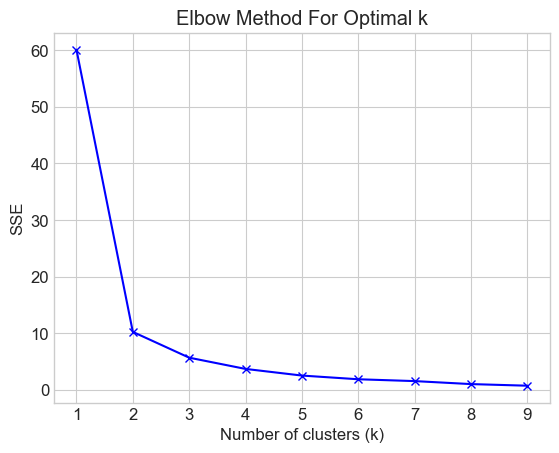

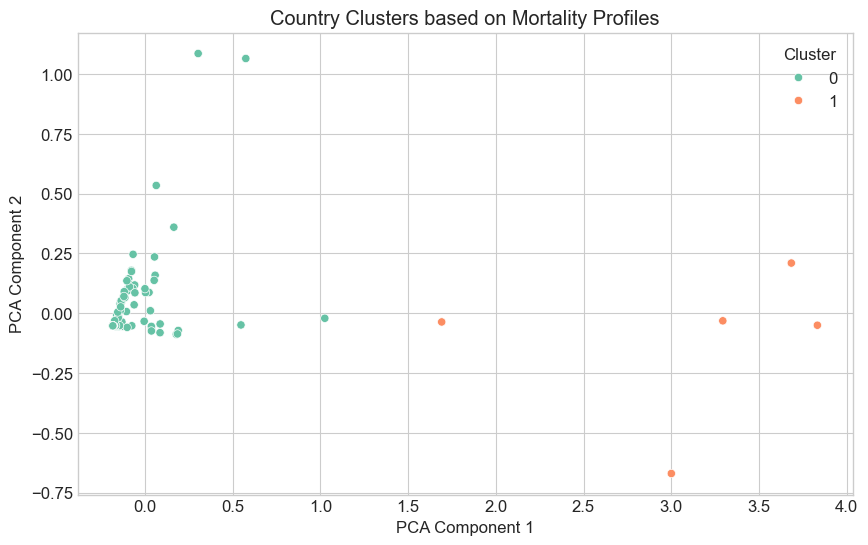

     Country  Cluster  Mortality_All_Ages  Mortality_Age_0  Mortality_Age_1  \
0       1030        0            0.000000         0.000000         0.000000   
1       1060        0            0.000000         0.000000         0.000000   
2       1125        0            0.062022         0.189761         0.019578   
3       1250        0            0.126749         0.937982         0.045856   
4       1300        0            0.050428         0.071097         0.004303   
..       ...      ...                 ...              ...              ...   
141     5105        0            0.000000         0.000000         0.000000   
142     5108        0            0.000000         0.000000         0.000000   
143     5150        0            0.000000         0.000000         0.000000   
144     5195        0            0.000000         0.000000         0.000000   
145     5198        0            0.000000         0.000000         0.000000   

     Mortality_Age_2  Mortality_Age_3  
0          

In [29]:

# Drop irrelevant columns
drop_cols = ['Admin1', 'SubDiv', 'List', 'SubDiv', 'name']
df = all_parts_with_country.drop(columns=drop_cols)

# Define death and population column pairs
death_cols = [col for col in df.columns if col.startswith('Deaths_')]
pop_cols = [col for col in df.columns if col.startswith('Pop_')]
rate_cols = ['Mortality_' + col.split('_', 1)[1] for col in death_cols]

# Aggregate by country and year
agg_df = df.groupby(['Country', 'Year'])[death_cols + pop_cols].sum().reset_index()

# Calculate age-specific mortality rates
for death_col, pop_col, rate_col in zip(death_cols, pop_cols, rate_cols):
    agg_df[rate_col] = np.where(
        agg_df[pop_col] > 0,
        (agg_df[death_col] / agg_df[pop_col]) * 10000,
        0
    )

# Aggregate mortality rates across years (mean per country)
country_rates = agg_df.groupby('Country')[rate_cols].mean().reset_index()

# Normalize features
features = country_rates.drop(columns='Country')
scaler = MinMaxScaler()
scaled_features = scaler.fit_transform(features)

# Optional: Dimensionality reduction
pca = PCA(n_components=2)
pca_features = pca.fit_transform(scaled_features)

# Determine optimal k (elbow method)
sse = []
K_range = range(1, 10)
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(pca_features)
    sse.append(kmeans.inertia_)

plt.plot(K_range, sse, 'bx-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('SSE')
plt.title('Elbow Method For Optimal k')
plt.grid(True)
plt.show()

# Apply final K-means
optimal_k = 2
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
country_rates['Cluster'] = kmeans.fit_predict(pca_features)

# Visualize clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_features[:, 0], y=pca_features[:, 1],
                hue=country_rates['Cluster'], palette='Set2')
plt.title('Country Clusters based on Mortality Profiles')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

# Output the result
print(country_rates[['Country', 'Cluster'] + rate_cols[:5]])  # Show top few rates for inspection




# Clustering results

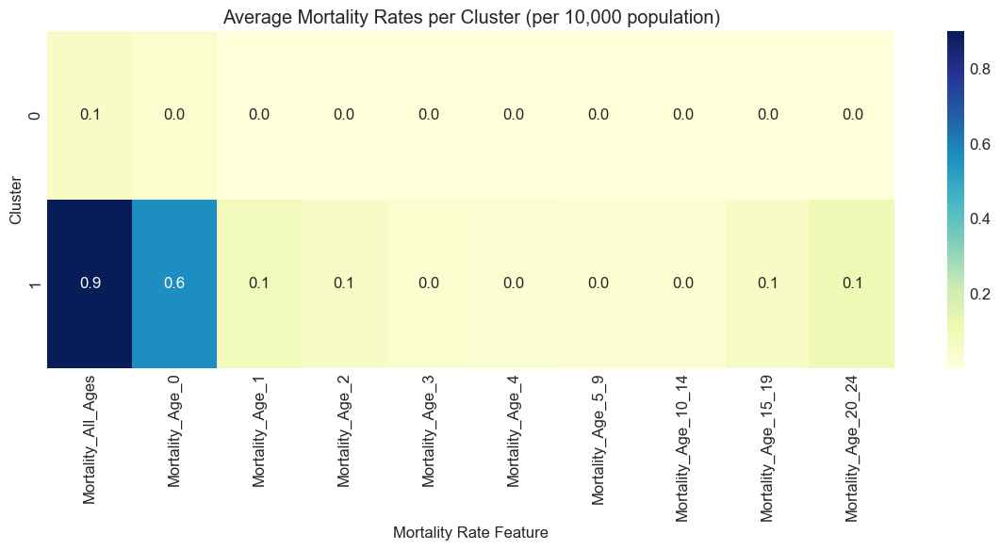

In [30]:
# 1. Merge cluster labels back to the original data
df_with_clusters = all_parts_with_country.merge(
    country_rates[['Country', 'Cluster']],
    on='Country',
    how='left'  # Use 'left' to keep all original rows
)

# 2. Visualization: average mortality by cluster
death_cols = [col for col in df_with_clusters.columns if col.startswith('Deaths_')]
pop_cols = [col for col in df_with_clusters.columns if col.startswith('Pop_')]
rate_cols = ['Mortality_' + col.split('_', 1)[1] for col in death_cols]

# Recompute rates if needed
for death_col, pop_col, rate_col in zip(death_cols, pop_cols, rate_cols):
    if rate_col not in df_with_clusters.columns:
        df_with_clusters[rate_col] = np.where(
            df_with_clusters[pop_col] > 0,
            (df_with_clusters[death_col] / df_with_clusters[pop_col]) * 10000,
            0
        )

# 3. Compute average mortality by cluster
cluster_summary = df_with_clusters.groupby('Cluster')[rate_cols].mean().reset_index()


# Example: heatmap of top 10 mortality features
top_rates = cluster_summary.set_index('Cluster')[rate_cols[:10]]

plt.figure(figsize=(12, 6))
sns.heatmap(top_rates, annot=True, fmt=".1f", cmap="YlGnBu")
plt.title("Average Mortality Rates per Cluster (per 10,000 population)")
plt.xlabel("Mortality Rate Feature")
plt.ylabel("Cluster")
plt.tight_layout()
plt.show()


In [31]:
all_parts_with_country.columns

Index(['Country', 'Admin1', 'SubDiv', 'Year', 'List', 'Cause', 'Sex', 'Frmat',
       'IM_Frmat', 'Deaths_All_Ages', 'Deaths_Age_0', 'Deaths_Age_1',
       'Deaths_Age_2', 'Deaths_Age_3', 'Deaths_Age_4', 'Deaths_Age_5_9',
       'Deaths_Age_10_14', 'Deaths_Age_15_19', 'Deaths_Age_20_24',
       'Deaths_Age_25_29', 'Deaths_Age_30_34', 'Deaths_Age_35_39',
       'Deaths_Age_40_44', 'Deaths_Age_45_49', 'Deaths_Age_50_54',
       'Deaths_Age_55_59', 'Deaths_Age_60_64', 'Deaths_Age_65_69',
       'Deaths_Age_70_74', 'Deaths_Age_75_79', 'Deaths_Age_80_84',
       'Deaths_Age_85_89', 'Deaths_Age_90_94', 'Deaths_Age_95_plus',
       'Deaths_Age_Unspecified', 'Infant_Deaths_0_day',
       'Infant_Deaths_1_6_days', 'Infant_Deaths_7_27_days',
       'Infant_Deaths_28_364_days', 'country', 'name', 'Pop_All_Ages',
       'Pop_Age_0', 'Pop_Age_1', 'Pop_Age_2', 'Pop_Age_3', 'Pop_Age_4',
       'Pop_Age_5_9', 'Pop_Age_10_14', 'Pop_Age_15_19', 'Pop_Age_20_24',
       'Pop_Age_25_29', 'Pop_Age_30_34', '

In [32]:
# Using the 'name' column for mapping countries
unique_countries = df_with_clusters[['name', 'Cluster']].drop_duplicates()

# Create the map
fig = px.choropleth(
    unique_countries,
    locations='name',            
    locationmode='country names',  
    color='Cluster',               # Color by cluster
    color_discrete_sequence=['#1f77b4', '#ff7f0e'],  # Blue and orange for the two clusters
    title='Country Clusters',
    labels={'Cluster': 'Cluster Group'}
)

# Improve layout
fig.update_layout(
    geo=dict(
        showframe=False,
        showcoastlines=True,
    )
)

# Display the map
fig.show()

# Save as PNG file to desktop
fig.write_image("/Users/sujangauchan/Desktop/country_clusters_map.png")



# Big Data Analysis Using Apache Spark

In [48]:
# Initialize Spark Session with optimized configuration
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, lit, create_map, when, sum as sum_, lag, count, desc
from pyspark.sql.types import IntegerType, StringType
from pyspark.sql.window import Window
from itertools import chain
from functools import reduce

spark = SparkSession.builder \
    .appName("WHO Mortality Data Analysis") \
    .config("spark.driver.memory", "8g") \
    .config("spark.executor.memory", "4g") \
    .config("spark.dynamicAllocation.enabled", "true") \
    .config("spark.sql.shuffle.partitions", "200") \
    .config("spark.sql.debug.maxToStringFields", "1000") \
    .getOrCreate()

spark.conf.set("spark.sql.execution.arrow.pyspark.enabled", "true")

# ========== DATA LOADING ========== #
print("Loading mortality data parts...")
parts = [
    spark.read.csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part1.csv", header=True, inferSchema=True),
    spark.read.csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part2.csv", header=True, inferSchema=True),
    spark.read.csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part3.csv", header=True, inferSchema=True),
    spark.read.csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part4.csv", header=True, inferSchema=True),
    spark.read.csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part5.csv", header=True, inferSchema=True),
    spark.read.csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part6.csv", header=True, inferSchema=True)
]

# Combine all parts
print("Merging data parts...")
df = parts[0]
for part in parts[1:]:
    df = df.union(part)

# Load country codes
print("Loading country codes...")
country_codes = spark.read.csv(
    "/Users/sujangauchan/Desktop/Mortality data/country_codes.csv", 
    header=True, 
    inferSchema=True
)

# Join with country names
df = df.join(
    country_codes.select("Country", "name"),
    "Country",
    "left"
)

# Load population data
print("Loading population data...")
population = spark.read.csv(
    "/Users/sujangauchan/Desktop/Mortality data/pop.csv", 
    header=True, 
    inferSchema=True
)

# Merge population data
join_keys = ['Country', 'Admin1', 'SubDiv', 'Year', 'Sex', 'Frmat']
df = df.join(population, join_keys, "left")

# ========== DATA TRANSFORMATION ========== #
# Rename columns for clarity
print("Renaming columns...")
column_mappings = [
    # Death columns
    ("Deaths1", "Deaths_All_Ages"),
    ("Deaths2", "Deaths_Age_0"),
    ("Deaths3", "Deaths_Age_1"),
    ("Deaths4", "Deaths_Age_2"),
    ("Deaths5", "Deaths_Age_3"),
    ("Deaths6", "Deaths_Age_4"),
    ("Deaths7", "Deaths_Age_5_9"),
    ("Deaths8", "Deaths_Age_10_14"),
    ("Deaths9", "Deaths_Age_15_19"),
    ("Deaths10", "Deaths_Age_20_24"),
    ("Deaths11", "Deaths_Age_25_29"),
    ("Deaths12", "Deaths_Age_30_34"),
    ("Deaths13", "Deaths_Age_35_39"),
    ("Deaths14", "Deaths_Age_40_44"),
    ("Deaths15", "Deaths_Age_45_49"),
    ("Deaths16", "Deaths_Age_50_54"),
    ("Deaths17", "Deaths_Age_55_59"),
    ("Deaths18", "Deaths_Age_60_64"),
    ("Deaths19", "Deaths_Age_65_69"),
    ("Deaths20", "Deaths_Age_70_74"),
    ("Deaths21", "Deaths_Age_75_79"),
    ("Deaths22", "Deaths_Age_80_84"),
    ("Deaths23", "Deaths_Age_85_89"),
    ("Deaths24", "Deaths_Age_90_94"),
    ("Deaths25", "Deaths_Age_95_plus"),
    ("Deaths26", "Deaths_Age_Unspecified"),
    ("IM_Deaths1", "Infant_Deaths_0_day"),
    ("IM_Deaths2", "Infant_Deaths_1_6_days"),
    ("IM_Deaths3", "Infant_Deaths_7_27_days"),
    ("IM_Deaths4", "Infant_Deaths_28_364_days"),
    
    # Population columns
    ("Pop1", "Pop_All_Ages"),
    ("Pop2", "Pop_Age_0"),
    ("Pop3", "Pop_Age_1"),
    ("Pop4", "Pop_Age_2"),
    ("Pop5", "Pop_Age_3"),
    ("Pop6", "Pop_Age_4"),
    ("Pop7", "Pop_Age_5_9"),
    ("Pop8", "Pop_Age_10_14"),
    ("Pop9", "Pop_Age_15_19"),
    ("Pop10", "Pop_Age_20_24"),
    ("Pop11", "Pop_Age_25_29"),
    ("Pop12", "Pop_Age_30_34"),
    ("Pop13", "Pop_Age_35_39"),
    ("Pop14", "Pop_Age_40_44"),
    ("Pop15", "Pop_Age_45_49"),
    ("Pop16", "Pop_Age_50_54"),
    ("Pop17", "Pop_Age_55_59"),
    ("Pop18", "Pop_Age_60_64"),
    ("Pop19", "Pop_Age_65_69"),
    ("Pop20", "Pop_Age_70_74"),
    ("Pop21", "Pop_Age_75_79"),
    ("Pop22", "Pop_Age_80_84"),
    ("Pop23", "Pop_Age_85_89"),
    ("Pop24", "Pop_Age_90_94"),
    ("Pop25", "Pop_Age_95_plus"),
    ("Pop26", "Pop_Age_Unspecified")
]

for old_name, new_name in column_mappings:
    if old_name in df.columns:
        df = df.withColumnRenamed(old_name, new_name)

# Add region information
print("Adding region data...")
region_mapping = {
    (2070, 901): "North and North-East",
    (2070, 902): "South, South-East and Central West",
    (2350, 901): "Former Canal Zone",
    (3150, 901): "Jewish Population"
}

region_expr = None
for (country, admin), region in region_mapping.items():
    cond = (col("Country") == country) & (col("Admin1") == admin)
    if region_expr is None:
        region_expr = when(cond, lit(region))
    else:
        region_expr = region_expr.when(cond, lit(region))

df = df.withColumn("Region", region_expr.otherwise(lit(None)))

# Add continent information
print("Mapping countries to continents...")
continent_map = {
    'Algeria': 'Africa', 'Angola': 'Africa', 'Benin': 'Africa', 'Botswana': 'Africa', 
    'Burkina Faso': 'Africa', 'Burundi': 'Africa', 'Cameroon': 'Africa', 'Cape Verde': 'Africa', 
    'Central African Republic': 'Africa', 'Chad': 'Africa', 'Comoros': 'Africa', 'Congo': 'Africa', 
    "Cote d'Ivoire": 'Africa', 'Djibouti': 'Africa', 'Egypt': 'Africa', 'Equatorial Guinea': 'Africa', 
    'Eritrea': 'Africa', 'Ethiopia': 'Africa', 'Gabon': 'Africa', 'Gambia': 'Africa', 
    'Ghana': 'Africa', 'Guinea': 'Africa', 'Guinea-Bissau': 'Africa', 'Kenya': 'Africa', 
    'Lesotho': 'Africa', 'Liberia': 'Africa', 'Libyan Arab Jamahiriya': 'Africa', 
    'Madagascar': 'Africa', 'Malawi': 'Africa', 'Mali': 'Africa', 'Mauritania': 'Africa', 
    'Mauritius': 'Africa', 'Mayotte': 'Africa', 'Morocco': 'Africa', 'Mozambique': 'Africa', 
    'Namibia': 'Africa', 'Niger': 'Africa', 'Nigeria': 'Africa', 'Reunion': 'Africa', 
    'Rodrigues': 'Africa', 'Rwanda': 'Africa', 'Sao Tome and Principe': 'Africa', 
    'Senegal': 'Africa', 'Seychelles': 'Africa', 'Sierra Leone': 'Africa', 'Somalia': 'Africa', 
    'South Africa': 'Africa', 'South Sudan': 'Africa', 'Sudan': 'Africa', 'Sudan, Former': 'Africa', 
    'Swaziland': 'Africa', 'Togo': 'Africa', 'Tunisia': 'Africa', 'Uganda': 'Africa', 
    'United Republic of Tanzania': 'Africa', 'Democratic Republic of the Congo': 'Africa', 
    'Zambia': 'Africa', 'Zimbabwe': 'Africa',
    'Anguilla': 'North America', 'Antigua and Barbuda': 'North America', 'Aruba': 'North America', 
    'Bahamas': 'North America', 'Barbados': 'North America', 'Belize': 'North America', 
    'Bermuda': 'North America', 'British Virgin Islands': 'North America', 
    'Canada': 'North America', 'Cayman Islands': 'North America', 'Costa Rica': 'North America', 
    'Cuba': 'North America', 'Dominica': 'North America', 'Dominican Republic': 'North America', 
    'El Salvador': 'North America', 'Grenada': 'North America', 'Guadeloupe': 'North America', 
    'Guatemala': 'North America', 'Haiti': 'North America', 'Honduras': 'North America', 
    'Jamaica': 'North America', 'Martinique': 'North America', 'Mexico': 'North America', 
    'Montserrat': 'North America', 'Netherlands Antilles': 'North America', 
    'Nicaragua': 'North America', 'Panama': 'North America', 'Puerto Rico': 'North America', 
    'Saint Kitts and Nevis': 'North America', 'Saint Lucia': 'North America', 
    'Saint Pierre and Miquelon': 'North America', 'Saint Vincent and Grenadines': 'North America', 
    'Trinidad and Tobago': 'North America', 'Turks and Caicos Islands': 'North America', 
    'United States of America': 'North America', 'Virgin Islands (USA)': 'North America',
    'Argentina': 'South America', 'Bolivia': 'South America', 'Brazil': 'South America', 
    'Chile': 'South America', 'Colombia': 'South America', 'Ecuador': 'South America', 
    'Falkland Islands (Malvinas)': 'South America', 'French Guiana': 'South America', 
    'Guyana': 'South America', 'Paraguay': 'South America', 'Peru': 'South America', 
    'Suriname': 'South America', 'Uruguay': 'South America', 'Venezuela': 'South America',
    'Afghanistan': 'Asia', 'Bahrain': 'Asia', 'Bangladesh': 'Asia', 'Bhutan': 'Asia', 
    'Brunei Darussalam': 'Asia', 'Cambodia': 'Asia', 'China': 'Asia', 
    'China: Province of Taiwan only': 'Asia', 'Cyprus': 'Asia', 
    "Democratic Peoples's Republic of Korea": 'Asia', 'Hong Kong SAR': 'Asia', 
    'India': 'Asia', 'Indonesia': 'Asia', 'Iran (Islamic Republic of)': 'Asia', 
    'Iraq': 'Asia', 'Israel': 'Asia', 'Japan': 'Asia', 'Jordan': 'Asia', 'Kuwait': 'Asia', 
    "Lao People's Democratic Republic": 'Asia', 'Lebanon': 'Asia', 'Macau': 'Asia', 
    'Malaysia': 'Asia', 'Maldives': 'Asia', 'Mongolia': 'Asia', 'Myanmar': 'Asia', 
    'Nepal': 'Asia', 'Oman': 'Asia', 'Occupied Palestinian Territory': 'Asia', 
    'Pakistan': 'Asia', 'Philippines': 'Asia', 'Qatar': 'Asia', 'Republic of Korea': 'Asia', 
    'Ryu Kyu Islands': 'Asia', 'Saudi Arabia': 'Asia', 'Singapore': 'Asia', 
    'Sri Lanka': 'Asia', 'Syrian Arab Republic': 'Asia', 'Thailand': 'Asia', 
    'Turkey': 'Asia', 'United Arab Emirates': 'Asia', 'Viet Nam': 'Asia', 'Yemen': 'Asia',
    'Albania': 'Europe', 'Armenia': 'Europe', 'Andorra': 'Europe', 'Austria': 'Europe', 
    'Azerbaijan': 'Europe', 'Belarus': 'Europe', 'Belgium': 'Europe', 
    'Bosnia and Herzegovina': 'Europe', 'Bulgaria': 'Europe', 'Croatia': 'Europe', 
    'Czech Republic': 'Europe', 'Denmark': 'Europe', 'Estonia': 'Europe', 'Finland': 'Europe', 
    'France': 'Europe', 'Georgia': 'Europe', 'Germany': 'Europe', 'Greece': 'Europe', 
    'Hungary': 'Europe', 'Iceland': 'Europe', 'Ireland': 'Europe', 'Italy': 'Europe', 
    'Kazakhstan': 'Europe', 'Kyrgyzstan': 'Europe', 'Latvia': 'Europe', 'Lithuania': 'Europe', 
    'Luxembourg': 'Europe', 'North Macedonia': 'Europe', 'Malta': 'Europe', 'Monaco': 'Europe', 
    'Montenegro': 'Europe', 'Netherlands': 'Europe', 'Norway': 'Europe', 'Poland': 'Europe', 
    'Portugal': 'Europe', 'Romania': 'Europe', 'Russian Federation': 'Europe', 'Serbia': 'Europe', 
    'Slovakia': 'Europe', 'Slovenia': 'Europe', 'Spain': 'Europe', 'Sweden': 'Europe', 
    'Switzerland': 'Europe', 'Tajikistan': 'Europe', 'Turkey': 'Europe', 'Ukraine': 'Europe', 
    'United Kingdom': 'Europe', 'Uzbekistan': 'Europe',
    'Australia': 'Oceania', 'Fiji': 'Oceania', 'New Zealand': 'Oceania', 'Papua New Guinea': 'Oceania'
}

continent_expr = create_map([lit(x) for x in chain(*[(k, v) for k, v in continent_map.items()])])
df = df.withColumn("continent", continent_expr.getItem(col("name")))

# Convert numeric columns
print("Converting data types...")
numeric_cols = [c for c in df.columns if c.startswith(('Deaths_', 'Pop_'))]
for col_name in numeric_cols:
    df = df.withColumn(col_name, col(col_name).cast(IntegerType()))

# Cache the data
df.cache()
print(f"Total records: {df.count():,}")

# ========== DATA ANALYSIS ========== #
# 1. Basic statistics
print("\nBasic statistics:")
df.select("continent", "Year", "Deaths_All_Ages", "Pop_All_Ages").summary().show()

# 2. Deaths by continent and year
print("\nDeaths by continent and year:")
deaths_by_continent = df.groupBy("continent", "Year") \
    .agg(sum_("Deaths_All_Ages").alias("total_deaths")) \
    .orderBy("continent", "Year")
deaths_by_continent.show(10)

# 3. Year-over-year changes
print("\nYear-over-year mortality changes:")
window = Window.partitionBy("continent").orderBy("Year")
yoy_changes = deaths_by_continent \
    .withColumn("prev_year", lag("total_deaths").over(window)) \
    .withColumn("pct_change", 
               when(col("prev_year").isNull() | (col("prev_year") == 0), None)
               .otherwise((col("total_deaths") - col("prev_year")) / col("prev_year") * 100)) \
    .orderBy("continent", "Year")
yoy_changes.show(10)

# 4. High mortality causes
print("\nHigh mortality causes:")
high_mortality = df.filter(col("Deaths_All_Ages") > 1000) \
    .groupBy("Cause", "Year") \
    .agg(
        sum_("Deaths_All_Ages").alias("total_deaths"),
        count("Country").alias("countries_affected")
    ) \
    .filter(col("countries_affected") >= 5) \
    .orderBy(desc("total_deaths"))
high_mortality.show(10)

# 5. Age distribution analysis
print("\nAge distribution by cause:")

# Define age groups and corresponding column names
age_groups = {
    "infant": ["Deaths_Age_0"],
    "child": ["Deaths_Age_1", "Deaths_Age_2", "Deaths_Age_3", "Deaths_Age_4", "Deaths_Age_5_9"],
    "adolescent": ["Deaths_Age_10_14", "Deaths_Age_15_19"],
    "young_adult": ["Deaths_Age_20_24", "Deaths_Age_25_29", "Deaths_Age_30_34"],
    "middle_age": ["Deaths_Age_35_39", "Deaths_Age_40_44", "Deaths_Age_45_49", "Deaths_Age_50_54", "Deaths_Age_55_59"],
    "senior": ["Deaths_Age_60_64", "Deaths_Age_65_69", "Deaths_Age_70_74", "Deaths_Age_75_79"],
    "elderly": ["Deaths_Age_80_84", "Deaths_Age_85_89", "Deaths_Age_90_94", "Deaths_Age_95_plus"]
}

# Create new age group columns by summing relevant age-specific death columns
for group, cols in age_groups.items():
    valid_cols = [col(c) for c in cols if c in df.columns]
    if valid_cols:
        df = df.withColumn(f"deaths_{group}", reduce(lambda a, b: a + b, valid_cols))
    else:
        df = df.withColumn(f"deaths_{group}", lit(0))  # default to 0 if no columns exist

# Aggregate deaths by cause and age group
age_analysis = df.groupBy("Cause") \
    .agg(
        sum_("deaths_infant").alias("infant_deaths"),
        sum_("deaths_child").alias("child_deaths"),
        sum_("deaths_adolescent").alias("adolescent_deaths"),
        sum_("deaths_young_adult").alias("young_adult_deaths"),
        sum_("deaths_middle_age").alias("middle_age_deaths"),
        sum_("deaths_senior").alias("senior_deaths"),
        sum_("deaths_elderly").alias("elderly_deaths")
    ) \
    .orderBy(
        desc("infant_deaths"),
        desc("child_deaths"),
        desc("adolescent_deaths"),
        desc("young_adult_deaths"),
        desc("middle_age_deaths"),
        desc("senior_deaths"),
        desc("elderly_deaths")
    )

# Show top 10 results
age_analysis.show(10)

print("\nAnalysis complete!")


Loading mortality data parts...


Merging data parts...
Loading country codes...
Loading population data...
Renaming columns...
Adding region data...
Mapping countries to continents...
Converting data types...


25/05/11 15:37:45 WARN CacheManager: Asked to cache already cached data.


Total records: 5,143,931

Basic statistics:


+-------+-------------+------------------+------------------+------------+
|summary|    continent|              Year|   Deaths_All_Ages|Pop_All_Ages|
+-------+-------------+------------------+------------------+------------+
|  count|      4911789|           5143931|           5143931|           0|
|   mean|         NULL|2010.0260860808592|185.10189347407655|        NULL|
| stddev|         NULL| 7.320138123818933| 6957.510849824346|        NULL|
|    min|       Africa|              1988|                 0|        NULL|
|    25%|         NULL|              2004|                 1|        NULL|
|    50%|         NULL|              2010|                 3|        NULL|
|    75%|         NULL|              2016|                12|        NULL|
|    max|South America|              2023|           1838108|        NULL|
+-------+-------------+------------------+------------------+------------+


Deaths by continent and year:
+---------+----+------------+
|continent|Year|total_deaths|
+-------

+-----+----+------------+------------------+
|Cause|Year|total_deaths|countries_affected|
+-----+----+------------+------------------+
|  AAA|2016|    17988406|               187|
|  AAA|2017|    17951309|               184|
|  AAA|2019|    17833809|               167|
|  AAA|2018|    17811945|               176|
|  AAA|2020|    17718856|               148|
|  AAA|2021|    17420667|               145|
|  AAA|2015|    17220202|               177|
|  AAA|2014|    17056116|               182|
|  AAA|2013|    16272279|               183|
|  AAA|2010|    15929170|               181|
+-----+----+------------+------------------+
only showing top 10 rows


Age distribution by cause:


+-----+-------------+------------+-----------------+------------------+-----------------+-------------+--------------+
|Cause|infant_deaths|child_deaths|adolescent_deaths|young_adult_deaths|middle_age_deaths|senior_deaths|elderly_deaths|
+-----+-------------+------------+-----------------+------------------+-----------------+-------------+--------------+
|  AAA|      8191017|     2642096|          3881011|          14734622|         62779437|    144850631|     138989469|
| 1000|       554527|      186113|           383984|           2590079|         13435983|     24630371|       2958388|
| P220|       468000|         230|               13|                 6|                5|            9|            10|
| P369|       374039|         268|               37|                16|               20|           24|            31|
|  A09|       273626|      117533|            16376|            103453|           172185|       132881|        106535|
| 1092|       267894|          13|              

In [49]:
# Modified code to show summary stats for infant deaths and population

from pyspark.sql import SparkSession
from pyspark.sql.functions import col, lit, create_map, when, sum as sum_, lag, count, desc
from pyspark.sql.types import IntegerType, StringType
from pyspark.sql.window import Window
from itertools import chain
from functools import reduce

# Keep the original initialization of Spark
spark = SparkSession.builder \
    .appName("WHO Mortality Data Analysis") \
    .config("spark.driver.memory", "8g") \
    .config("spark.executor.memory", "4g") \
    .config("spark.dynamicAllocation.enabled", "true") \
    .config("spark.sql.shuffle.partitions", "200") \
    .config("spark.sql.debug.maxToStringFields", "1000") \
    .getOrCreate()

spark.conf.set("spark.sql.execution.arrow.pyspark.enabled", "true")

# ========== DATA LOADING ========== #
print("Loading mortality data parts...")
parts = [
    spark.read.csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part1.csv", header=True, inferSchema=True),
    spark.read.csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part2.csv", header=True, inferSchema=True),
    spark.read.csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part3.csv", header=True, inferSchema=True),
    spark.read.csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part4.csv", header=True, inferSchema=True),
    spark.read.csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part5.csv", header=True, inferSchema=True),
    spark.read.csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part6.csv", header=True, inferSchema=True)
]

# Combine all parts
print("Merging data parts...")
df = parts[0]
for part in parts[1:]:
    df = df.union(part)

# Load country codes
print("Loading country codes...")
country_codes = spark.read.csv(
    "/Users/sujangauchan/Desktop/Mortality data/country_codes.csv", 
    header=True, 
    inferSchema=True
)

# Join with country names
df = df.join(
    country_codes.select("Country", "name"),
    "Country",
    "left"
)

# Load population data
print("Loading population data...")
population = spark.read.csv(
    "/Users/sujangauchan/Desktop/Mortality data/pop.csv", 
    header=True, 
    inferSchema=True
)

# Merge population data
join_keys = ['Country', 'Admin1', 'SubDiv', 'Year', 'Sex', 'Frmat']
df = df.join(population, join_keys, "left")

# ========== DATA TRANSFORMATION ========== #
# Rename columns for clarity
print("Renaming columns...")
column_mappings = [
    # Death columns
    ("Deaths1", "Deaths_All_Ages"),
    ("Deaths2", "Deaths_Age_0"),  # This is infant deaths (age 0)
    ("Deaths3", "Deaths_Age_1"),
    ("Deaths4", "Deaths_Age_2"),
    ("Deaths5", "Deaths_Age_3"),
    ("Deaths6", "Deaths_Age_4"),
    ("Deaths7", "Deaths_Age_5_9"),
    ("Deaths8", "Deaths_Age_10_14"),
    ("Deaths9", "Deaths_Age_15_19"),
    ("Deaths10", "Deaths_Age_20_24"),
    ("Deaths11", "Deaths_Age_25_29"),
    ("Deaths12", "Deaths_Age_30_34"),
    ("Deaths13", "Deaths_Age_35_39"),
    ("Deaths14", "Deaths_Age_40_44"),
    ("Deaths15", "Deaths_Age_45_49"),
    ("Deaths16", "Deaths_Age_50_54"),
    ("Deaths17", "Deaths_Age_55_59"),
    ("Deaths18", "Deaths_Age_60_64"),
    ("Deaths19", "Deaths_Age_65_69"),
    ("Deaths20", "Deaths_Age_70_74"),
    ("Deaths21", "Deaths_Age_75_79"),
    ("Deaths22", "Deaths_Age_80_84"),
    ("Deaths23", "Deaths_Age_85_89"),
    ("Deaths24", "Deaths_Age_90_94"),
    ("Deaths25", "Deaths_Age_95_plus"),
    ("Deaths26", "Deaths_Age_Unspecified"),
    ("IM_Deaths1", "Infant_Deaths_0_day"),
    ("IM_Deaths2", "Infant_Deaths_1_6_days"),
    ("IM_Deaths3", "Infant_Deaths_7_27_days"),
    ("IM_Deaths4", "Infant_Deaths_28_364_days"),
    
    # Population columns
    ("Pop1", "Pop_All_Ages"),
    ("Pop2", "Pop_Age_0"),  # This is infant population (age 0)
    ("Pop3", "Pop_Age_1"),
    ("Pop4", "Pop_Age_2"),
    ("Pop5", "Pop_Age_3"),
    ("Pop6", "Pop_Age_4"),
    ("Pop7", "Pop_Age_5_9"),
    ("Pop8", "Pop_Age_10_14"),
    ("Pop9", "Pop_Age_15_19"),
    ("Pop10", "Pop_Age_20_24"),
    ("Pop11", "Pop_Age_25_29"),
    ("Pop12", "Pop_Age_30_34"),
    ("Pop13", "Pop_Age_35_39"),
    ("Pop14", "Pop_Age_40_44"),
    ("Pop15", "Pop_Age_45_49"),
    ("Pop16", "Pop_Age_50_54"),
    ("Pop17", "Pop_Age_55_59"),
    ("Pop18", "Pop_Age_60_64"),
    ("Pop19", "Pop_Age_65_69"),
    ("Pop20", "Pop_Age_70_74"),
    ("Pop21", "Pop_Age_75_79"),
    ("Pop22", "Pop_Age_80_84"),
    ("Pop23", "Pop_Age_85_89"),
    ("Pop24", "Pop_Age_90_94"),
    ("Pop25", "Pop_Age_95_plus"),
    ("Pop26", "Pop_Age_Unspecified")
]

for old_name, new_name in column_mappings:
    if old_name in df.columns:
        df = df.withColumnRenamed(old_name, new_name)

# Add region information
print("Adding region data...")
region_mapping = {
    (2070, 901): "North and North-East",
    (2070, 902): "South, South-East and Central West",
    (2350, 901): "Former Canal Zone",
    (3150, 901): "Jewish Population"
}

region_expr = None
for (country, admin), region in region_mapping.items():
    cond = (col("Country") == country) & (col("Admin1") == admin)
    if region_expr is None:
        region_expr = when(cond, lit(region))
    else:
        region_expr = region_expr.when(cond, lit(region))

df = df.withColumn("Region", region_expr.otherwise(lit(None)))

# Add continent information (keep unchanged)
print("Mapping countries to continents...")
continent_map = {
    'Algeria': 'Africa', 'Angola': 'Africa', 'Benin': 'Africa', 'Botswana': 'Africa', 
    'Burkina Faso': 'Africa', 'Burundi': 'Africa', 'Cameroon': 'Africa', 'Cape Verde': 'Africa', 
    'Central African Republic': 'Africa', 'Chad': 'Africa', 'Comoros': 'Africa', 'Congo': 'Africa', 
    "Cote d'Ivoire": 'Africa', 'Djibouti': 'Africa', 'Egypt': 'Africa', 'Equatorial Guinea': 'Africa', 
    'Eritrea': 'Africa', 'Ethiopia': 'Africa', 'Gabon': 'Africa', 'Gambia': 'Africa', 
    'Ghana': 'Africa', 'Guinea': 'Africa', 'Guinea-Bissau': 'Africa', 'Kenya': 'Africa', 
    'Lesotho': 'Africa', 'Liberia': 'Africa', 'Libyan Arab Jamahiriya': 'Africa', 
    'Madagascar': 'Africa', 'Malawi': 'Africa', 'Mali': 'Africa', 'Mauritania': 'Africa', 
    'Mauritius': 'Africa', 'Mayotte': 'Africa', 'Morocco': 'Africa', 'Mozambique': 'Africa', 
    'Namibia': 'Africa', 'Niger': 'Africa', 'Nigeria': 'Africa', 'Reunion': 'Africa', 
    'Rodrigues': 'Africa', 'Rwanda': 'Africa', 'Sao Tome and Principe': 'Africa', 
    'Senegal': 'Africa', 'Seychelles': 'Africa', 'Sierra Leone': 'Africa', 'Somalia': 'Africa', 
    'South Africa': 'Africa', 'South Sudan': 'Africa', 'Sudan': 'Africa', 'Sudan, Former': 'Africa', 
    'Swaziland': 'Africa', 'Togo': 'Africa', 'Tunisia': 'Africa', 'Uganda': 'Africa', 
    'United Republic of Tanzania': 'Africa', 'Democratic Republic of the Congo': 'Africa', 
    'Zambia': 'Africa', 'Zimbabwe': 'Africa',
    'Anguilla': 'North America', 'Antigua and Barbuda': 'North America', 'Aruba': 'North America', 
    'Bahamas': 'North America', 'Barbados': 'North America', 'Belize': 'North America', 
    'Bermuda': 'North America', 'British Virgin Islands': 'North America', 
    'Canada': 'North America', 'Cayman Islands': 'North America', 'Costa Rica': 'North America', 
    'Cuba': 'North America', 'Dominica': 'North America', 'Dominican Republic': 'North America', 
    'El Salvador': 'North America', 'Grenada': 'North America', 'Guadeloupe': 'North America', 
    'Guatemala': 'North America', 'Haiti': 'North America', 'Honduras': 'North America', 
    'Jamaica': 'North America', 'Martinique': 'North America', 'Mexico': 'North America', 
    'Montserrat': 'North America', 'Netherlands Antilles': 'North America', 
    'Nicaragua': 'North America', 'Panama': 'North America', 'Puerto Rico': 'North America', 
    'Saint Kitts and Nevis': 'North America', 'Saint Lucia': 'North America', 
    'Saint Pierre and Miquelon': 'North America', 'Saint Vincent and Grenadines': 'North America', 
    'Trinidad and Tobago': 'North America', 'Turks and Caicos Islands': 'North America', 
    'United States of America': 'North America', 'Virgin Islands (USA)': 'North America',
    'Argentina': 'South America', 'Bolivia': 'South America', 'Brazil': 'South America', 
    'Chile': 'South America', 'Colombia': 'South America', 'Ecuador': 'South America', 
    'Falkland Islands (Malvinas)': 'South America', 'French Guiana': 'South America', 
    'Guyana': 'South America', 'Paraguay': 'South America', 'Peru': 'South America', 
    'Suriname': 'South America', 'Uruguay': 'South America', 'Venezuela': 'South America',
    'Afghanistan': 'Asia', 'Bahrain': 'Asia', 'Bangladesh': 'Asia', 'Bhutan': 'Asia', 
    'Brunei Darussalam': 'Asia', 'Cambodia': 'Asia', 'China': 'Asia', 
    'China: Province of Taiwan only': 'Asia', 'Cyprus': 'Asia', 
    "Democratic Peoples's Republic of Korea": 'Asia', 'Hong Kong SAR': 'Asia', 
    'India': 'Asia', 'Indonesia': 'Asia', 'Iran (Islamic Republic of)': 'Asia', 
    'Iraq': 'Asia', 'Israel': 'Asia', 'Japan': 'Asia', 'Jordan': 'Asia', 'Kuwait': 'Asia', 
    "Lao People's Democratic Republic": 'Asia', 'Lebanon': 'Asia', 'Macau': 'Asia', 
    'Malaysia': 'Asia', 'Maldives': 'Asia', 'Mongolia': 'Asia', 'Myanmar': 'Asia', 
    'Nepal': 'Asia', 'Oman': 'Asia', 'Occupied Palestinian Territory': 'Asia', 
    'Pakistan': 'Asia', 'Philippines': 'Asia', 'Qatar': 'Asia', 'Republic of Korea': 'Asia', 
    'Ryu Kyu Islands': 'Asia', 'Saudi Arabia': 'Asia', 'Singapore': 'Asia', 
    'Sri Lanka': 'Asia', 'Syrian Arab Republic': 'Asia', 'Thailand': 'Asia', 
    'Turkey': 'Asia', 'United Arab Emirates': 'Asia', 'Viet Nam': 'Asia', 'Yemen': 'Asia',
    'Albania': 'Europe', 'Armenia': 'Europe', 'Andorra': 'Europe', 'Austria': 'Europe', 
    'Azerbaijan': 'Europe', 'Belarus': 'Europe', 'Belgium': 'Europe', 
    'Bosnia and Herzegovina': 'Europe', 'Bulgaria': 'Europe', 'Croatia': 'Europe', 
    'Czech Republic': 'Europe', 'Denmark': 'Europe', 'Estonia': 'Europe', 'Finland': 'Europe', 
    'France': 'Europe', 'Georgia': 'Europe', 'Germany': 'Europe', 'Greece': 'Europe', 
    'Hungary': 'Europe', 'Iceland': 'Europe', 'Ireland': 'Europe', 'Italy': 'Europe', 
    'Kazakhstan': 'Europe', 'Kyrgyzstan': 'Europe', 'Latvia': 'Europe', 'Lithuania': 'Europe', 
    'Luxembourg': 'Europe', 'North Macedonia': 'Europe', 'Malta': 'Europe', 'Monaco': 'Europe', 
    'Montenegro': 'Europe', 'Netherlands': 'Europe', 'Norway': 'Europe', 'Poland': 'Europe', 
    'Portugal': 'Europe', 'Romania': 'Europe', 'Russian Federation': 'Europe', 'Serbia': 'Europe', 
    'Slovakia': 'Europe', 'Slovenia': 'Europe', 'Spain': 'Europe', 'Sweden': 'Europe', 
    'Switzerland': 'Europe', 'Tajikistan': 'Europe', 'Turkey': 'Europe', 'Ukraine': 'Europe', 
    'United Kingdom': 'Europe', 'Uzbekistan': 'Europe',
    'Australia': 'Oceania', 'Fiji': 'Oceania', 'New Zealand': 'Oceania', 'Papua New Guinea': 'Oceania'
}

continent_expr = create_map([lit(x) for x in chain(*[(k, v) for k, v in continent_map.items()])])
df = df.withColumn("continent", continent_expr.getItem(col("name")))

# Convert numeric columns
print("Converting data types...")
numeric_cols = [c for c in df.columns if c.startswith(('Deaths_', 'Pop_', 'Infant_Deaths_'))]
for col_name in numeric_cols:
    df = df.withColumn(col_name, col(col_name).cast(IntegerType()))

# Combine infant mortality columns to get a total
print("Creating total infant deaths column...")
# Create comprehensive infant deaths column combining Deaths_Age_0 and all Infant_Deaths_* columns
infant_death_cols = ["Deaths_Age_0"]
infant_death_cols.extend([c for c in df.columns if c.startswith('Infant_Deaths_')])
valid_infant_cols = [col(c) for c in infant_death_cols if c in df.columns]

if valid_infant_cols:
    df = df.withColumn("Total_Infant_Deaths", 
                      reduce(lambda a, b: when(a.isNull() & b.isNull(), None)
                             .when(a.isNull(), b)
                             .when(b.isNull(), a)
                             .otherwise(a + b), valid_infant_cols))
else:
    # If none of the expected columns exist, create a column with null values
    df = df.withColumn("Total_Infant_Deaths", lit(None).cast(IntegerType()))

# Cache the data
df.cache()
print(f"Total records: {df.count():,}")

# ========== MODIFIED DATA ANALYSIS ========== #
# 1. Summary statistics for overall deaths, infant deaths, overall population, and infant population
print("\nSummary statistics for deaths and population:")
summary_cols = ["Deaths_All_Ages", "Deaths_Age_0", "Total_Infant_Deaths", "Pop_All_Ages", "Pop_Age_0"]
df.select(summary_cols).summary().show(truncate=False)

# 2. Infant mortality rates by continent and year
print("\nInfant mortality rates by continent and year:")
infant_mortality_by_continent = df.groupBy("continent", "Year") \
    .agg(
        sum_("Deaths_Age_0").alias("infant_deaths"),
        sum_("Pop_Age_0").alias("infant_population"),
        sum_("Total_Infant_Deaths").alias("total_infant_deaths") 
    ) \
    .withColumn("infant_mortality_rate_per_1000", 
               when(col("infant_population") > 0, 
                    (col("infant_deaths") * 1000.0) / col("infant_population"))
               .otherwise(None)) \
    .withColumn("total_infant_mortality_rate_per_1000", 
               when(col("infant_population") > 0, 
                    (col("total_infant_deaths") * 1000.0) / col("infant_population"))
               .otherwise(None)) \
    .orderBy("continent", "Year")

infant_mortality_by_continent.show(20)

# 3. Calculate detailed infant mortality stats
print("\nDetailed infant mortality statistics:")
infant_detail_cols = [c for c in df.columns if c.startswith('Infant_Deaths_')]
if infant_detail_cols:
    infant_detail = df.groupBy("Year") \
        .agg(*[sum_(col).alias(col) for col in infant_detail_cols]) \
        .orderBy("Year")
    infant_detail.show(20)

# 4. Age-specific mortality rates for infants compared to other age groups
print("\nInfant vs. other age group mortality rates:")
age_mortality = df.groupBy("Year") \
    .agg(
        sum_("Deaths_Age_0").alias("infant_deaths"),
        sum_("Pop_Age_0").alias("infant_pop"),
        sum_("Deaths_Age_1").alias("age_1_deaths"),
        sum_("Pop_Age_1").alias("age_1_pop"),
        sum_("Deaths_Age_2").alias("age_2_deaths"),
        sum_("Pop_Age_2").alias("age_2_pop"),
        sum_("Deaths_Age_3").alias("age_3_deaths"),
        sum_("Pop_Age_3").alias("age_3_pop"),
        sum_("Deaths_Age_4").alias("age_4_deaths"),
        sum_("Pop_Age_4").alias("age_4_pop")
    ) \
    .withColumn("infant_mortality_per_1000", 
               when(col("infant_pop") > 0, (col("infant_deaths") * 1000.0) / col("infant_pop"))
               .otherwise(None)) \
    .withColumn("age_1_mortality_per_1000", 
               when(col("age_1_pop") > 0, (col("age_1_deaths") * 1000.0) / col("age_1_pop"))
               .otherwise(None)) \
    .withColumn("age_2_mortality_per_1000", 
               when(col("age_2_pop") > 0, (col("age_2_deaths") * 1000.0) / col("age_2_pop"))
               .otherwise(None)) \
    .withColumn("age_3_mortality_per_1000", 
               when(col("age_3_pop") > 0, (col("age_3_deaths") * 1000.0) / col("age_3_pop"))
               .otherwise(None)) \
    .withColumn("age_4_mortality_per_1000", 
               when(col("age_4_pop") > 0, (col("age_4_deaths") * 1000.0) / col("age_4_pop"))
               .otherwise(None)) \
    .select("Year", "infant_mortality_per_1000", "age_1_mortality_per_1000", 
            "age_2_mortality_per_1000", "age_3_mortality_per_1000", "age_4_mortality_per_1000") \
    .orderBy("Year")

age_mortality.show(20)

print("\nAnalysis complete!")

Loading mortality data parts...


Merging data parts...
Loading country codes...
Loading population data...
Renaming columns...
Adding region data...
Mapping countries to continents...
Converting data types...
Creating total infant deaths column...


Total records: 5,143,931

Summary statistics for deaths and population:


+-------+------------------+------------------+-------------------+------------+---------+
|summary|Deaths_All_Ages   |Deaths_Age_0      |Total_Infant_Deaths|Pop_All_Ages|Pop_Age_0|
+-------+------------------+------------------+-------------------+------------+---------+
|count  |5143931           |5066814           |5066814            |0           |0        |
|mean   |185.10189347407655|3.4792111966217822|6.9584223932435645 |NULL        |NULL     |
|stddev |6957.510849824346 |148.0617338947628 |296.1234677895256  |NULL        |NULL     |
|min    |0                 |0                 |0                  |NULL        |NULL     |
|25%    |1                 |0                 |0                  |NULL        |NULL     |
|50%    |3                 |0                 |0                  |NULL        |NULL     |
|75%    |12                |0                 |0                  |NULL        |NULL     |
|max    |1838108           |42097             |84194              |NULL        |NULL     |

+---------+----+-------------+-----------------+-------------------+------------------------------+------------------------------------+
|continent|Year|infant_deaths|infant_population|total_infant_deaths|infant_mortality_rate_per_1000|total_infant_mortality_rate_per_1000|
+---------+----+-------------+-----------------+-------------------+------------------------------+------------------------------------+
|     NULL|1996|         2142|             NULL|               4284|                          NULL|                                NULL|
|     NULL|1997|         5542|             NULL|              11084|                          NULL|                                NULL|
|     NULL|1998|         5058|             NULL|              10116|                          NULL|                                NULL|
|     NULL|1999|        10743|             NULL|              21486|                          NULL|                                NULL|
|     NULL|2000|        10688|           

+----+-------------------------+------------------------+------------------------+------------------------+------------------------+
|Year|infant_mortality_per_1000|age_1_mortality_per_1000|age_2_mortality_per_1000|age_3_mortality_per_1000|age_4_mortality_per_1000|
+----+-------------------------+------------------------+------------------------+------------------------+------------------------+
|1988|                     NULL|                    NULL|                    NULL|                    NULL|                    NULL|
|1989|                     NULL|                    NULL|                    NULL|                    NULL|                    NULL|
|1990|                     NULL|                    NULL|                    NULL|                    NULL|                    NULL|
|1991|                     NULL|                    NULL|                    NULL|                    NULL|                    NULL|
|1992|                     NULL|                    NULL|            

In [51]:
# Modified code to show summary stats for infant deaths and population

from pyspark.sql import SparkSession
from pyspark.sql.functions import col, lit, create_map, when, sum as sum_, lag, count, desc
from pyspark.sql.types import IntegerType, StringType
from pyspark.sql.window import Window
from itertools import chain
from functools import reduce

# Keep the original initialization of Spark
spark = SparkSession.builder \
    .appName("WHO Mortality Data Analysis") \
    .config("spark.driver.memory", "8g") \
    .config("spark.executor.memory", "4g") \
    .config("spark.dynamicAllocation.enabled", "true") \
    .config("spark.sql.shuffle.partitions", "200") \
    .config("spark.sql.debug.maxToStringFields", "1000") \
    .getOrCreate()

spark.conf.set("spark.sql.execution.arrow.pyspark.enabled", "true")

# ========== DATA LOADING ========== #
print("Loading mortality data parts...")
parts = [
    spark.read.csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part1.csv", header=True, inferSchema=True),
    spark.read.csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part2.csv", header=True, inferSchema=True),
    spark.read.csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part3.csv", header=True, inferSchema=True),
    spark.read.csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part4.csv", header=True, inferSchema=True),
    spark.read.csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part5.csv", header=True, inferSchema=True),
    spark.read.csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part6.csv", header=True, inferSchema=True)
]

# Combine all parts
print("Merging data parts...")
df = parts[0]
for part in parts[1:]:
    df = df.union(part)

# Load country codes
print("Loading country codes...")
country_codes = spark.read.csv(
    "/Users/sujangauchan/Desktop/Mortality data/country_codes.csv", 
    header=True, 
    inferSchema=True
)

# Join with country names
df = df.join(
    country_codes.select("Country", "name"),
    "Country",
    "left"
)

# Load population data
print("Loading population data...")
population = spark.read.csv(
    "/Users/sujangauchan/Desktop/Mortality data/pop.csv", 
    header=True, 
    inferSchema=True
)

# Merge population data
join_keys = ['Country', 'Admin1', 'SubDiv', 'Year', 'Sex', 'Frmat']
df = df.join(population, join_keys, "left")

# ========== DATA TRANSFORMATION ========== #
# Rename columns for clarity
print("Renaming columns...")
column_mappings = [
    # Death columns
    ("Deaths1", "Deaths_All_Ages"),
    ("Deaths2", "Deaths_Age_0"),  # This is infant deaths (age 0)
    ("Deaths3", "Deaths_Age_1"),
    ("Deaths4", "Deaths_Age_2"),
    ("Deaths5", "Deaths_Age_3"),
    ("Deaths6", "Deaths_Age_4"),
    ("Deaths7", "Deaths_Age_5_9"),
    ("Deaths8", "Deaths_Age_10_14"),
    ("Deaths9", "Deaths_Age_15_19"),
    ("Deaths10", "Deaths_Age_20_24"),
    ("Deaths11", "Deaths_Age_25_29"),
    ("Deaths12", "Deaths_Age_30_34"),
    ("Deaths13", "Deaths_Age_35_39"),
    ("Deaths14", "Deaths_Age_40_44"),
    ("Deaths15", "Deaths_Age_45_49"),
    ("Deaths16", "Deaths_Age_50_54"),
    ("Deaths17", "Deaths_Age_55_59"),
    ("Deaths18", "Deaths_Age_60_64"),
    ("Deaths19", "Deaths_Age_65_69"),
    ("Deaths20", "Deaths_Age_70_74"),
    ("Deaths21", "Deaths_Age_75_79"),
    ("Deaths22", "Deaths_Age_80_84"),
    ("Deaths23", "Deaths_Age_85_89"),
    ("Deaths24", "Deaths_Age_90_94"),
    ("Deaths25", "Deaths_Age_95_plus"),
    ("Deaths26", "Deaths_Age_Unspecified"),
    ("IM_Deaths1", "Infant_Deaths_0_day"),
    ("IM_Deaths2", "Infant_Deaths_1_6_days"),
    ("IM_Deaths3", "Infant_Deaths_7_27_days"),
    ("IM_Deaths4", "Infant_Deaths_28_364_days"),
    
    # Population columns
    ("Pop1", "Pop_All_Ages"),
    ("Pop2", "Pop_Age_0"),  # This is infant population (age 0)
    ("Pop3", "Pop_Age_1"),
    ("Pop4", "Pop_Age_2"),
    ("Pop5", "Pop_Age_3"),
    ("Pop6", "Pop_Age_4"),
    ("Pop7", "Pop_Age_5_9"),
    ("Pop8", "Pop_Age_10_14"),
    ("Pop9", "Pop_Age_15_19"),
    ("Pop10", "Pop_Age_20_24"),
    ("Pop11", "Pop_Age_25_29"),
    ("Pop12", "Pop_Age_30_34"),
    ("Pop13", "Pop_Age_35_39"),
    ("Pop14", "Pop_Age_40_44"),
    ("Pop15", "Pop_Age_45_49"),
    ("Pop16", "Pop_Age_50_54"),
    ("Pop17", "Pop_Age_55_59"),
    ("Pop18", "Pop_Age_60_64"),
    ("Pop19", "Pop_Age_65_69"),
    ("Pop20", "Pop_Age_70_74"),
    ("Pop21", "Pop_Age_75_79"),
    ("Pop22", "Pop_Age_80_84"),
    ("Pop23", "Pop_Age_85_89"),
    ("Pop24", "Pop_Age_90_94"),
    ("Pop25", "Pop_Age_95_plus"),
    ("Pop26", "Pop_Age_Unspecified")
]

for old_name, new_name in column_mappings:
    if old_name in df.columns:
        df = df.withColumnRenamed(old_name, new_name)

# Add region information
print("Adding region data...")
region_mapping = {
    (2070, 901): "North and North-East",
    (2070, 902): "South, South-East and Central West",
    (2350, 901): "Former Canal Zone",
    (3150, 901): "Jewish Population"
}

region_expr = None
for (country, admin), region in region_mapping.items():
    cond = (col("Country") == country) & (col("Admin1") == admin)
    if region_expr is None:
        region_expr = when(cond, lit(region))
    else:
        region_expr = region_expr.when(cond, lit(region))

df = df.withColumn("Region", region_expr.otherwise(lit(None)))

# Add continent information (keep unchanged)
print("Mapping countries to continents...")
continent_map = {
    'Algeria': 'Africa', 'Angola': 'Africa', 'Benin': 'Africa', 'Botswana': 'Africa', 
    'Burkina Faso': 'Africa', 'Burundi': 'Africa', 'Cameroon': 'Africa', 'Cape Verde': 'Africa', 
    'Central African Republic': 'Africa', 'Chad': 'Africa', 'Comoros': 'Africa', 'Congo': 'Africa', 
    "Cote d'Ivoire": 'Africa', 'Djibouti': 'Africa', 'Egypt': 'Africa', 'Equatorial Guinea': 'Africa', 
    'Eritrea': 'Africa', 'Ethiopia': 'Africa', 'Gabon': 'Africa', 'Gambia': 'Africa', 
    'Ghana': 'Africa', 'Guinea': 'Africa', 'Guinea-Bissau': 'Africa', 'Kenya': 'Africa', 
    'Lesotho': 'Africa', 'Liberia': 'Africa', 'Libyan Arab Jamahiriya': 'Africa', 
    'Madagascar': 'Africa', 'Malawi': 'Africa', 'Mali': 'Africa', 'Mauritania': 'Africa', 
    'Mauritius': 'Africa', 'Mayotte': 'Africa', 'Morocco': 'Africa', 'Mozambique': 'Africa', 
    'Namibia': 'Africa', 'Niger': 'Africa', 'Nigeria': 'Africa', 'Reunion': 'Africa', 
    'Rodrigues': 'Africa', 'Rwanda': 'Africa', 'Sao Tome and Principe': 'Africa', 
    'Senegal': 'Africa', 'Seychelles': 'Africa', 'Sierra Leone': 'Africa', 'Somalia': 'Africa', 
    'South Africa': 'Africa', 'South Sudan': 'Africa', 'Sudan': 'Africa', 'Sudan, Former': 'Africa', 
    'Swaziland': 'Africa', 'Togo': 'Africa', 'Tunisia': 'Africa', 'Uganda': 'Africa', 
    'United Republic of Tanzania': 'Africa', 'Democratic Republic of the Congo': 'Africa', 
    'Zambia': 'Africa', 'Zimbabwe': 'Africa',
    'Anguilla': 'North America', 'Antigua and Barbuda': 'North America', 'Aruba': 'North America', 
    'Bahamas': 'North America', 'Barbados': 'North America', 'Belize': 'North America', 
    'Bermuda': 'North America', 'British Virgin Islands': 'North America', 
    'Canada': 'North America', 'Cayman Islands': 'North America', 'Costa Rica': 'North America', 
    'Cuba': 'North America', 'Dominica': 'North America', 'Dominican Republic': 'North America', 
    'El Salvador': 'North America', 'Grenada': 'North America', 'Guadeloupe': 'North America', 
    'Guatemala': 'North America', 'Haiti': 'North America', 'Honduras': 'North America', 
    'Jamaica': 'North America', 'Martinique': 'North America', 'Mexico': 'North America', 
    'Montserrat': 'North America', 'Netherlands Antilles': 'North America', 
    'Nicaragua': 'North America', 'Panama': 'North America', 'Puerto Rico': 'North America', 
    'Saint Kitts and Nevis': 'North America', 'Saint Lucia': 'North America', 
    'Saint Pierre and Miquelon': 'North America', 'Saint Vincent and Grenadines': 'North America', 
    'Trinidad and Tobago': 'North America', 'Turks and Caicos Islands': 'North America', 
    'United States of America': 'North America', 'Virgin Islands (USA)': 'North America',
    'Argentina': 'South America', 'Bolivia': 'South America', 'Brazil': 'South America', 
    'Chile': 'South America', 'Colombia': 'South America', 'Ecuador': 'South America', 
    'Falkland Islands (Malvinas)': 'South America', 'French Guiana': 'South America', 
    'Guyana': 'South America', 'Paraguay': 'South America', 'Peru': 'South America', 
    'Suriname': 'South America', 'Uruguay': 'South America', 'Venezuela': 'South America',
    'Afghanistan': 'Asia', 'Bahrain': 'Asia', 'Bangladesh': 'Asia', 'Bhutan': 'Asia', 
    'Brunei Darussalam': 'Asia', 'Cambodia': 'Asia', 'China': 'Asia', 
    'China: Province of Taiwan only': 'Asia', 'Cyprus': 'Asia', 
    "Democratic Peoples's Republic of Korea": 'Asia', 'Hong Kong SAR': 'Asia', 
    'India': 'Asia', 'Indonesia': 'Asia', 'Iran (Islamic Republic of)': 'Asia', 
    'Iraq': 'Asia', 'Israel': 'Asia', 'Japan': 'Asia', 'Jordan': 'Asia', 'Kuwait': 'Asia', 
    "Lao People's Democratic Republic": 'Asia', 'Lebanon': 'Asia', 'Macau': 'Asia', 
    'Malaysia': 'Asia', 'Maldives': 'Asia', 'Mongolia': 'Asia', 'Myanmar': 'Asia', 
    'Nepal': 'Asia', 'Oman': 'Asia', 'Occupied Palestinian Territory': 'Asia', 
    'Pakistan': 'Asia', 'Philippines': 'Asia', 'Qatar': 'Asia', 'Republic of Korea': 'Asia', 
    'Ryu Kyu Islands': 'Asia', 'Saudi Arabia': 'Asia', 'Singapore': 'Asia', 
    'Sri Lanka': 'Asia', 'Syrian Arab Republic': 'Asia', 'Thailand': 'Asia', 
    'Turkey': 'Asia', 'United Arab Emirates': 'Asia', 'Viet Nam': 'Asia', 'Yemen': 'Asia',
    'Albania': 'Europe', 'Armenia': 'Europe', 'Andorra': 'Europe', 'Austria': 'Europe', 
    'Azerbaijan': 'Europe', 'Belarus': 'Europe', 'Belgium': 'Europe', 
    'Bosnia and Herzegovina': 'Europe', 'Bulgaria': 'Europe', 'Croatia': 'Europe', 
    'Czech Republic': 'Europe', 'Denmark': 'Europe', 'Estonia': 'Europe', 'Finland': 'Europe', 
    'France': 'Europe', 'Georgia': 'Europe', 'Germany': 'Europe', 'Greece': 'Europe', 
    'Hungary': 'Europe', 'Iceland': 'Europe', 'Ireland': 'Europe', 'Italy': 'Europe', 
    'Kazakhstan': 'Europe', 'Kyrgyzstan': 'Europe', 'Latvia': 'Europe', 'Lithuania': 'Europe', 
    'Luxembourg': 'Europe', 'North Macedonia': 'Europe', 'Malta': 'Europe', 'Monaco': 'Europe', 
    'Montenegro': 'Europe', 'Netherlands': 'Europe', 'Norway': 'Europe', 'Poland': 'Europe', 
    'Portugal': 'Europe', 'Romania': 'Europe', 'Russian Federation': 'Europe', 'Serbia': 'Europe', 
    'Slovakia': 'Europe', 'Slovenia': 'Europe', 'Spain': 'Europe', 'Sweden': 'Europe', 
    'Switzerland': 'Europe', 'Tajikistan': 'Europe', 'Turkey': 'Europe', 'Ukraine': 'Europe', 
    'United Kingdom': 'Europe', 'Uzbekistan': 'Europe',
    'Australia': 'Oceania', 'Fiji': 'Oceania', 'New Zealand': 'Oceania', 'Papua New Guinea': 'Oceania'
}

continent_expr = create_map([lit(x) for x in chain(*[(k, v) for k, v in continent_map.items()])])
df = df.withColumn("continent", continent_expr.getItem(col("name")))

# Convert numeric columns
print("Converting data types...")
numeric_cols = [c for c in df.columns if c.startswith(('Deaths_', 'Pop_', 'Infant_Deaths_'))]
for col_name in numeric_cols:
    df = df.withColumn(col_name, col(col_name).cast(IntegerType()))

# Combine infant mortality columns to get a total
print("Creating total infant deaths column...")
# Create comprehensive infant deaths column combining Deaths_Age_0 and all Infant_Deaths_* columns
infant_death_cols = ["Deaths_Age_0"]
infant_death_cols.extend([c for c in df.columns if c.startswith('Infant_Deaths_')])
valid_infant_cols = [col(c) for c in infant_death_cols if c in df.columns]

if valid_infant_cols:
    df = df.withColumn("Total_Infant_Deaths", 
                      reduce(lambda a, b: when(a.isNull() & b.isNull(), None)
                             .when(a.isNull(), b)
                             .when(b.isNull(), a)
                             .otherwise(a + b), valid_infant_cols))
else:
    # If none of the expected columns exist, create a column with null values
    df = df.withColumn("Total_Infant_Deaths", lit(None).cast(IntegerType()))

# Cache the data
df.cache()
print(f"Total records: {df.count():,}")

# ========== MODIFIED DATA ANALYSIS ========== #
# 1. Summary statistics for overall deaths, infant deaths, overall population, and infant population
print("\nSummary statistics for deaths and population:")
summary_cols = ["Deaths_All_Ages", "Deaths_Age_0", "Total_Infant_Deaths", "Pop_All_Ages", "Pop_Age_0"]
df.select(summary_cols).summary().show(truncate=False)

# 2. Infant deaths and total deaths by year
print("\nInfant deaths and total deaths by year:")
infant_mortality_by_year = df.groupBy("Year") \
    .agg(
        sum_("Deaths_Age_0").alias("infant_deaths"),
        sum_("Total_Infant_Deaths").alias("total_infant_deaths"),
        sum_("Deaths_All_Ages").alias("total_deaths")
    ) \
    .orderBy("Year")

infant_mortality_by_year.show(20)

# 3. Calculate detailed infant mortality stats
print("\nDetailed infant mortality statistics:")
infant_detail_cols = [c for c in df.columns if c.startswith('Infant_Deaths_')]
if infant_detail_cols:
    infant_detail = df.groupBy("Year") \
        .agg(*[sum_(col).alias(col) for col in infant_detail_cols]) \
        .orderBy("Year")
    infant_detail.show(20)

# 4. Age-specific mortality rates for infants compared to other age groups
print("\nInfant vs. other age group mortality rates:")
age_mortality = df.groupBy("Year") \
    .agg(
        sum_("Deaths_Age_0").alias("infant_deaths"),
        sum_("Pop_Age_0").alias("infant_pop"),
        sum_("Deaths_Age_1").alias("age_1_deaths"),
        sum_("Pop_Age_1").alias("age_1_pop"),
        sum_("Deaths_Age_2").alias("age_2_deaths"),
        sum_("Pop_Age_2").alias("age_2_pop"),
        sum_("Deaths_Age_3").alias("age_3_deaths"),
        sum_("Pop_Age_3").alias("age_3_pop"),
        sum_("Deaths_Age_4").alias("age_4_deaths"),
        sum_("Pop_Age_4").alias("age_4_pop")
    ) \
    .withColumn("infant_mortality_per_1000", 
               when(col("infant_pop") > 0, (col("infant_deaths") * 1000.0) / col("infant_pop"))
               .otherwise(None)) \
    .withColumn("age_1_mortality_per_1000", 
               when(col("age_1_pop") > 0, (col("age_1_deaths") * 1000.0) / col("age_1_pop"))
               .otherwise(None)) \
    .withColumn("age_2_mortality_per_1000", 
               when(col("age_2_pop") > 0, (col("age_2_deaths") * 1000.0) / col("age_2_pop"))
               .otherwise(None)) \
    .withColumn("age_3_mortality_per_1000", 
               when(col("age_3_pop") > 0, (col("age_3_deaths") * 1000.0) / col("age_3_pop"))
               .otherwise(None)) \
    .withColumn("age_4_mortality_per_1000", 
               when(col("age_4_pop") > 0, (col("age_4_deaths") * 1000.0) / col("age_4_pop"))
               .otherwise(None)) \
    .select("Year", "infant_mortality_per_1000", "age_1_mortality_per_1000", 
            "age_2_mortality_per_1000", "age_3_mortality_per_1000", "age_4_mortality_per_1000") \
    .orderBy("Year")

age_mortality.show(20)

print("\nAnalysis complete!")

Loading mortality data parts...


Merging data parts...
Loading country codes...
Loading population data...
Renaming columns...
Adding region data...
Mapping countries to continents...
Converting data types...
Creating total infant deaths column...


25/05/11 15:56:07 WARN CacheManager: Asked to cache already cached data.


Total records: 5,143,931

Summary statistics for deaths and population:


+-------+------------------+------------------+-------------------+------------+---------+
|summary|Deaths_All_Ages   |Deaths_Age_0      |Total_Infant_Deaths|Pop_All_Ages|Pop_Age_0|
+-------+------------------+------------------+-------------------+------------+---------+
|count  |5143931           |5066814           |5066814            |0           |0        |
|mean   |185.10189347407655|3.4792111966217822|6.9584223932435645 |NULL        |NULL     |
|stddev |6957.510849824346 |148.0617338947628 |296.1234677895256  |NULL        |NULL     |
|min    |0                 |0                 |0                  |NULL        |NULL     |
|25%    |1                 |0                 |0                  |NULL        |NULL     |
|50%    |3                 |0                 |0                  |NULL        |NULL     |
|75%    |12                |0                 |0                  |NULL        |NULL     |
|max    |1838108           |42097             |84194              |NULL        |NULL     |

+----+-------------+-------------------+------------+
|Year|infant_deaths|total_infant_deaths|total_deaths|
+----+-------------+-------------------+------------+
|1988|           98|                196|        1942|
|1989|           72|                144|        1928|
|1990|           72|                144|        1856|
|1991|           66|                132|        1774|
|1992|           46|                 92|        2028|
|1993|           68|                136|        2086|
|1994|        17668|              35336|     1072770|
|1995|        34830|              69660|     3694724|
|1996|       413538|             827076|     9080620|
|1997|       496456|             992912|    11159389|
|1998|       620909|            1241818|    15153499|
|1999|       803995|            1607990|    29690923|
|2000|       908139|            1816278|    32675565|
|2001|       886002|            1772004|    34935159|
|2002|       874828|            1749656|    37150621|
|2003|       750911|        

In [53]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, lit, create_map, when, sum as sum_, lag, count, desc
from pyspark.sql.types import IntegerType, StringType
from pyspark.sql.window import Window
from itertools import chain
from functools import reduce

# Keep the original initialization of Spark
spark = SparkSession.builder \
    .appName("WHO Mortality Data Analysis") \
    .config("spark.driver.memory", "8g") \
    .config("spark.executor.memory", "4g") \
    .config("spark.dynamicAllocation.enabled", "true") \
    .config("spark.sql.shuffle.partitions", "200") \
    .config("spark.sql.debug.maxToStringFields", "1000") \
    .getOrCreate()

spark.conf.set("spark.sql.execution.arrow.pyspark.enabled", "true")

# ========== DATA LOADING ========== #
print("Loading mortality data parts...")
parts = [
    spark.read.csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part1.csv", header=True, inferSchema=True),
    spark.read.csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part2.csv", header=True, inferSchema=True),
    spark.read.csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part3.csv", header=True, inferSchema=True),
    spark.read.csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part4.csv", header=True, inferSchema=True),
    spark.read.csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part5.csv", header=True, inferSchema=True),
    spark.read.csv("/Users/sujangauchan/Desktop/Mortality data/Morticd10_part6.csv", header=True, inferSchema=True)
]

# Combine all parts
print("Merging data parts...")
df = parts[0]
for part in parts[1:]:
    df = df.union(part)

# Load country codes
print("Loading country codes...")
country_codes = spark.read.csv(
    "/Users/sujangauchan/Desktop/Mortality data/country_codes.csv", 
    header=True, 
    inferSchema=True
)

# Join with country names
df = df.join(
    country_codes.select("Country", "name"),
    "Country",
    "left"
)

# Load population data
print("Loading population data...")
population = spark.read.csv(
    "/Users/sujangauchan/Desktop/Mortality data/pop.csv", 
    header=True, 
    inferSchema=True
)

# Merge population data
join_keys = ['Country', 'Admin1', 'SubDiv', 'Year', 'Sex', 'Frmat']
df = df.join(population, join_keys, "left")

# ========== DATA TRANSFORMATION ========== #
# Rename columns for clarity
print("Renaming columns...")
column_mappings = [
    # Death columns
    ("Deaths1", "Deaths_All_Ages"),
    ("Deaths2", "Deaths_Age_0"),  # This is infant deaths (age 0)
    ("Deaths3", "Deaths_Age_1"),
    ("Deaths4", "Deaths_Age_2"),
    ("Deaths5", "Deaths_Age_3"),
    ("Deaths6", "Deaths_Age_4"),
    ("Deaths7", "Deaths_Age_5_9"),
    ("Deaths8", "Deaths_Age_10_14"),
    ("Deaths9", "Deaths_Age_15_19"),
    ("Deaths10", "Deaths_Age_20_24"),
    ("Deaths11", "Deaths_Age_25_29"),
    ("Deaths12", "Deaths_Age_30_34"),
    ("Deaths13", "Deaths_Age_35_39"),
    ("Deaths14", "Deaths_Age_40_44"),
    ("Deaths15", "Deaths_Age_45_49"),
    ("Deaths16", "Deaths_Age_50_54"),
    ("Deaths17", "Deaths_Age_55_59"),
    ("Deaths18", "Deaths_Age_60_64"),
    ("Deaths19", "Deaths_Age_65_69"),
    ("Deaths20", "Deaths_Age_70_74"),
    ("Deaths21", "Deaths_Age_75_79"),
    ("Deaths22", "Deaths_Age_80_84"),
    ("Deaths23", "Deaths_Age_85_89"),
    ("Deaths24", "Deaths_Age_90_94"),
    ("Deaths25", "Deaths_Age_95_plus"),
    ("Deaths26", "Deaths_Age_Unspecified"),
    ("IM_Deaths1", "Infant_Deaths_0_day"),
    ("IM_Deaths2", "Infant_Deaths_1_6_days"),
    ("IM_Deaths3", "Infant_Deaths_7_27_days"),
    ("IM_Deaths4", "Infant_Deaths_28_364_days"),
    
    # Population columns
    ("Pop1", "Pop_All_Ages"),
    ("Pop2", "Pop_Age_0"),  # This is infant population (age 0)
    ("Pop3", "Pop_Age_1"),
    ("Pop4", "Pop_Age_2"),
    ("Pop5", "Pop_Age_3"),
    ("Pop6", "Pop_Age_4"),
    ("Pop7", "Pop_Age_5_9"),
    ("Pop8", "Pop_Age_10_14"),
    ("Pop9", "Pop_Age_15_19"),
    ("Pop10", "Pop_Age_20_24"),
    ("Pop11", "Pop_Age_25_29"),
    ("Pop12", "Pop_Age_30_34"),
    ("Pop13", "Pop_Age_35_39"),
    ("Pop14", "Pop_Age_40_44"),
    ("Pop15", "Pop_Age_45_49"),
    ("Pop16", "Pop_Age_50_54"),
    ("Pop17", "Pop_Age_55_59"),
    ("Pop18", "Pop_Age_60_64"),
    ("Pop19", "Pop_Age_65_69"),
    ("Pop20", "Pop_Age_70_74"),
    ("Pop21", "Pop_Age_75_79"),
    ("Pop22", "Pop_Age_80_84"),
    ("Pop23", "Pop_Age_85_89"),
    ("Pop24", "Pop_Age_90_94"),
    ("Pop25", "Pop_Age_95_plus"),
    ("Pop26", "Pop_Age_Unspecified")
]

for old_name, new_name in column_mappings:
    if old_name in df.columns:
        df = df.withColumnRenamed(old_name, new_name)

# Add region information
print("Adding region data...")
region_mapping = {
    (2070, 901): "North and North-East",
    (2070, 902): "South, South-East and Central West",
    (2350, 901): "Former Canal Zone",
    (3150, 901): "Jewish Population"
}

region_expr = None
for (country, admin), region in region_mapping.items():
    cond = (col("Country") == country) & (col("Admin1") == admin)
    if region_expr is None:
        region_expr = when(cond, lit(region))
    else:
        region_expr = region_expr.when(cond, lit(region))

df = df.withColumn("Region", region_expr.otherwise(lit(None)))

# Add continent information
print("Mapping countries to continents...")
continent_map = {
    'Algeria': 'Africa', 'Angola': 'Africa', 'Benin': 'Africa', 'Botswana': 'Africa', 
    'Burkina Faso': 'Africa', 'Burundi': 'Africa', 'Cameroon': 'Africa', 'Cape Verde': 'Africa', 
    'Central African Republic': 'Africa', 'Chad': 'Africa', 'Comoros': 'Africa', 'Congo': 'Africa', 
    "Cote d'Ivoire": 'Africa', 'Djibouti': 'Africa', 'Egypt': 'Africa', 'Equatorial Guinea': 'Africa', 
    'Eritrea': 'Africa', 'Ethiopia': 'Africa', 'Gabon': 'Africa', 'Gambia': 'Africa', 
    'Ghana': 'Africa', 'Guinea': 'Africa', 'Guinea-Bissau': 'Africa', 'Kenya': 'Africa', 
    'Lesotho': 'Africa', 'Liberia': 'Africa', 'Libyan Arab Jamahiriya': 'Africa', 
    'Madagascar': 'Africa', 'Malawi': 'Africa', 'Mali': 'Africa', 'Mauritania': 'Africa', 
    'Mauritius': 'Africa', 'Mayotte': 'Africa', 'Morocco': 'Africa', 'Mozambique': 'Africa', 
    'Namibia': 'Africa', 'Niger': 'Africa', 'Nigeria': 'Africa', 'Reunion': 'Africa', 
    'Rodrigues': 'Africa', 'Rwanda': 'Africa', 'Sao Tome and Principe': 'Africa', 
    'Senegal': 'Africa', 'Seychelles': 'Africa', 'Sierra Leone': 'Africa', 'Somalia': 'Africa', 
    'South Africa': 'Africa', 'South Sudan': 'Africa', 'Sudan': 'Africa', 'Sudan, Former': 'Africa', 
    'Swaziland': 'Africa', 'Togo': 'Africa', 'Tunisia': 'Africa', 'Uganda': 'Africa', 
    'United Republic of Tanzania': 'Africa', 'Democratic Republic of the Congo': 'Africa', 
    'Zambia': 'Africa', 'Zimbabwe': 'Africa',
    'Anguilla': 'North America', 'Antigua and Barbuda': 'North America', 'Aruba': 'North America', 
    'Bahamas': 'North America', 'Barbados': 'North America', 'Belize': 'North America', 
    'Bermuda': 'North America', 'British Virgin Islands': 'North America', 
    'Canada': 'North America', 'Cayman Islands': 'North America', 'Costa Rica': 'North America', 
    'Cuba': 'North America', 'Dominica': 'North America', 'Dominican Republic': 'North America', 
    'El Salvador': 'North America', 'Grenada': 'North America', 'Guadeloupe': 'North America', 
    'Guatemala': 'North America', 'Haiti': 'North America', 'Honduras': 'North America', 
    'Jamaica': 'North America', 'Martinique': 'North America', 'Mexico': 'North America', 
    'Montserrat': 'North America', 'Netherlands Antilles': 'North America', 
    'Nicaragua': 'North America', 'Panama': 'North America', 'Puerto Rico': 'North America', 
    'Saint Kitts and Nevis': 'North America', 'Saint Lucia': 'North America', 
    'Saint Pierre and Miquelon': 'North America', 'Saint Vincent and Grenadines': 'North America', 
    'Trinidad and Tobago': 'North America', 'Turks and Caicos Islands': 'North America', 
    'United States of America': 'North America', 'Virgin Islands (USA)': 'North America',
    'Argentina': 'South America', 'Bolivia': 'South America', 'Brazil': 'South America', 
    'Chile': 'South America', 'Colombia': 'South America', 'Ecuador': 'South America', 
    'Falkland Islands (Malvinas)': 'South America', 'French Guiana': 'South America', 
    'Guyana': 'South America', 'Paraguay': 'South America', 'Peru': 'South America', 
    'Suriname': 'South America', 'Uruguay': 'South America', 'Venezuela': 'South America',
    'Afghanistan': 'Asia', 'Bahrain': 'Asia', 'Bangladesh': 'Asia', 'Bhutan': 'Asia', 
    'Brunei Darussalam': 'Asia', 'Cambodia': 'Asia', 'China': 'Asia', 
    'China: Province of Taiwan only': 'Asia', 'Cyprus': 'Asia', 
    "Democratic Peoples's Republic of Korea": 'Asia', 'Hong Kong SAR': 'Asia', 
    'India': 'Asia', 'Indonesia': 'Asia', 'Iran (Islamic Republic of)': 'Asia', 
    'Iraq': 'Asia', 'Israel': 'Asia', 'Japan': 'Asia', 'Jordan': 'Asia', 'Kuwait': 'Asia', 
    "Lao People's Democratic Republic": 'Asia', 'Lebanon': 'Asia', 'Macau': 'Asia', 
    'Malaysia': 'Asia', 'Maldives': 'Asia', 'Mongolia': 'Asia', 'Myanmar': 'Asia', 
    'Nepal': 'Asia', 'Oman': 'Asia', 'Occupied Palestinian Territory': 'Asia', 
    'Pakistan': 'Asia', 'Philippines': 'Asia', 'Qatar': 'Asia', 'Republic of Korea': 'Asia', 
    'Ryu Kyu Islands': 'Asia', 'Saudi Arabia': 'Asia', 'Singapore': 'Asia', 
    'Sri Lanka': 'Asia', 'Syrian Arab Republic': 'Asia', 'Thailand': 'Asia', 
    'Turkey': 'Asia', 'United Arab Emirates': 'Asia', 'Viet Nam': 'Asia', 'Yemen': 'Asia',
    'Albania': 'Europe', 'Armenia': 'Europe', 'Andorra': 'Europe', 'Austria': 'Europe', 
    'Azerbaijan': 'Europe', 'Belarus': 'Europe', 'Belgium': 'Europe', 
    'Bosnia and Herzegovina': 'Europe', 'Bulgaria': 'Europe', 'Croatia': 'Europe', 
    'Czech Republic': 'Europe', 'Denmark': 'Europe', 'Estonia': 'Europe', 'Finland': 'Europe', 
    'France': 'Europe', 'Georgia': 'Europe', 'Germany': 'Europe', 'Greece': 'Europe', 
    'Hungary': 'Europe', 'Iceland': 'Europe', 'Ireland': 'Europe', 'Italy': 'Europe', 
    'Kazakhstan': 'Europe', 'Kyrgyzstan': 'Europe', 'Latvia': 'Europe', 'Lithuania': 'Europe', 
    'Luxembourg': 'Europe', 'North Macedonia': 'Europe', 'Malta': 'Europe', 'Monaco': 'Europe', 
    'Montenegro': 'Europe', 'Netherlands': 'Europe', 'Norway': 'Europe', 'Poland': 'Europe', 
    'Portugal': 'Europe', 'Romania': 'Europe', 'Russian Federation': 'Europe', 'Serbia': 'Europe', 
    'Slovakia': 'Europe', 'Slovenia': 'Europe', 'Spain': 'Europe', 'Sweden': 'Europe', 
    'Switzerland': 'Europe', 'Tajikistan': 'Europe', 'Turkey': 'Europe', 'Ukraine': 'Europe', 
    'United Kingdom': 'Europe', 'Uzbekistan': 'Europe',
    'Australia': 'Oceania', 'Fiji': 'Oceania', 'New Zealand': 'Oceania', 'Papua New Guinea': 'Oceania'
}

continent_expr = create_map([lit(x) for x in chain(*[(k, v) for k, v in continent_map.items()])])
df = df.withColumn("continent", continent_expr.getItem(col("name")))

# Convert numeric columns
print("Converting data types...")
numeric_cols = [c for c in df.columns if c.startswith(('Deaths_', 'Pop_', 'Infant_Deaths_'))]
for col_name in numeric_cols:
    df = df.withColumn(col_name, col(col_name).cast(IntegerType()))

# Combine infant mortality columns to get a total
print("Creating total infant deaths column...")
# Create comprehensive infant deaths column combining Deaths_Age_0 and all Infant_Deaths_* columns
infant_death_cols = ["Deaths_Age_0"]
infant_death_cols.extend([c for c in df.columns if c.startswith('Infant_Deaths_')])
valid_infant_cols = [col(c) for c in infant_death_cols if c in df.columns]

if valid_infant_cols:
    df = df.withColumn("Total_Infant_Deaths", 
                      reduce(lambda a, b: when(a.isNull() & b.isNull(), None)
                             .when(a.isNull(), b)
                             .when(b.isNull(), a)
                             .otherwise(a + b), valid_infant_cols))
else:
    # If none of the expected columns exist, create a column with null values
    df = df.withColumn("Total_Infant_Deaths", lit(None).cast(IntegerType()))

# Cache the data
df.cache()
print(f"Total records: {df.count():,}")

# ========== DATA ANALYSIS ========== #
# 1. Summary statistics for overall deaths, infant deaths, overall population, and infant population
print("\nSummary statistics for deaths and population:")
summary_cols = ["Deaths_All_Ages", "Deaths_Age_0", "Total_Infant_Deaths", "Pop_All_Ages", "Pop_Age_0"]
df.select(summary_cols).summary().show(truncate=False)

# 2. Infant deaths and total deaths by year
print("\nInfant deaths and total deaths by year:")
infant_mortality_by_year = df.groupBy("Year") \
    .agg(
        sum_("Deaths_Age_0").alias("infant_deaths"),
        sum_("Deaths_All_Ages").alias("total_deaths")
    ) \
    .orderBy("Year")

infant_mortality_by_year.show(20)

# 3. Calculate detailed infant mortality stats
print("\nDetailed infant mortality statistics:")
infant_detail_cols = [c for c in df.columns if c.startswith('Infant_Deaths_')]
if infant_detail_cols:
    infant_detail = df.groupBy("Year") \
        .agg(*[sum_(col).alias(col) for col in infant_detail_cols]) \
        .orderBy("Year")
    infant_detail.show(20)

print("\nAnalysis complete!")

Loading mortality data parts...


Merging data parts...
Loading country codes...
Loading population data...
Renaming columns...
Adding region data...
Mapping countries to continents...
Converting data types...
Creating total infant deaths column...


25/05/11 16:06:29 WARN CacheManager: Asked to cache already cached data.


Total records: 5,143,931

Summary statistics for deaths and population:


+-------+------------------+------------------+-------------------+------------+---------+
|summary|Deaths_All_Ages   |Deaths_Age_0      |Total_Infant_Deaths|Pop_All_Ages|Pop_Age_0|
+-------+------------------+------------------+-------------------+------------+---------+
|count  |5143931           |5066814           |5066814            |0           |0        |
|mean   |185.10189347407655|3.4792111966217822|6.9584223932435645 |NULL        |NULL     |
|stddev |6957.510849824346 |148.0617338947628 |296.1234677895256  |NULL        |NULL     |
|min    |0                 |0                 |0                  |NULL        |NULL     |
|25%    |1                 |0                 |0                  |NULL        |NULL     |
|50%    |3                 |0                 |0                  |NULL        |NULL     |
|75%    |12                |0                 |0                  |NULL        |NULL     |
|max    |1838108           |42097             |84194              |NULL        |NULL     |

+----+-------------+------------+
|Year|infant_deaths|total_deaths|
+----+-------------+------------+
|1988|           98|        1942|
|1989|           72|        1928|
|1990|           72|        1856|
|1991|           66|        1774|
|1992|           46|        2028|
|1993|           68|        2086|
|1994|        17668|     1072770|
|1995|        34830|     3694724|
|1996|       413538|     9080620|
|1997|       496456|    11159389|
|1998|       620909|    15153499|
|1999|       803995|    29690923|
|2000|       908139|    32675565|
|2001|       886002|    34935159|
|2002|       874828|    37150621|
|2003|       750911|    36725473|
|2004|       714965|    35697548|
|2005|       718228|    38477656|
|2006|       727243|    38464867|
|2007|       740049|    39399411|
+----+-------------+------------+
only showing top 20 rows


Detailed infant mortality statistics:
+----+-------------------+----------------------+-----------------------+-------------------------+
|Year|Infant_Deaths